In [1]:
# check the unique values of each variable

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import scipy.stats as stats
from sklearn.datasets import make_classification
from sklearn.manifold import TSNE
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from umap import UMAP

In [3]:
data = pd.read_csv("C:\Aniruddh\Python\Jupyter\RCC\CSV FILES\Cleaned data\RCC_cleaned_data.csv")
data

,AGE,SEX,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,...,T,N,M,IVC INV,MAX DIA,APPROACH,HISTOPATHOLOGY,GRADE,MONTHS,RECURRENCE
0,32,M,0,0,0,0,1,0,0,0.0,...,2,0,1,0,8.0,2,clear cell,2.0,95,0
1,45,F,0,0,0,0,1,1,0,0.0,...,4,1,1,0,4.9,1,clear cell,2.0,95,0
2,47,M,0,0,0,1,0,0,0,0.0,...,3b,0,1,1,9.0,1,clear cell,3.0,95,0
3,58,M,0,0,0,0,0,1,0,0.0,...,3a,0,0,0,7.0,2,clear cell,2.0,95,1
4,22,M,0,0,0,0,1,0,0,0.0,...,2b,0,0,0,10.4,1,clear cell,2.0,94,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690,64,M,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,8.0,1,clear cell,4.0,18,0
691,49,M,0,0,0,0,0,1,0,0.0,...,2a,0,0,0,10.0,1,clear cell,3.0,18,0
692,73,M,0,1,0,0,0,1,0,0.0,...,3b,0,0,1,7.5,2,clear cell,1.0,18,0
693,65,F,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,10.0,1,clear cell,1.0,18,0


In [4]:
obj_cols = []
num_cont_cols = []
num_cat_cols = []
for col in data.columns:
    print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    if data[col].dtype == object:
        obj_cols.append(col)
    else:
        if data[col].nunique() <= 4:
            num_cat_cols.append(col)
        else:
            num_cont_cols.append(col)

AGE: int64, 67
SEX: object, 2
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
SITE: object, 3
T: object, 9
N: int64, 2
M: int64, 2
IVC INV: int64, 2
MAX DIA: float64, 97
APPROACH: int64, 3
HISTOPATHOLOGY: object, 2
GRADE: float64, 4
MONTHS: int64, 78
RECURRENCE: int64, 2


In [5]:
def column_print():
    print("Object columns:")
    for col in obj_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    print()
    print("Numeric categorical columns:")
    for col in num_cat_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")
    print()
    print("Numeric continuous columns:")
    for col in num_cont_cols:
        print(f"{col}: {data[col].dtype}, {data[col].nunique()}")

In [6]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


In [7]:
# A) CATEGORICAL COLUMNS ---------------------------------------------------------------------------------------------------

In [8]:
# I) SEX: PREDOMINANTLY MALE

In [9]:
data.SEX.value_counts()

SEX
M    468
F    227
Name: count, dtype: int64

In [10]:
data[['SEX', 'RECURRENCE']].value_counts()

SEX  RECURRENCE
M    0             404
F    0             204
M    1              64
F    1              23
Name: count, dtype: int64

In [11]:
# hard to conclude bias in data when it comes to SEX, maybe because there are more males

In [12]:
# II) SITE: roughly even, very rare to have b/l

In [13]:
data.SITE.value_counts()

SITE
right    367
left     324
b/l        4
Name: count, dtype: int64

In [14]:
data[['SITE', 'RECURRENCE']].value_counts()

SITE   RECURRENCE
right  0             315
left   0             290
right  1              52
left   1              34
b/l    0               3
       1               1
Name: count, dtype: int64

In [15]:
# b/l has a surprisingly low RECURRENCE count, but right has more recurrences than left, then again it could be because of
# the unequal number of classes

In [16]:
# III) HISTOPATHOLOGY

In [17]:
data.HISTOPATHOLOGY.value_counts()

HISTOPATHOLOGY
clear cell    691
papillary       4
Name: count, dtype: int64

In [18]:
data[['HISTOPATHOLOGY', 'RECURRENCE']].value_counts()

HISTOPATHOLOGY  RECURRENCE
clear cell      0             604
                1              87
papillary       0               4
Name: count, dtype: int64

In [19]:
# none with papillary suffer from RECURRENCE, but then again it's extremely outnumbered

In [20]:
# IV) T

In [21]:
data['T'].value_counts()

T
1b    178
1a    176
3a    173
2a     88
3b     26
2b     24
4      23
3c      6
2       1
Name: count, dtype: int64

In [22]:
data[['T', 'RECURRENCE']].value_counts()

T   RECURRENCE
1a  0             166
1b  0             160
3a  0             137
2a  0              80
3a  1              36
2b  0              21
3b  0              21
4   0              19
1b  1              18
1a  1              10
2a  1               8
3b  1               5
4   1               4
3c  0               3
    1               3
2b  1               3
2   0               1
Name: count, dtype: int64

In [23]:
# needs some more work

In [24]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


In [25]:
# B) NUMERIC CATEGORICAL COLUMNS ------------------------------------------------------------------------------------------

In [26]:
# 1) COMORBIDITIES

In [27]:
# I) DM

In [28]:
data.DM.value_counts()

DM
0    606
1     89
Name: count, dtype: int64

In [29]:
data[['DM', 'RECURRENCE']].value_counts()

DM  RECURRENCE
0   0             529
1   0              79
0   1              77
1   1              10
Name: count, dtype: int64

In [30]:
# roughly equal 0/1 ratios for having and not having DM
# maybe some relation...? or maybe this points to a lack of a relation? idk
# 0: 6.87 0/1
# 1: 7.90 0/1

In [31]:
# II) HTN

In [32]:
data.HTN.value_counts()

HTN
0    533
1    162
Name: count, dtype: int64

In [33]:
data[['HTN', 'RECURRENCE']].value_counts()

HTN  RECURRENCE
0    0             459
1    0             149
0    1              74
1    1              13
Name: count, dtype: int64

In [34]:
# hard to make any conclusions rn

In [35]:
# III) CKD

In [36]:
data.CKD.value_counts()

CKD
0    675
1     20
Name: count, dtype: int64

In [37]:
data[['CKD', 'RECURRENCE']].value_counts()

CKD  RECURRENCE
0    0             591
     1              84
1    0              17
     1               3
Name: count, dtype: int64

In [38]:
591/17, 84/3

(34.76470588235294, 28.0)

In [39]:
# IV) INCIDENTAL

In [40]:
data.INCIDENTAL.value_counts()

INCIDENTAL
0    468
1    227
Name: count, dtype: int64

In [41]:
data[['INCIDENTAL', 'RECURRENCE']].value_counts()

INCIDENTAL  RECURRENCE
0           0             401
1           0             207
0           1              67
1           1              20
Name: count, dtype: int64

In [42]:
# V) PAIN

In [43]:
data.PAIN.value_counts()

PAIN
0    430
1    265
Name: count, dtype: int64

In [44]:
data[['PAIN', 'RECURRENCE']].value_counts()

PAIN  RECURRENCE
0     0             370
1     0             238
0     1              60
1     1              27
Name: count, dtype: int64

In [45]:
# VI) HEMATURIA

In [46]:
data.HEMATURIA.value_counts()

HEMATURIA
0    531
1    164
Name: count, dtype: int64

In [47]:
data[['HEMATURIA', 'RECURRENCE']].value_counts()

HEMATURIA  RECURRENCE
0          0             474
1          0             134
0          1              57
1          1              30
Name: count, dtype: int64

In [48]:
# VII) MASS

In [49]:
data.MASS.value_counts()

MASS
0    679
1     16
Name: count, dtype: int64

In [50]:
data[['MASS', 'RECURRENCE']].value_counts()

MASS  RECURRENCE
0     0             594
      1              85
1     0              14
      1               2
Name: count, dtype: int64

In [51]:
# VIII) LOW

In [52]:
data.LOW.value_counts()

LOW
0.0    648
1.0     46
Name: count, dtype: int64

In [53]:
data[['LOW', 'RECURRENCE']].value_counts()

LOW  RECURRENCE
0.0  0             566
     1              82
1.0  0              41
     1               5
Name: count, dtype: int64

In [54]:
# IX) FEVER

In [55]:
data.FEVER.value_counts()

FEVER
0    664
1     31
Name: count, dtype: int64

In [56]:
data[['FEVER', 'RECURRENCE']].value_counts()

FEVER  RECURRENCE
0      0             581
       1              83
1      0              27
       1               4
Name: count, dtype: int64

In [57]:
# X) N

In [58]:
data.N.value_counts()

N
0    649
1     46
Name: count, dtype: int64

In [59]:
data[['N', 'RECURRENCE']].value_counts()

N  RECURRENCE
0  0             569
   1              80
1  0              39
   1               7
Name: count, dtype: int64

In [60]:
# XI) M

In [61]:
data.M.value_counts()

M
0    617
1     78
Name: count, dtype: int64

In [62]:
data[['M', 'RECURRENCE']].value_counts()

M  RECURRENCE
0  0             532
   1              85
1  0              76
   1               2
Name: count, dtype: int64

In [63]:
# XII) IVC INV

In [64]:
data['IVC INV'].value_counts()

IVC INV
0    660
1     35
Name: count, dtype: int64

In [65]:
data[['IVC INV', 'RECURRENCE']].value_counts()

IVC INV  RECURRENCE
0        0             583
         1              77
1        0              25
         1              10
Name: count, dtype: int64

In [66]:
# XIII) APPROACH

In [67]:
data.APPROACH.value_counts()

APPROACH
2    339
1    272
3     84
Name: count, dtype: int64

In [68]:
data[['APPROACH', 'RECURRENCE']].value_counts()

APPROACH  RECURRENCE
2         0             300
1         0             228
3         0              80
1         1              44
2         1              39
3         1               4
Name: count, dtype: int64

In [69]:
# XIV) GRADE

In [70]:
data.GRADE.value_counts()

GRADE
2.0    279
1.0    226
3.0    123
4.0     56
Name: count, dtype: int64

In [71]:
data[['GRADE', 'RECURRENCE']].value_counts()

GRADE  RECURRENCE
2.0    0             249
1.0    0             212
3.0    0              98
4.0    0              38
2.0    1              30
3.0    1              25
4.0    1              18
1.0    1              14
Name: count, dtype: int64

In [72]:
# XV) RECURRENCE

In [73]:
data.RECURRENCE.value_counts()

RECURRENCE
0    608
1     87
Name: count, dtype: int64

In [74]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


In [75]:
# B) NUMERIC CONTINUOUS COLUMNS --------------------------------------------------------------------------------------------

In [76]:
# I) AGE

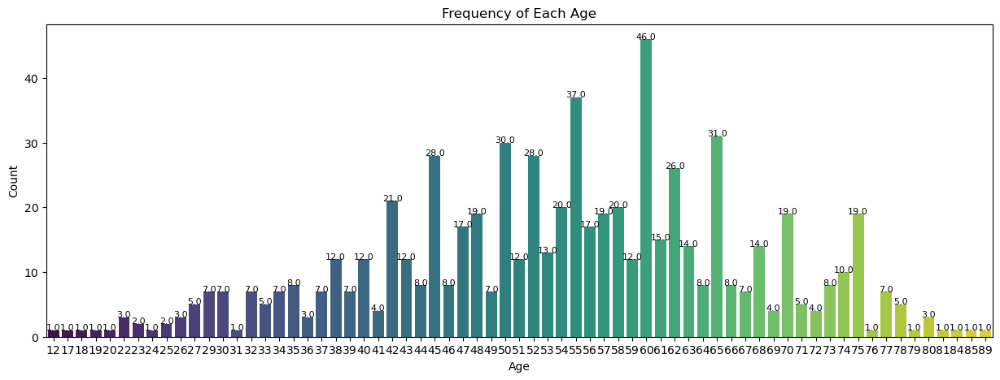

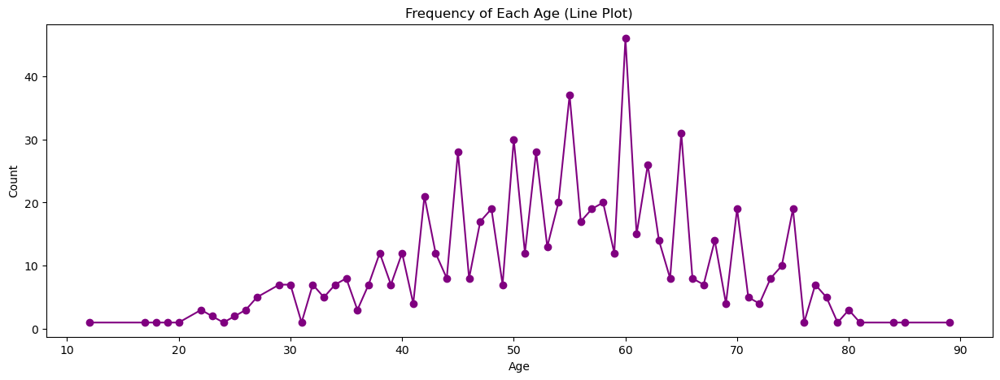

C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


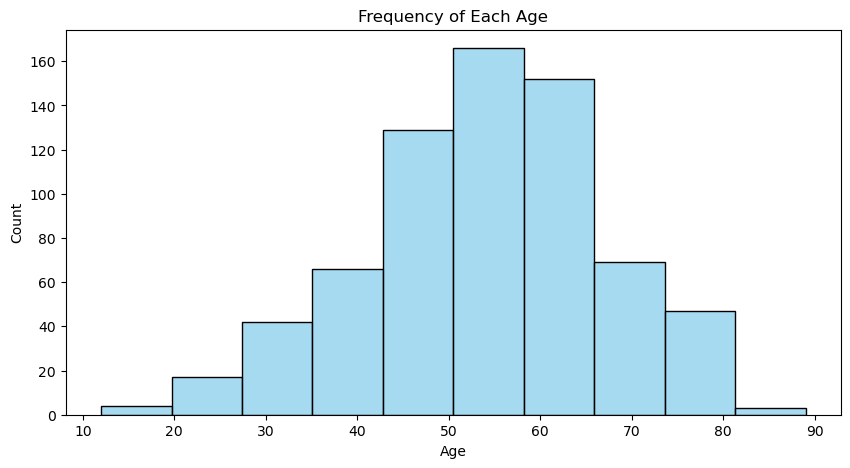

C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


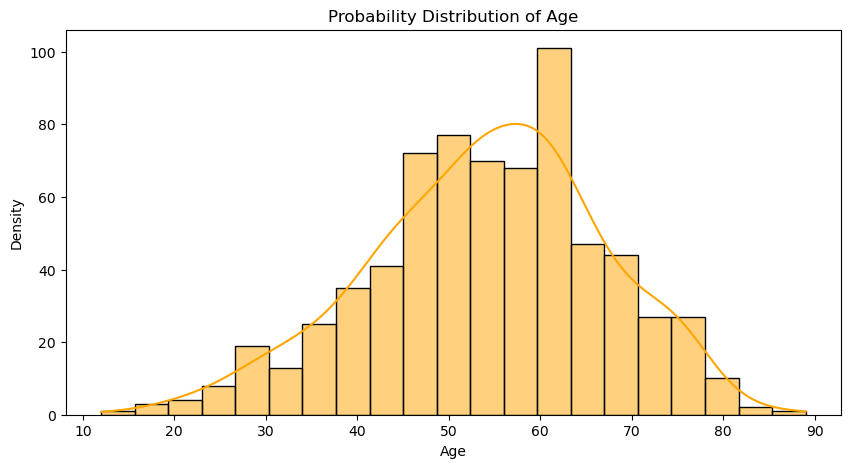

In [77]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(15, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='AGE', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(15, 5))
# sns.lineplot(x=data['AGE'], y=data['AGE'].value_counts().sort_index(), data=df, marker='o', color='purple')
plt.plot(data['AGE'].value_counts().sort_index(), marker='o', color='purple')
plt.title('Frequency of Each Age (Line Plot)')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of each age using a line plot
plt.figure(figsize=(10, 5))
sns.histplot(data['AGE'], kde=False, color='skyblue', bins=10)
plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the probability distribution (kernel density estimation)
plt.figure(figsize=(10, 5))
sns.histplot(data['AGE'], kde=True, color='orange')
plt.title('Probability Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

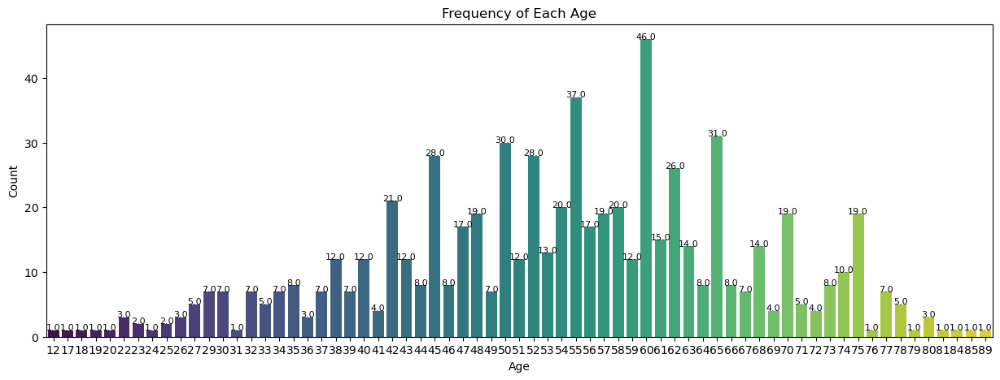

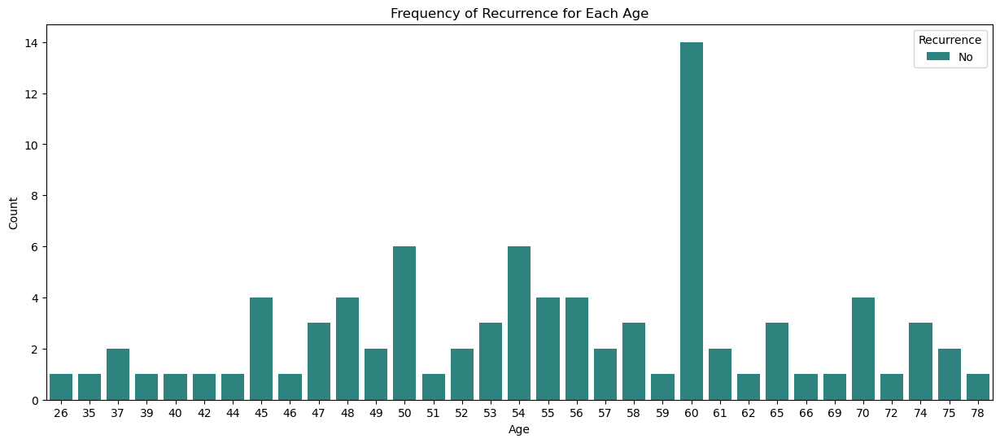

In [83]:
# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(15, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='AGE', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='AGE', data=data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

In [84]:
# II) MAX DIA

In [85]:
data['MAX DIA'].min(), data['MAX DIA'].max()

(0.8, 29.0)

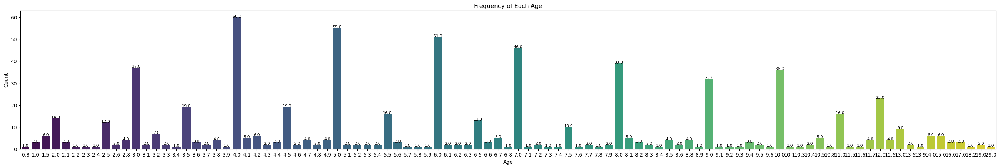

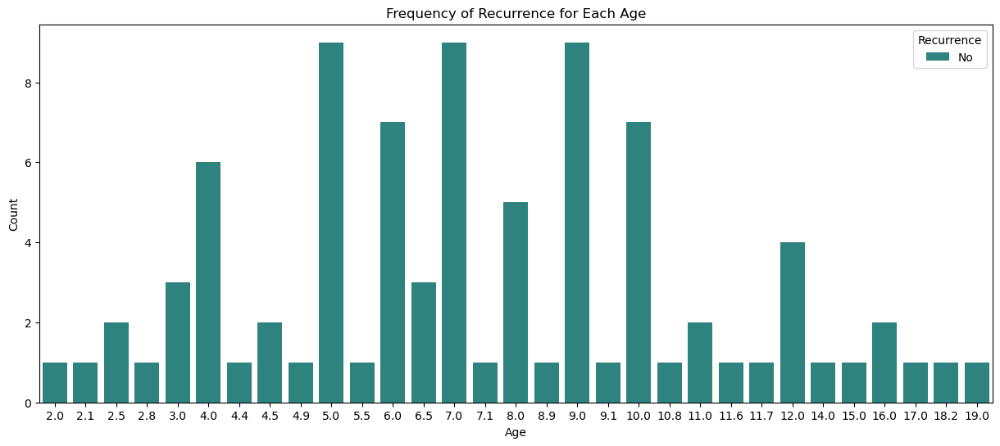

In [87]:
%matplotlib inline

# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(35, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='MAX DIA', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='MAX DIA', data = data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

In [88]:
# III) MONTHS

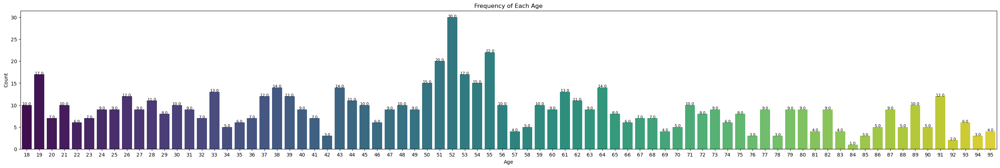

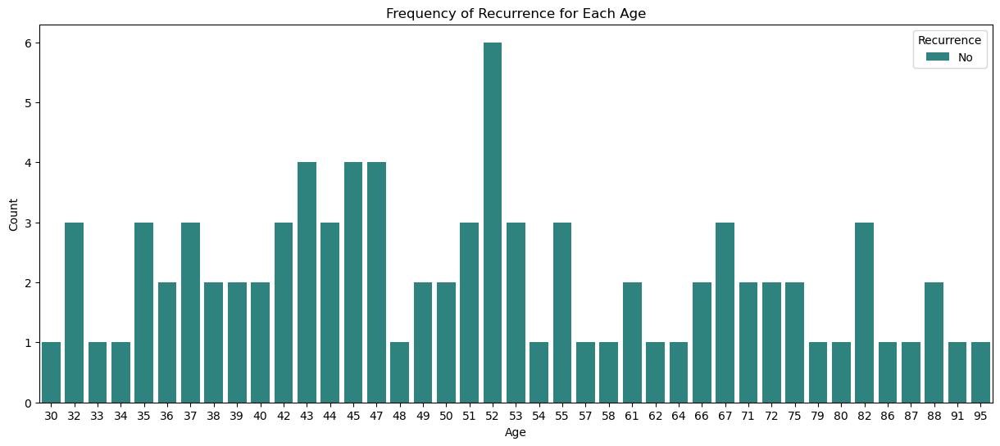

In [90]:
%matplotlib inline

# Plotting the frequency of each age using a bar plot
plt.figure(figsize=(35, 5))
# sns.countplot(x='AGE', data=data, palette='viridis')

ax = sns.countplot(x='MONTHS', data=data, palette='viridis')
# Add frequency labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=8, color='black')

plt.title('Frequency of Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# Plotting the frequency of recurrence for each age
plt.figure(figsize=(15, 6))
sns.countplot(x='MONTHS', data = data[data['RECURRENCE'] == 1].astype({'RECURRENCE': str}), hue='RECURRENCE', palette='viridis')
plt.title('Frequency of Recurrence for Each Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Recurrence', labels=['No', 'Yes'])
plt.show()

In [91]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 695 entries, 0 to 694
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   AGE             695 non-null    int64  
 1   SEX             695 non-null    object 
 2   DM              695 non-null    int64  
 3   HTN             695 non-null    int64  
 4   CKD             695 non-null    int64  
 5   INCIDENTAL      695 non-null    int64  
 6   PAIN            695 non-null    int64  
 7   HEMATURIA       695 non-null    int64  
 8   MASS            695 non-null    int64  
 9   LOW             694 non-null    float64
 10  FEVER           695 non-null    int64  
 11  SITE            695 non-null    object 
 12  T               695 non-null    object 
 13  N               695 non-null    int64  
 14  M               695 non-null    int64  
 15  IVC INV         695 non-null    int64  
 16  MAX DIA         695 non-null    float64
 17  APPROACH        695 non-null    int

In [92]:
data.describe()

,AGE,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,FEVER,N,M,IVC INV,MAX DIA,APPROACH,GRADE,MONTHS,RECURRENCE
count,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,694.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,684.000000,695.000000,695.000000
mean,54.084892,0.128058,0.233094,0.028777,0.326619,0.381295,0.235971,0.023022,0.066282,0.044604,0.066187,0.112230,0.050360,6.666331,1.729496,2.013158,52.658993,0.125180
std,12.858574,0.334395,0.423106,0.167300,0.469314,0.486055,0.424910,0.150080,0.248955,0.206582,0.248788,0.315877,0.218844,3.343442,0.663092,0.915845,20.612179,0.331161
min,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000,1.000000,1.000000,18.000000,0.000000
25%,45.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,1.000000,1.000000,37.000000,0.000000
50%,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2.000000,2.000000,52.000000,0.000000
75%,62.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.800000,2.000000,3.000000,67.000000,0.000000
max,89.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,29.000000,3.000000,4.000000,95.000000,1.000000


In [93]:
data[obj_cols].describe()

,SEX,SITE,T,HISTOPATHOLOGY
count,695,695,695,695
unique,2,3,9,2
top,M,right,1b,clear cell
freq,468,367,178,691


In [94]:
# Great observations! Let's address your points:

# a) **Skewness in Binary Categorical Variables:**
#    - It's not uncommon for binary variables to exhibit skewness, especially if they are imbalanced. Skewness here might indicate an imbalance in the distribution of the 0s and 1s.
#    - Consider visualizing these binary variables using count plots or bar plots to get a clearer picture of the distribution.

# b) **Plotting Categorical Variables with More than 2 Categories:**
#    - For variables with more than two categories, you can use:
#      - **Count plots:** Show the frequency of each category.
#      - **Pie charts:** Provide a visual representation of the proportion of each category.
#      - **Box plots or Violin plots:** Display the distribution of the categories and identify potential outliers.

# c) **Outliers in Categorical Features:**
#    - Outliers in categorical features are not typically defined in the same way as numerical features. Instead, you might look for rare categories that could be considered outliers based on their infrequency.
#    - For highly imbalanced categories, combining or grouping rare categories might be considered to simplify the analysis or improve model performance.

# d) **Insights from Categorical Variables:**
#    - Apart from imbalances and frequencies, consider the following:
#      - **Association with the Target Variable:** Explore the relationship between each categorical feature and the target variable. Are certain categories associated with a higher or lower likelihood of cancer recurrence?
#      - **Correlations:** If applicable, check for associations or correlations between different categorical features. This might provide insights into potential interactions or dependencies.

# Remember to document your findings and observations, especially regarding associations with the target variable. These insights will be valuable when moving on to the next steps in the analysis. If you have specific categorical features you'd like to explore further or any other questions, feel free to share!

In [95]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


In [96]:
def bar_plot(col):
    # Plotting the frequency of each age using a bar plot
    plt.figure(figsize=(10, 5))

    ax = sns.countplot(x=col, data=data, palette='viridis')
    non_nans = data[col].notna().sum()
    # Add frequency labels on top of each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height(), round(p.get_height() / non_nans, 3)}',
                    (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline', fontsize=8, color='black')

    plt.title(f'Frequency of Each {col}')
    plt.xlabel(f"{col}")
    plt.ylabel('Count')
    plt.show()

In [97]:
def pie_chart1(col):
    # Count the occurrences of each category in the column
    category_counts = data[col].value_counts()

    # Plotting the pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', colors=sns.color_palette('viridis'), startangle=90)
    plt.legend(category_counts.index, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(f'Distribution of {col}')
    plt.show()

def pie_chart2(col):
    category_counts = data[col].value_counts()
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', colors=sns.color_palette('viridis'), startangle=90)
    
    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.title(f'Distribution of {col}')
    plt.show()

In [98]:
def pie_chart_with_explode(col, explode_category=None, explode_factor=0.1):
    category_counts = data[col].value_counts()
    explode = [explode_factor if label == explode_category else 0 for label in category_counts.index]
    
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', explode=explode, colors=sns.color_palette('viridis'), startangle=90)
    
    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.title(f'Distribution of {col}')
    plt.show()

def pie_chart_with_inverse_explode(col):
    # Count the occurrences of each category in the column
    category_counts = data[col].value_counts()

    # Calculate explosion factors inversely proportional to category counts
    explode_factors = (1 - category_counts / category_counts.max()) * 0.3

    # Create a pie chart with the calculated explode factors
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(category_counts, labels=None, autopct='', explode=explode_factors, colors=sns.color_palette('viridis'), startangle=90)

    # Create a legend with percentages
    legend_labels = [f'{label} ({percentage:.1f}%)' for label, percentage in zip(category_counts.index, category_counts / category_counts.sum() * 100)]
    plt.legend(wedges, legend_labels, title=col, loc='center left', bbox_to_anchor=(1, 0.5))

    # Set the title for the pie chart
    plt.title(f'Distribution of {col}')

    # Display the pie chart
    plt.show()

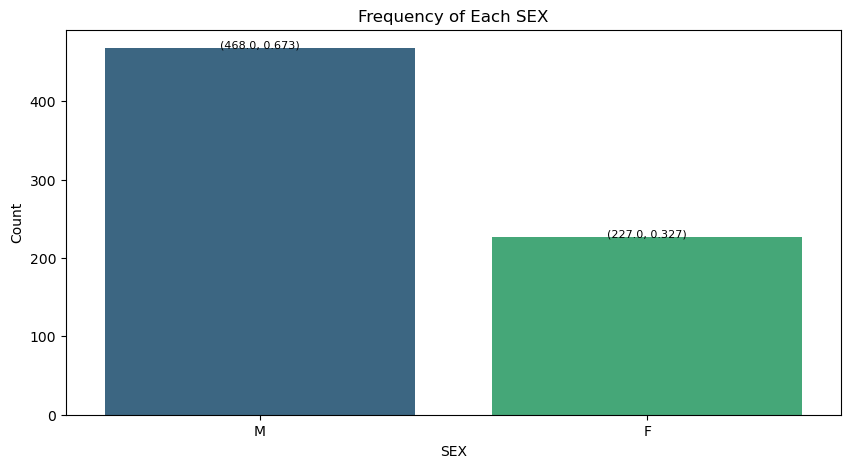

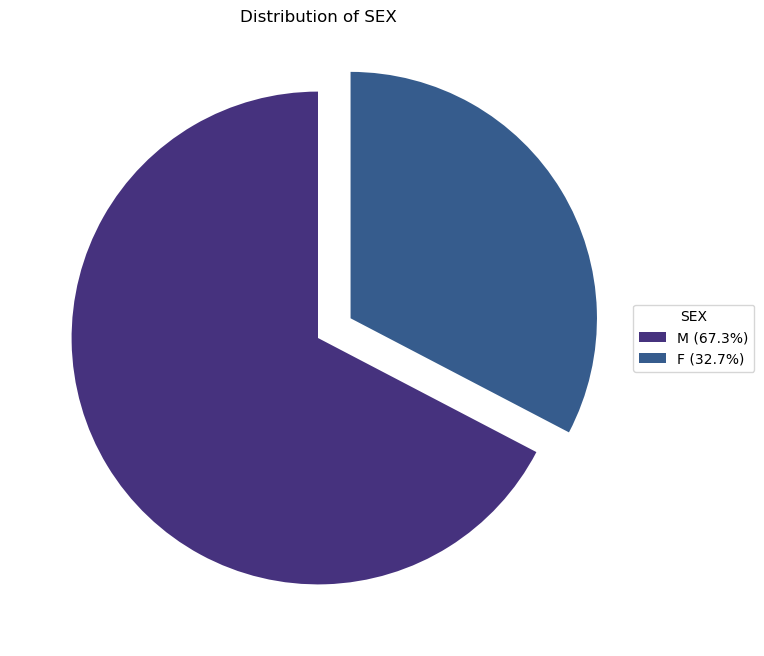

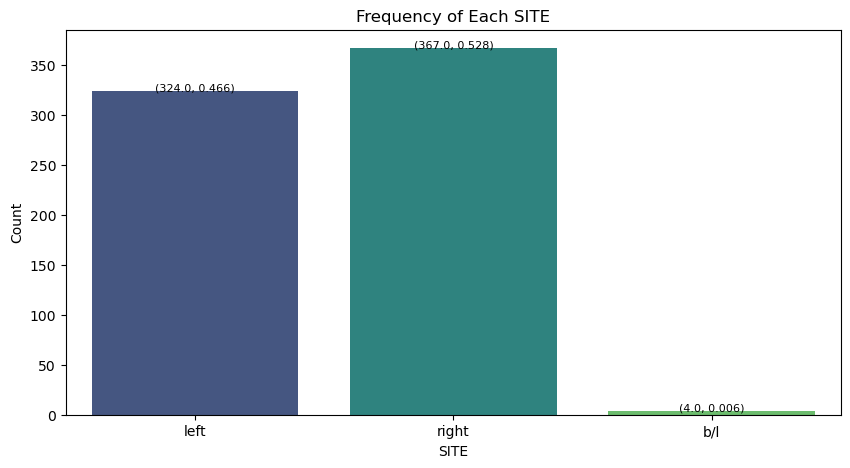

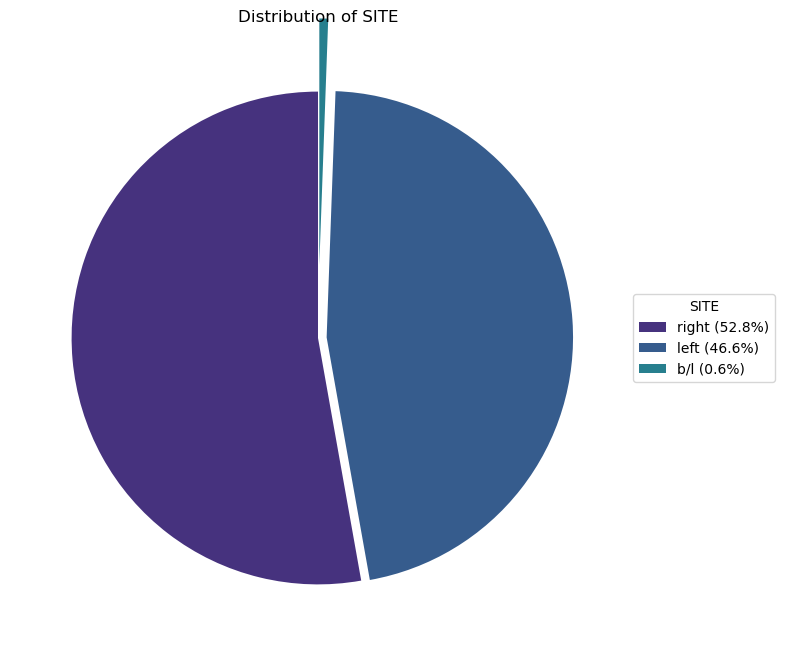

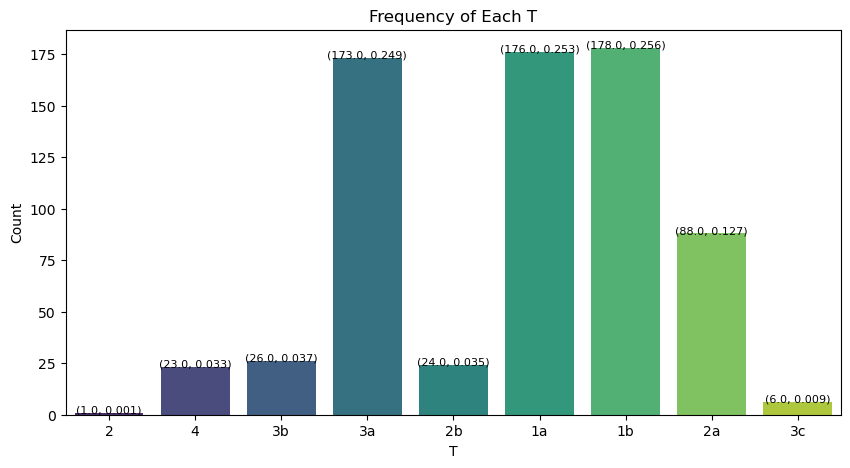

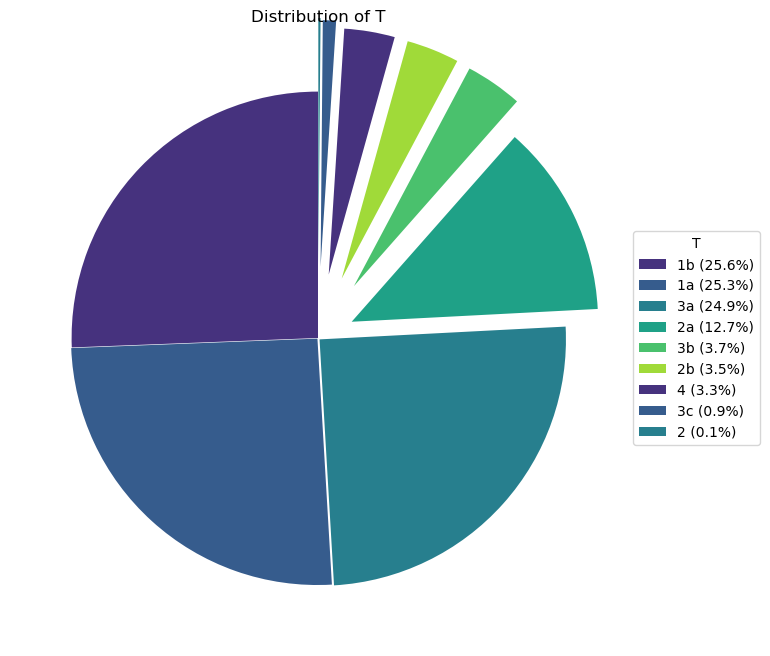

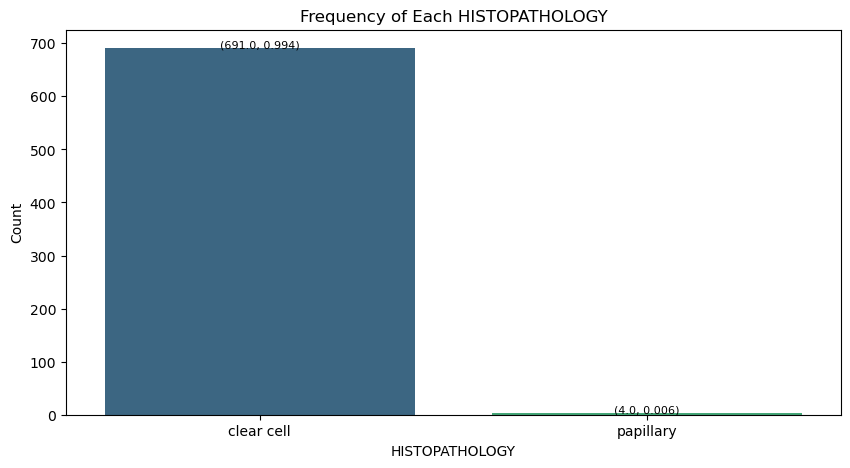

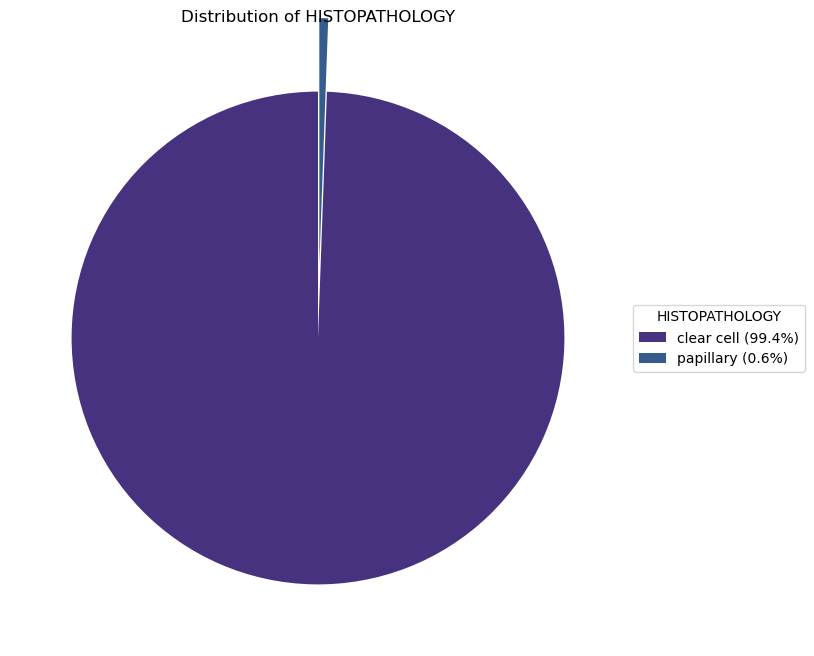

In [99]:
for col in obj_cols:
    bar_plot(col)
#     pie_chart1(col)
    pie_chart_with_inverse_explode(col)

In [100]:
# SEX: MALE dominated, not by much
# SITE: bilateral is extremely rare, almost like an outlier. left is a bit less than right
# T: 1a and 1b are super dominant; 2a has half the frequency, while 2b is much rarer; the sum of 2 as a whole isn't enough
# to trouble the top 3 in terms of frequency; 3a is as dominant as 1a and 1b, 3b is as rare as 2a, 3c is even rarer; 4 is
# surprisingly common, compared to 3c, as common as 2b; the stray 2 is an outlier and i'm pretty sure a typo.
# HISTOPATHOLOGY: the clear cell type is extremely dominant; papillary is almost an outlier

In [101]:
column_print()

Object columns:
SEX: object, 2
SITE: object, 3
T: object, 9
HISTOPATHOLOGY: object, 2

Numeric categorical columns:
DM: int64, 2
HTN: int64, 2
CKD: int64, 2
INCIDENTAL: int64, 2
PAIN: int64, 2
HEMATURIA: int64, 2
MASS: int64, 2
LOW: float64, 2
FEVER: int64, 2
N: int64, 2
M: int64, 2
IVC INV: int64, 2
APPROACH: int64, 3
GRADE: float64, 4
RECURRENCE: int64, 2

Numeric continuous columns:
AGE: int64, 67
MAX DIA: float64, 97
MONTHS: int64, 78


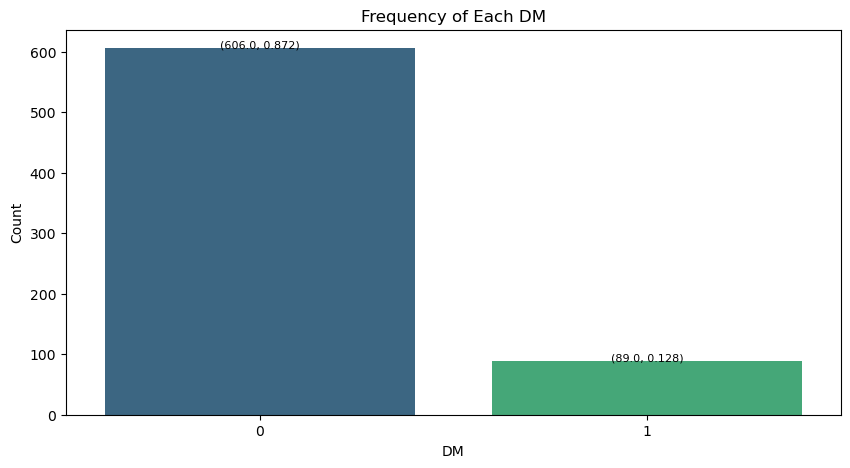

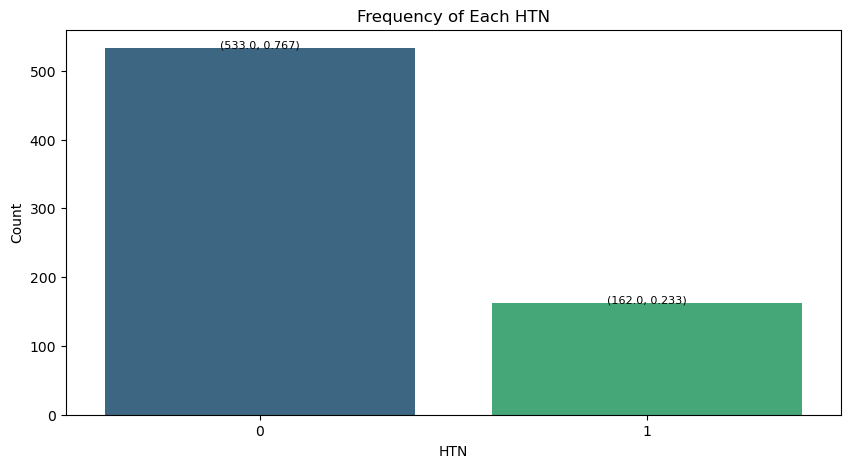

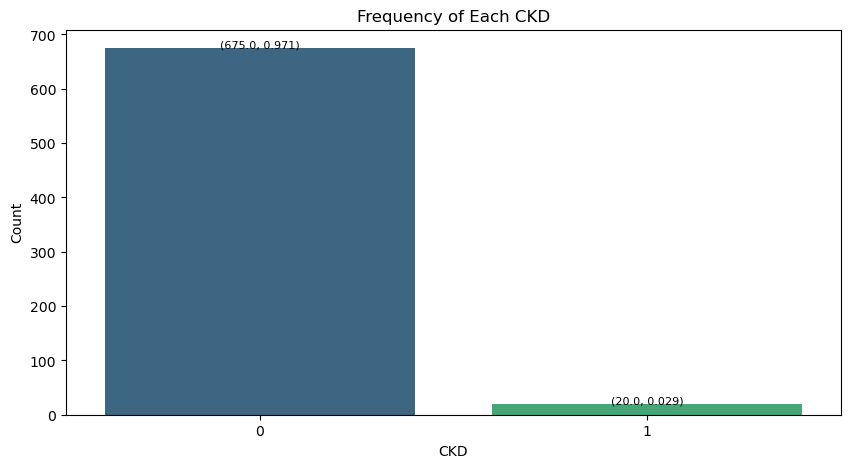

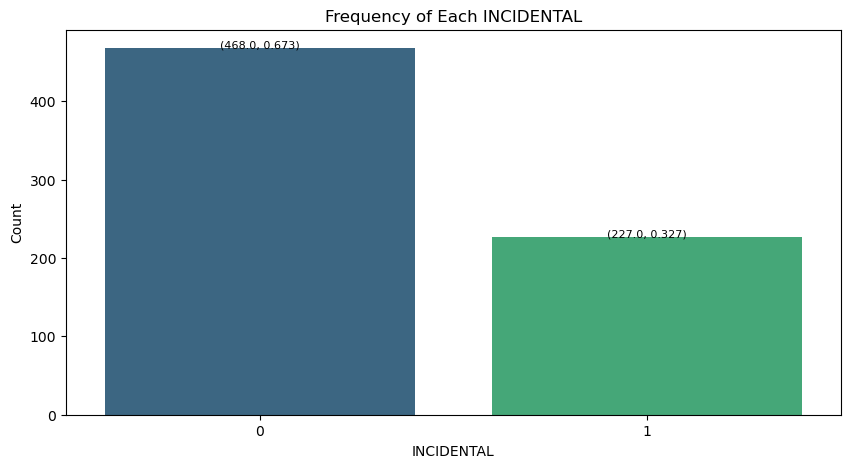

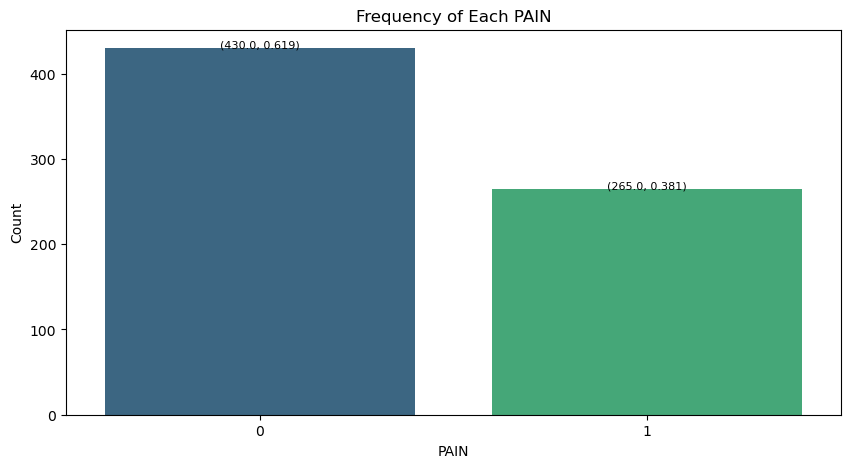

...

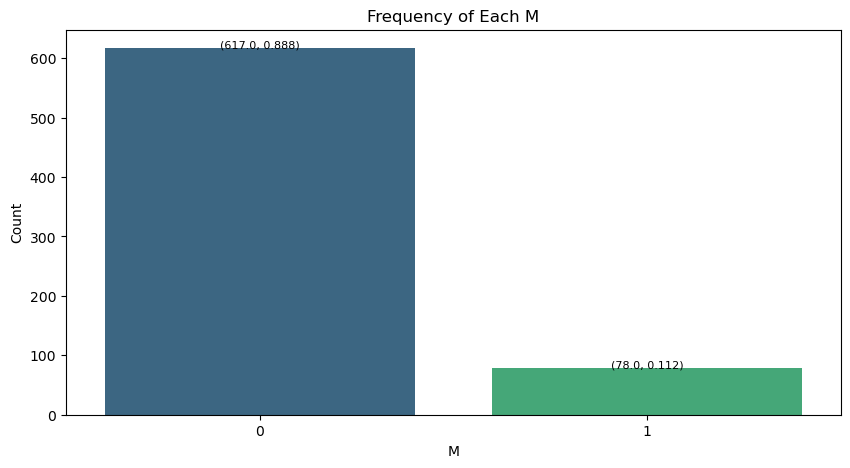

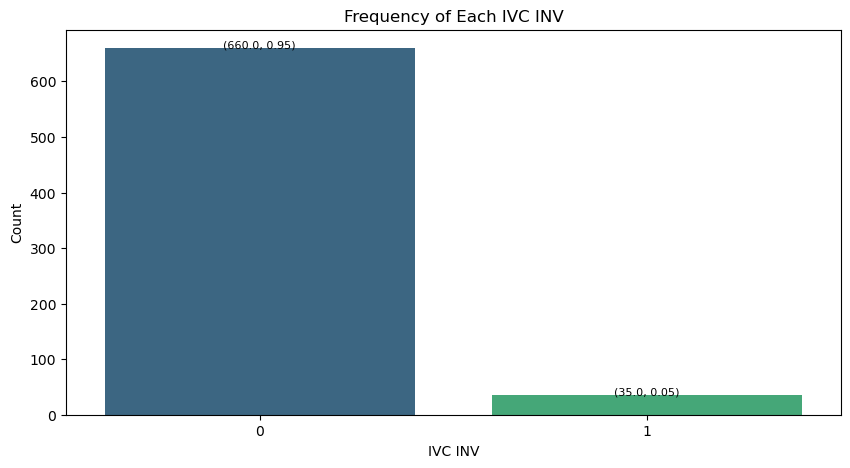

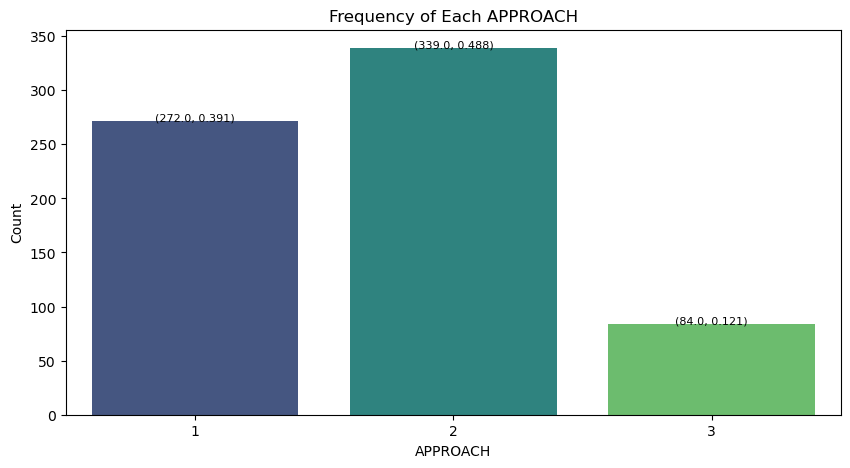

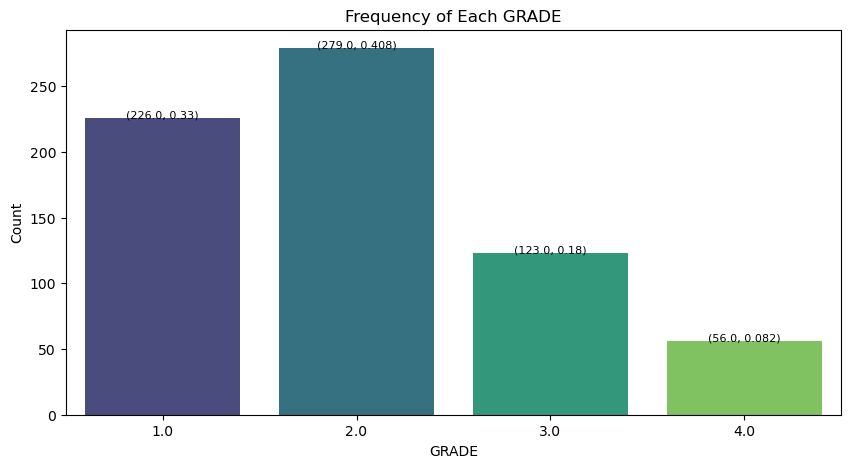

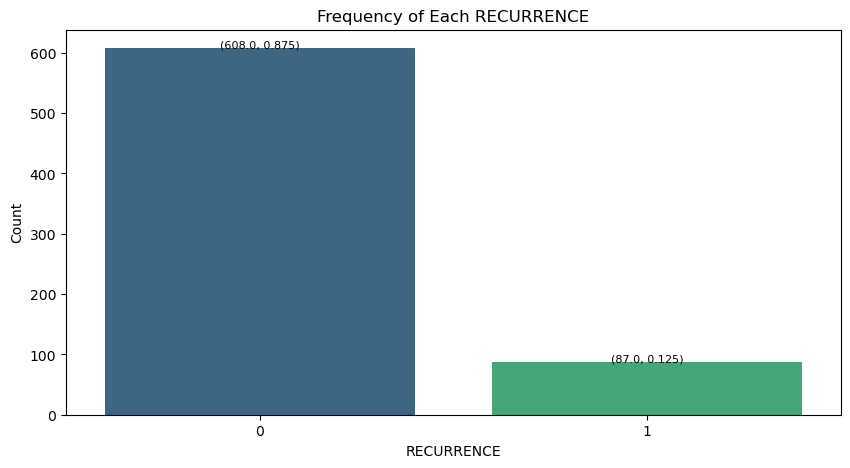

In [102]:
for col in num_cat_cols:
    bar_plot(col)

In [103]:
# the most common comorbidity is HTN, followed by DM; CKD is extremely rare
# most common clinical presentation is PAIN, followed by INCIDENTAL and HEMATURIA; MASS, LOW and FEVER are relatively rare
# very few patients have N1, cancer spread to nearby lymph nodes
# likewise M1, distant metastasis (secondary tumour), though the frequency is a bit higher
# IVC INVOLVEMENT is very, very rare
# LAPAROSCOPIC SURGERY is the most common; OPEN SURGERY isn't too far behind; ROBOTIC SURGERY is relatively rare, but not
# too rare
# FUHRMAN GRADE 2 is the most common, closely followed by 1; 3 is nearly half of 2, and 4 is nearly a quarter of 2
# RECURRENCE is quite rare, but not extremely rare.

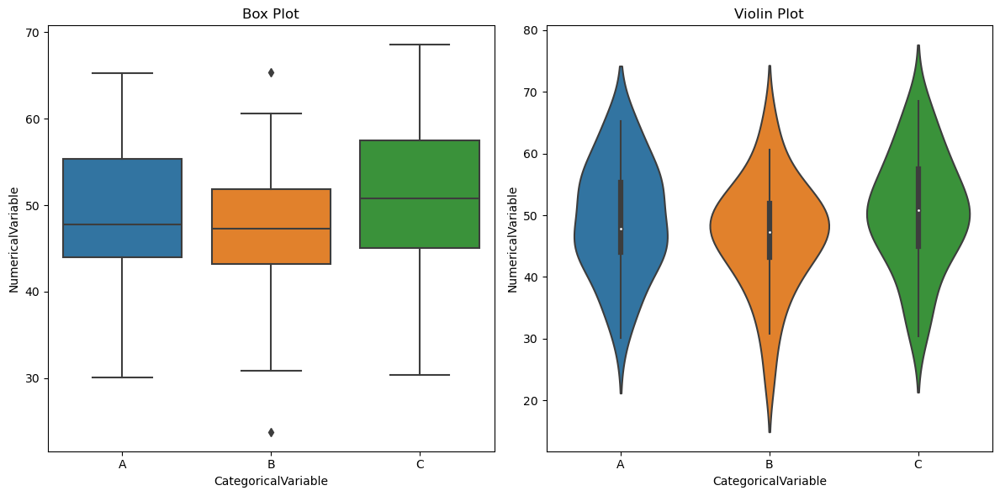

In [104]:
# Create a toy dataset
np.random.seed(42)

# Numerical variable
numerical_data = np.random.normal(loc=50, scale=10, size=100)

# Categorical variable
categories = np.random.choice(['A', 'B', 'C'], size=100)

# Combine into a DataFrame
toy_data = pd.DataFrame({'NumericalVariable': numerical_data, 'CategoricalVariable': categories})

# Create a box plot
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x='CategoricalVariable', y='NumericalVariable', data=toy_data)
plt.title('Box Plot')

# Create a violin plot
plt.subplot(1, 2, 2)
sns.violinplot(x='CategoricalVariable', y='NumericalVariable', data=toy_data)
plt.title('Violin Plot')

# Show the plots
plt.tight_layout()
plt.show()

In [105]:
# save the box and whisker and violin plots for later please

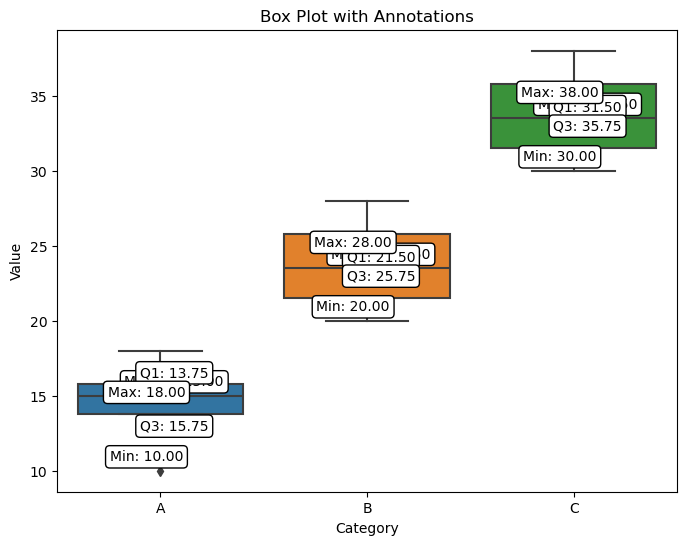

In [106]:
# Create a sample dataset
toy_data = {
    'Category': ['A', 'A', 'B', 'B', 'C', 'C', 'A', 'B', 'C', 'A', 'B', 'C'],
    'Value': [10, 15, 20, 25, 30, 35, 15, 22, 32, 18, 28, 38]
}

df = pd.DataFrame(toy_data)

# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(8, 6))
sns.boxplot(x='Category', y='Value', data=df)

# Annotate the box plot with numerical values
for category in df['Category'].unique():
    subset = df[df['Category'] == category]
    median = subset['Value'].median()
    q1 = subset['Value'].quantile(0.25)
    q3 = subset['Value'].quantile(0.75)
    minimum = subset['Value'].min()
    maximum = subset['Value'].max()

    # Convert category to numerical position
    x_pos = df['Category'].unique().tolist().index(category)

    plt.annotate(f'Median: {median:.2f}', xy=(x_pos, median), xytext=(10, 10),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Q1: {q1:.2f}', xy=(x_pos, q1), xytext=(10, 30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Q3: {q3:.2f}', xy=(x_pos, q3), xytext=(10, -30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Min: {minimum:.2f}', xy=(x_pos, minimum), xytext=(-10, 10),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

    plt.annotate(f'Max: {maximum:.2f}', xy=(x_pos, maximum), xytext=(-10, -30),
                 textcoords='offset points', ha='center', va='center', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

plt.title('Box Plot with Annotations')
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_14984\3929808456.py:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


  Category  Median     Q1     Q3 Min Max Outliers
0        A    16.5  15.00  42.00  10  70       []
1        B    26.5  22.75  48.25  20  75       []
2        C    36.5  32.75  54.50  30  80       []


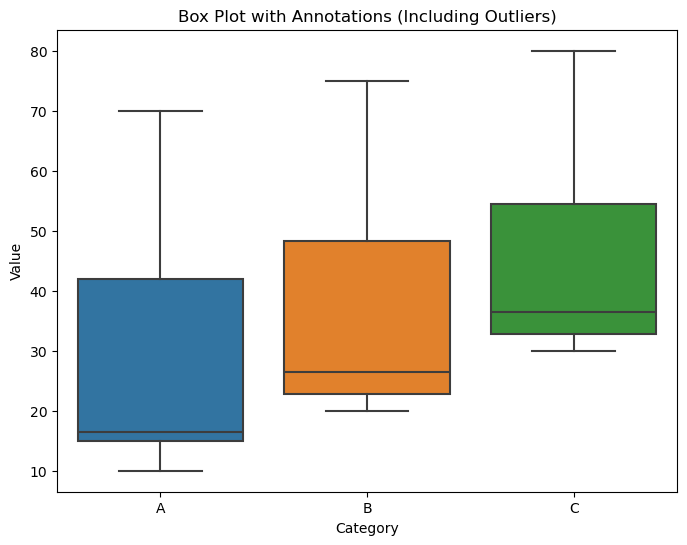

In [116]:
# Create a sample dataset
toy_data = {
    'Category': ['A', 'A', 'B', 'B', 'C', 'C', 'A', 'B', 'C', 'A', 'B', 'C', 'A', 'B', 'C', 'A', 'B', 'C'],
    'Value': [10, 15, 20, 25, 30, 35, 15, 22, 32, 18, 28, 38, 50, 55, 60, 70, 75, 80]
}

df = pd.DataFrame(toy_data)

# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(8, 6))

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(df['Category'].unique())}

sns.boxplot(x='Category', y='Value', data=df)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['Category', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in df['Category'].unique():
    subset = df[df['Category'] == category]
    median = subset['Value'].median()
    q1 = subset['Value'].quantile(0.25)
    q3 = subset['Value'].quantile(0.75)
    minimum = subset['Value'].min()
    maximum = subset['Value'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['Value'] < lower_bound) | (subset['Value'] > upper_bound)]['Value'].tolist()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'Category': [category],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # # Create a temporary dataframe for each category
    # temp_df = pd.DataFrame({
    #     'Category': [category],
    #     'Median': [median],
    #     'Q1': [q1],
    #     'Q3': [q3],
    #     'Min': [minimum],
    #     'Max': [maximum],
    #     'Outliers': [outliers]
    # })

    # # Concatenate the temporary dataframe with the existing annotation_table
    # annotation_table = pd.concat([annotation_table, temp_df], ignore_index=True)

    # Annotate outliers on the plot
    for outlier in outliers:
        plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
                     textcoords='offset points', ha='center', va='center', color='red',
                     bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
print(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')
plt.show()

In [113]:
# NUMERICAL CONTINUOUS COLUMNS

In [118]:
data[num_cont_cols].describe()

,AGE,MAX DIA,MONTHS
count,695.000000,695.000000,695.000000
mean,54.084892,6.666331,52.658993
std,12.858574,3.343442,20.612179
min,12.000000,0.800000,18.000000
25%,45.000000,4.000000,37.000000
50%,55.000000,6.000000,52.000000
75%,62.000000,8.800000,67.000000
max,89.000000,29.000000,95.000000


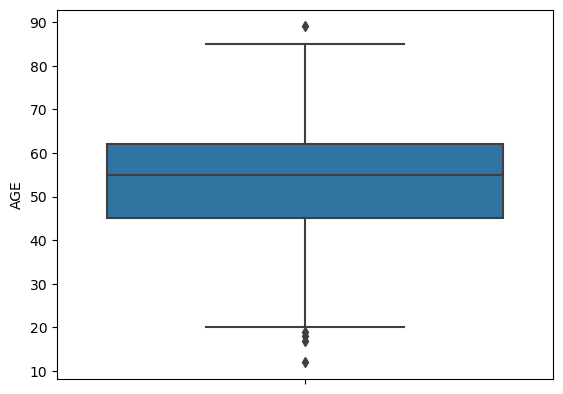

In [119]:
sns.boxplot(y = 'AGE', data = data)
plt.show()

C:\Users\aniru\AppData\Local\Temp\ipykernel_14984\3208525384.py:35: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


  RECURRENCE Count       Mean        Std  Median    Q1    Q3 Min Max  Outliers
0          0   608  53.860197  13.214310    55.0  45.0  63.0  12  89  [12, 17]
1          1    87  55.655172   9.947335    55.0  49.5  60.0  26  78  [26, 78]


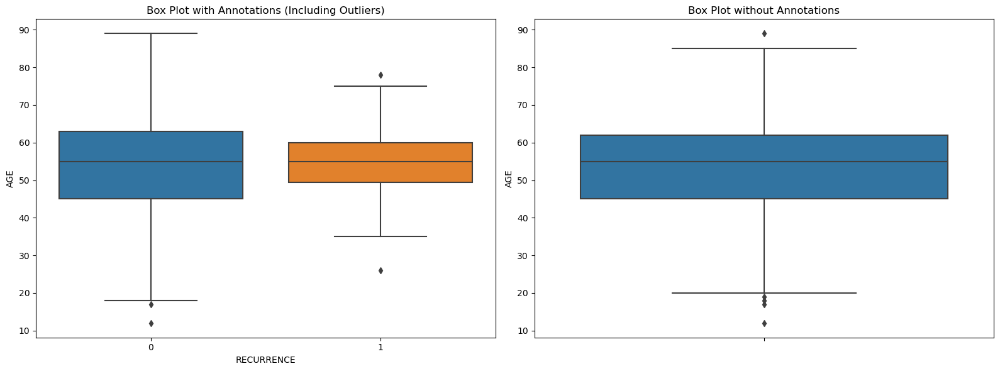

  Statistic         AGE
0     count  695.000000
1      mean   54.084892
2       std   12.858574
3       min   12.000000
4       25%   45.000000
5       50%   55.000000
6       75%   62.000000
7       max   89.000000


In [117]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='AGE', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['AGE'].count()
    mean = subset['AGE'].mean()
    std = subset['AGE'].std()
    median = subset['AGE'].median()
    q1 = subset['AGE'].quantile(0.25)
    q3 = subset['AGE'].quantile(0.75)
    minimum = subset['AGE'].min()
    maximum = subset['AGE'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['AGE'] < lower_bound) | (subset['AGE'] > upper_bound)]['AGE'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
print(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='AGE', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'AGE' variable without 'RECURRENCE'
age_table = data['AGE'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)
# age_table = data['AGE'].describe().reset_index().rename(columns={'index': 'Statistic'}).T
# outliers = data[(data['AGE'] < lower_bound) | (data['AGE'] > upper_bound)]['AGE'].tolist()
# age_table['Outliers'] = ', '.join(map(str, outliers))
# print(age_table)

C:\Users\aniru\AppData\Local\Temp\ipykernel_14984\2131982510.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


,RECURRENCE,Count,Mean,Std,Median,Q1,Q3,Min,Max,Outliers
0,0,608,6.512336,3.263739,6.0,4.0,8.2,0.8,29.0,"[15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 17.0, 17.0, 19.0, 29.0]"
1,1,87,7.742529,3.699486,7.0,5.0,10.0,2.0,19.0,"[18.2, 19.0]"


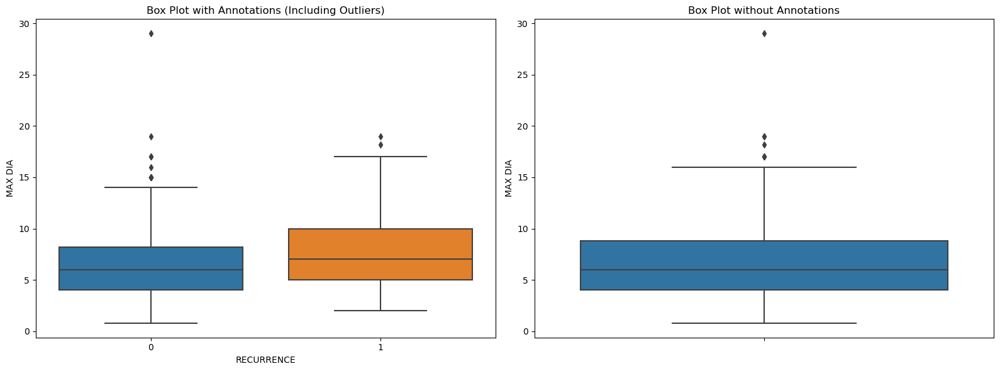

  Statistic     MAX DIA
0     count  695.000000
1      mean    6.666331
2       std    3.343442
3       min    0.800000
4       25%    4.000000
5       50%    6.000000
6       75%    8.800000
7       max   29.000000


In [120]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Set pandas display options to show more content in each cell
pd.set_option('display.max_colwidth', None)

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='MAX DIA', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['MAX DIA'].count()
    mean = subset['MAX DIA'].mean()
    std = subset['MAX DIA'].std()
    median = subset['MAX DIA'].median()
    q1 = subset['MAX DIA'].quantile(0.25)
    q3 = subset['MAX DIA'].quantile(0.75)
    minimum = subset['MAX DIA'].min()
    maximum = subset['MAX DIA'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['MAX DIA'] < lower_bound) | (subset['MAX DIA'] > upper_bound)]['MAX DIA'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
display(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='MAX DIA', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'MAX DIA' variable without 'RECURRENCE'
age_table = data['MAX DIA'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)

C:\Users\aniru\AppData\Local\Temp\ipykernel_14984\2125889981.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  annotation_table = pd.concat([annotation_table, pd.DataFrame({


,RECURRENCE,Count,Mean,Std,Median,Q1,Q3,Min,Max,Outliers
0,0,608,52.506579,21.156745,52.0,34.0,68.0,18,95,[]
1,1,87,53.724138,16.369064,51.0,42.0,65.0,30,95,[]


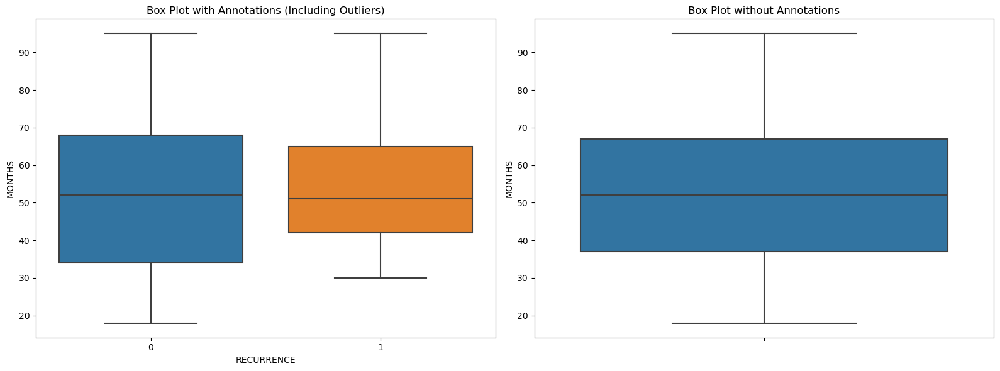

  Statistic      MONTHS
0     count  695.000000
1      mean   52.658993
2       std   20.612179
3       min   18.000000
4       25%   37.000000
5       50%   52.000000
6       75%   67.000000
7       max   95.000000


In [121]:
# Create a box plot for the categorical variable 'Category' and numerical variable 'Value'
plt.figure(figsize=(16, 6))

# Set pandas display options to show more content in each cell
pd.set_option('display.max_colwidth', None)

# Subplot 1: Box plot with annotations
plt.subplot(1, 2, 1)

# Get numerical positions for each category
category_positions = {category: i for i, category in enumerate(data['RECURRENCE'].unique())}

sns.boxplot(x='RECURRENCE', y='MONTHS', data=data)

# Create a table for annotations
annotation_table = pd.DataFrame(columns=['RECURRENCE', 'Count', 'Mean', 'Std', 'Median', 'Q1', 'Q3', 'Min', 'Max', 'Outliers'])

# Annotate the box plot with numerical values and outliers, and update the table
for category in data['RECURRENCE'].unique():
    subset = data[data['RECURRENCE'] == category]
    count = subset['MONTHS'].count()
    mean = subset['MONTHS'].mean()
    std = subset['MONTHS'].std()
    median = subset['MONTHS'].median()
    q1 = subset['MONTHS'].quantile(0.25)
    q3 = subset['MONTHS'].quantile(0.75)
    minimum = subset['MONTHS'].min()
    maximum = subset['MONTHS'].max()

    # Identify outliers using 1.5*IQR criterion
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = subset[(subset['MONTHS'] < lower_bound) | (subset['MONTHS'] > upper_bound)]['MONTHS'].tolist()
    outliers.sort()

    # Add data to the table
    annotation_table = pd.concat([annotation_table, pd.DataFrame({
        'RECURRENCE': [category],
        'Count': [count],
        'Mean': [mean],
        'Std': [std],
        'Median': [median],
        'Q1': [q1],
        'Q3': [q3],
        'Min': [minimum],
        'Max': [maximum],
        'Outliers': [outliers]
    })], ignore_index=True)

    # Annotate outliers on the plot
#     for outlier in outliers:
#         plt.annotate(f'Outlier: {outlier:.2f}', xy=(category_positions[category], outlier), xytext=(-10, 10),
#                      textcoords='offset points', ha='center', va='center', color='red',
#                      bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Display the table
display(annotation_table)

plt.title('Box Plot with Annotations (Including Outliers)')

# Subplot 2: Box plot for comparison
plt.subplot(1, 2, 2)
sns.boxplot(y='MONTHS', data=data)
plt.title('Box Plot without Annotations')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Table for 'MONTHS' variable without 'RECURRENCE'
age_table = data['MONTHS'].describe().reset_index().rename(columns={'index': 'Statistic'})
print(age_table)

In [122]:
# Set pandas display options to show more content in each cell
pd.reset_option('display.max_colwidth')

In [3]:
# old people don't get recurrence because they seem to die before getting it
# also many young people don't get recurrences as much
# fewer months treated either points to successful treatment, or death
# mortality won't be there in the final data but it's all-pervading
# max dia has some serious outlier problems...

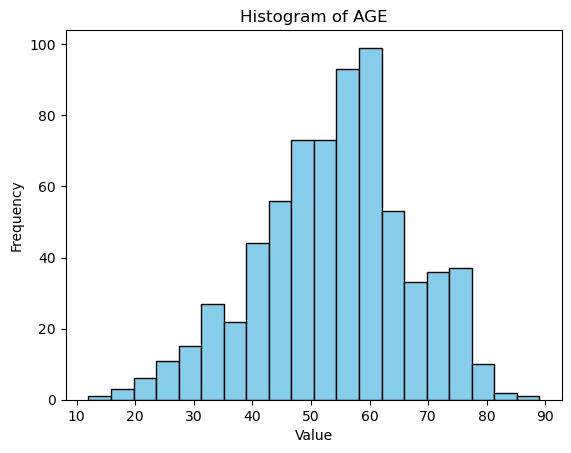

In [124]:
# Create a histogram
plt.hist(data['AGE'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of AGE')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

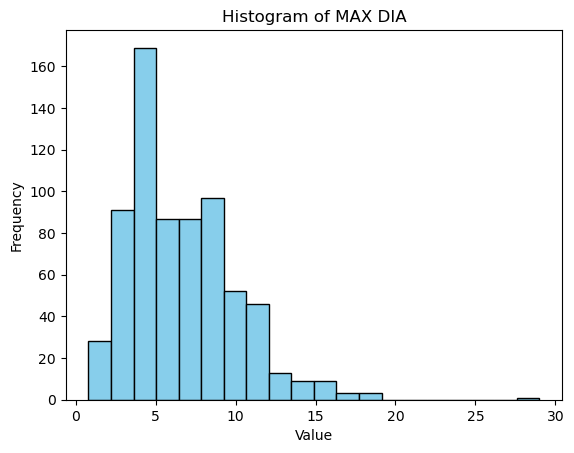

In [125]:
# Create a histogram
plt.hist(data['MAX DIA'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of MAX DIA')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

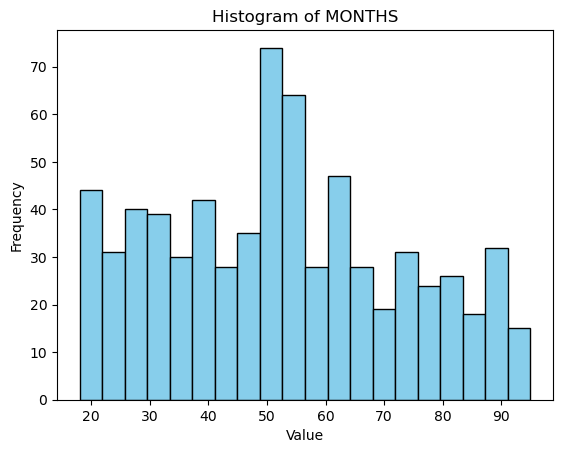

In [126]:
# Create a histogram
plt.hist(data['MONTHS'], bins=20, color='skyblue', edgecolor='black')
# sns.kdeplot(data['AGE'], fill=True, color='skyblue')

# Add labels and title
plt.title('Histogram of MONTHS')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [127]:
# age has a slight left skew, a roughly normal distribution
# max dia is right skewed, has many outliers
# age has a more uniform distribution compared to the others, but ceertain age groups are way more represented

In [128]:
# Create a DataFrame (replace this with your actual data)
np.random.seed(42)  # For reproducibility
toy_data = pd.DataFrame({
    'Variable1': np.random.randn(100),
    'Variable2': np.random.randn(100),
    'Variable3': np.random.randn(100),
    'Variable4': np.random.randn(100)
})

# Create a correlation matrix
correlation_matrix = toy_data.corr()

# Display the correlation matrix
print(correlation_matrix)

           Variable1  Variable2  Variable3  Variable4
Variable1   1.000000  -0.136422   0.190840  -0.170227
Variable2  -0.136422   1.000000  -0.036632  -0.017613
Variable3   0.190840  -0.036632   1.000000  -0.000259
Variable4  -0.170227  -0.017613  -0.000259   1.000000


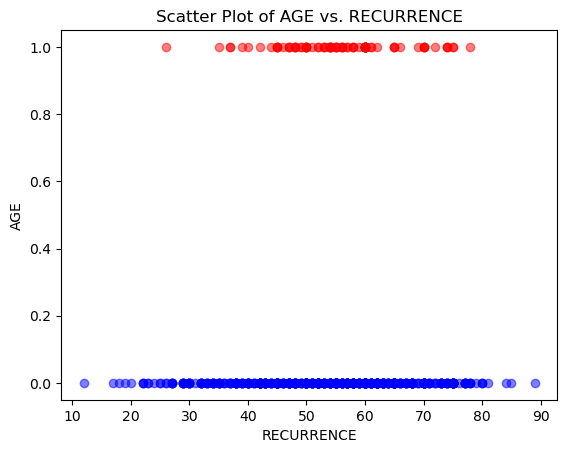

In [129]:
# Separate data based on the binary variable
REC_0 = data[data['RECURRENCE'] == 0]
REC_1 = data[data['RECURRENCE'] == 1]

# Create a scatter plot with different colors for 0-markers and 1-markers
plt.scatter(REC_0['AGE'], REC_0['RECURRENCE'], alpha=0.5, color='blue', label='RECURRENCE = 0')
plt.scatter(REC_1['AGE'], REC_1['RECURRENCE'], alpha=0.5, color='red', label='RECURRENCE = 1')

# Add labels and title
plt.title('Scatter Plot of AGE vs. RECURRENCE')
plt.xlabel('RECURRENCE')
plt.ylabel('AGE')

# Show the plot
plt.show()

In [130]:
[1, 2] + [3]

[1, 2, 3]

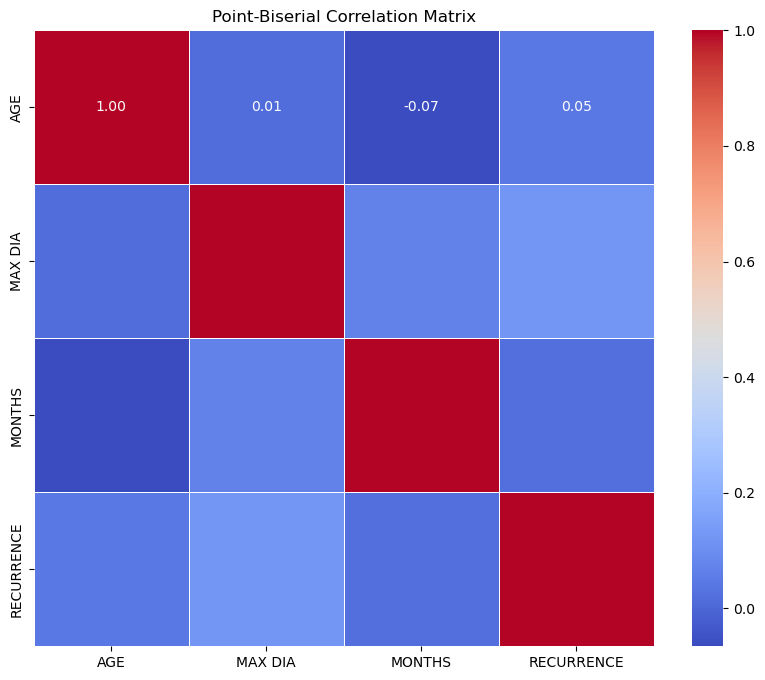

RECURRENCE    1.000000
MAX DIA       0.121848
AGE           0.046228
MONTHS        0.019562
Name: RECURRENCE, dtype: float64


In [131]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='pearson')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

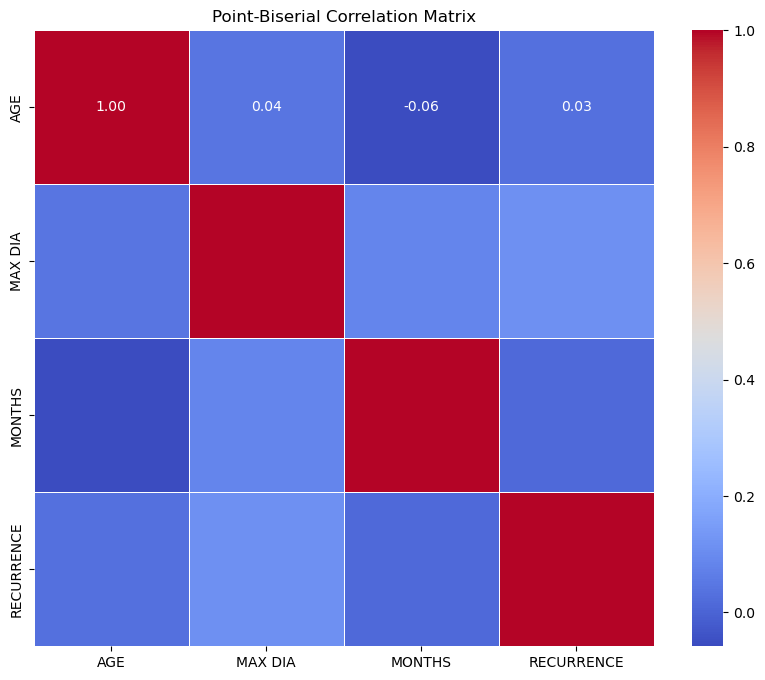

RECURRENCE    1.000000
MAX DIA       0.114908
AGE           0.032286
MONTHS        0.014089
Name: RECURRENCE, dtype: float64


In [132]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='spearman')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

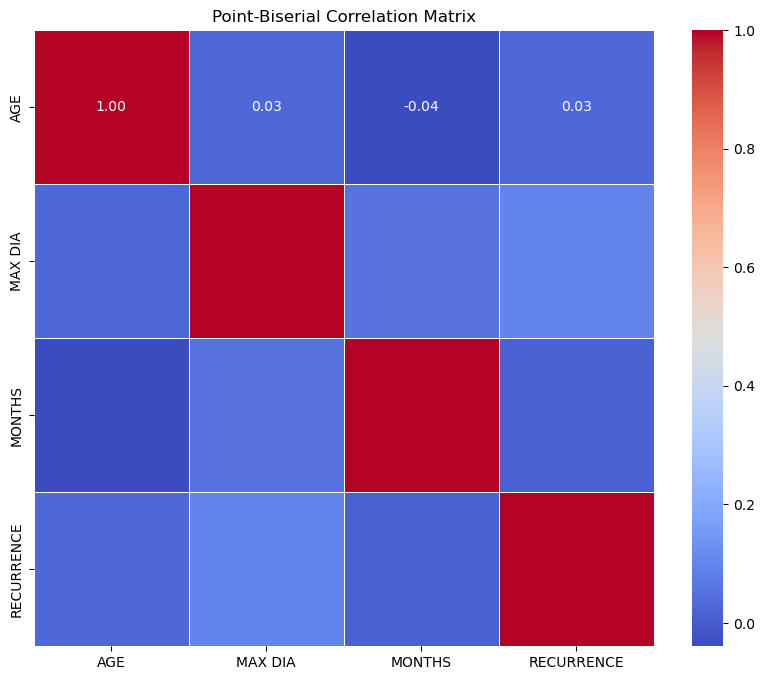

RECURRENCE    1.000000
MAX DIA       0.095668
AGE           0.026724
MONTHS        0.011597
Name: RECURRENCE, dtype: float64


In [133]:
# Assuming df is your DataFrame and 'target' is the binary target column
temp_df = data[num_cont_cols + ['RECURRENCE']]
correlation_matrix = temp_df.corr(method='kendall')
correlation_with_target = correlation_matrix['RECURRENCE'].sort_values(ascending=False)

# Plotting a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Point-Biserial Correlation Matrix')
plt.show()

# Display correlation with the target
print(correlation_with_target)

In [134]:
# BIVARIATE ANALYSIS -------------------------------------------------------------------------------------------------------

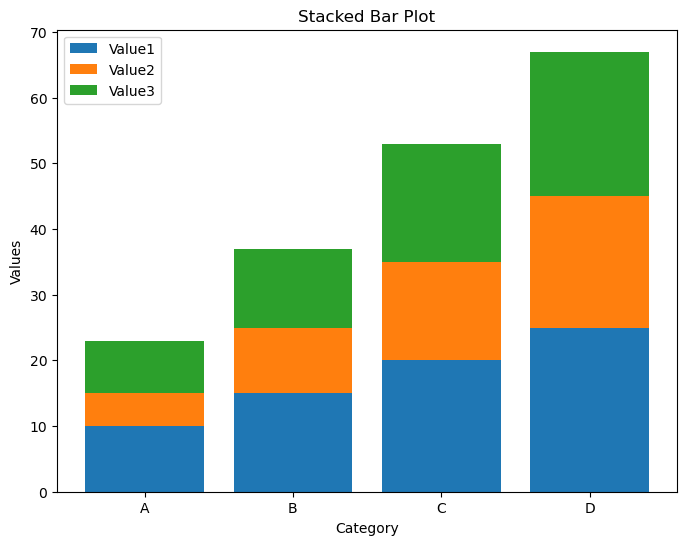

In [135]:
# Create a DataFrame (replace this with your actual data)
toy_data = pd.DataFrame({
    'Category': ['A', 'B', 'C', 'D'],
    'Value1': [10, 15, 20, 25],
    'Value2': [5, 10, 15, 20],
    'Value3': [8, 12, 18, 22]
})

# Set the figure size
plt.figure(figsize=(8, 6))

# Create stacked bar plot
plt.bar(toy_data['Category'], toy_data['Value1'], label='Value1')
plt.bar(toy_data['Category'], toy_data['Value2'], bottom=toy_data['Value1'], label='Value2')
plt.bar(toy_data['Category'], toy_data['Value3'], bottom=toy_data['Value1'] + toy_data['Value2'], label='Value3')

# Add labels and title
plt.title('Stacked Bar Plot')
plt.xlabel('Category')
plt.ylabel('Values')
plt.legend()

# Show the plot
plt.show()

<Figure size 800x600 with 0 Axes>

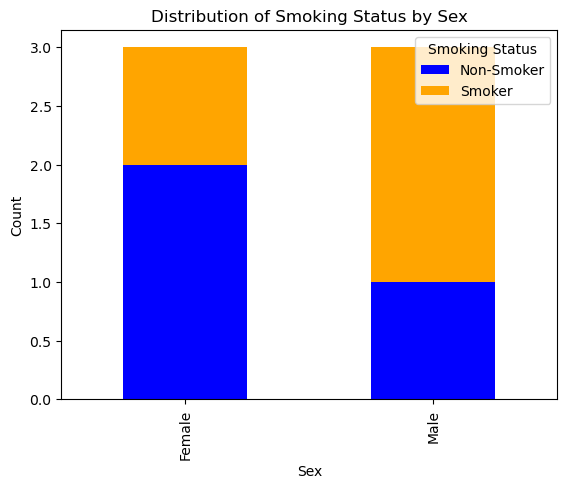

Smoking Status  Non-Smoker  Smoker
Sex                               
Female                   2       1
Male                     1       2


In [136]:
# Create a DataFrame (replace this with your actual data)
health_data = pd.DataFrame({
    'Sex': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female'],
    'Smoking Status': ['Smoker', 'Non-Smoker', 'Non-Smoker', 'Smoker', 'Smoker', 'Non-Smoker']
})

# Set the figure size before creating the plot
plt.figure(figsize=(8, 6))

# Create stacked bar plot
grouped_data = health_data.groupby(['Sex', 'Smoking Status']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', stacked=True, color=['blue', 'orange'])

# Add labels and title
plt.title('Distribution of Smoking Status by Sex')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.legend(title='Smoking Status')

# Show the plot
plt.show()

# Create a contingency matrix
contingency_matrix = pd.crosstab(health_data['Sex'], health_data['Smoking Status'])

print(contingency_matrix)

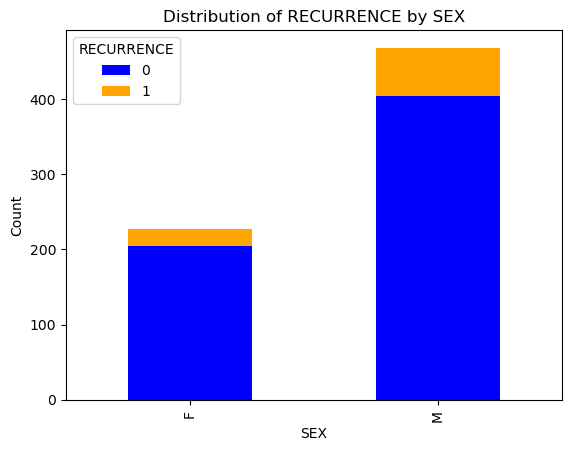

RECURRENCE  0  1
AGE             
12          1  0
17          1  0
18          1  0
19          1  0
20          1  0
..         .. ..
80          3  0
81          1  0
84          1  0
85          1  0
89          1  0

[67 rows x 2 columns]


In [137]:
grouped_data = data.groupby(['SEX', 'RECURRENCE']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', stacked=True, color=['blue', 'orange'])

# Add labels and title
plt.title('Distribution of RECURRENCE by SEX')
plt.xlabel('SEX')
plt.ylabel('Count')
plt.legend(title='RECURRENCE')

# Show the plot
plt.show()

# Create a contingency matrix
contingency_matrix = pd.crosstab(data['AGE'], data['RECURRENCE'])

print(contingency_matrix)

In [138]:
toy_data = {
    'Feature_A': np.random.choice(['Category_X', 'Category_Y'], size=100),
    'Feature_B': np.random.choice(['Category_A', 'Category_B', 'Category_C'], size=100),
    'Target': np.random.choice([0, 1], size=100)
}
df = pd.DataFrame(toy_data)
df.head()

,Feature_A,Feature_B,Target
0,Category_X,Category_B,0
1,Category_X,Category_A,0
2,Category_X,Category_B,0
3,Category_X,Category_A,0
4,Category_Y,Category_A,1


In [139]:
# Create a contingency table
contingency_table = pd.crosstab(df['Feature_A'], df['Target'])

# Display the contingency table
print(contingency_table)

# Perform the chi-square test
chi2, p, _, _ = stats.chi2_contingency(contingency_table)

# Display the results
print(f"\nChi-Square Statistic: {chi2}")
print(f"P-value: {p}")

Target       0   1
Feature_A         
Category_X  29  26
Category_Y  18  27

Chi-Square Statistic: 1.1390500752202868
P-value: 0.28585314089938635


In [140]:
# Create a contingency table
contingency_table = pd.crosstab(df['Feature_B'], df['Target'])

# Display the contingency table
print(contingency_table)

# Perform the chi-square test
chi2, p, _, _ = stats.chi2_contingency(contingency_table)

# Display the results
print(f"\nChi-Square Statistic: {chi2}")
print(f"P-value: {p}")

Target       0   1
Feature_B         
Category_A  17  13
Category_B  16  18
Category_C  14  22

Chi-Square Statistic: 2.0762326073209976
P-value: 0.354121110727023


In [141]:
def data_chi_square_test(cat_col_1, cat_col_2 = 'RECURRENCE'):
    # Create a contingency table
    contingency_table = pd.crosstab(data[cat_col_1], data[cat_col_2])

    # Display the contingency table
    print(contingency_table)

    # Perform the chi-square test
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)

    # Display the results
    print(f"\nChi-Square Statistic: {chi2}")
    print(f"P-value: {p}")

In [142]:
for col in obj_cols:
    data_chi_square_test(col)
    print()

RECURRENCE    0   1
SEX                
F           204  23
M           404  64

Chi-Square Statistic: 1.443620739195524
P-value: 0.22955432366717518

RECURRENCE    0   1
SITE               
b/l           3   1
left        290  34
right       315  52

Chi-Square Statistic: 2.694745155398651
P-value: 0.25992228988500443

RECURRENCE    0   1
T                  
1a          166  10
1b          160  18
2             1   0
2a           80   8
2b           21   3
3a          137  36
3b           21   5
3c            3   3
4            19   4

Chi-Square Statistic: 29.664469532975705
P-value: 0.00024227069643930068

RECURRENCE        0   1
HISTOPATHOLOGY         
clear cell      604  87
papillary         4   0

Chi-Square Statistic: 1.1884035560479189e-06
P-value: 0.9991301949059519



In [143]:
# chi square suggests that T-STAGING and recurrence have some good relation
# clear cell lmao xd
# not much for sex and site

In [144]:
for col in num_cat_cols:
    data_chi_square_test(col)
    print()

RECURRENCE    0   1
DM                 
0           529  77
1            79  10

Chi-Square Statistic: 0.048349808536658864
P-value: 0.8259600186103393

RECURRENCE    0   1
HTN                
0           459  74
1           149  13

Chi-Square Statistic: 3.3778327338703624
P-value: 0.0660788933490444

RECURRENCE    0   1
CKD                
0           591  84
1            17   3

Chi-Square Statistic: 0.0
P-value: 1.0

RECURRENCE    0   1
INCIDENTAL         
0           401  67
1           207  20

Chi-Square Statistic: 3.743281578673961
P-value: 0.05302021946297545

RECURRENCE    0   1
PAIN               
0           370  60
1           238  27

Chi-Square Statistic: 1.7922188764039975
P-value: 0.18065604854582384

RECURRENCE    0   1
HEMATURIA          
0           474  57
1           134  30

Chi-Square Statistic: 5.864444250989486
P-value: 0.01544973580463219

RECURRENCE    0   1
MASS               
0           594  85
1            14   2

Chi-Square Statistic: 0.0
P-value: 1.0



In [145]:
# don't reject H0: DM, CKD, PAIN, MASS, LOW, FEVER, N
# reject H0, there is a real relation: HEMATURIA, M, IVC INV, APPROACH, GRADE
# borderline: HTN, INCIDENTAL

In [146]:
# CORRELATION

In [147]:
num_cont_cols

['AGE', 'MAX DIA', 'MONTHS']

In [148]:
# Create a DataFrame (replace this with your actual data)
toy_data = pd.DataFrame({'Variable1': [1, 2, 3, 4, 5], 'Variable2': [5, 4, 3, 2, 1]})

# Calculate correlation using Pandas
correlation_pandas = toy_data['Variable1'].corr(toy_data['Variable2'])

print(f'Correlation using Pandas: {correlation_pandas}')

Correlation using Pandas: -0.9999999999999999


In [149]:
# Calculate correlation for each pair of numerical variables
def correlation_func(dataFrame, method):
    correlation_results = {}
    col_pairs = []
    for col1 in num_cont_cols:
        for col2 in num_cont_cols:
            if col1 != col2:
                if sorted([col1, col2]) not in col_pairs:
                    col_pairs.append([col1, col2])
                    correlation = dataFrame[col1].corr(dataFrame[col2], method = method)
                    correlation_results[f'{col1} vs {col2}'] = correlation

    # Display the results
    for pair, correlation in correlation_results.items():
        print(f'{pair}: {correlation}')

for method in ['pearson', 'spearman', 'kendall']:
    print(f"method = {method}")
    correlation_func(data, method)
    print()

method = pearson
AGE vs MAX DIA: 0.014160112903617813
AGE vs MONTHS: -0.0654609128931886
MAX DIA vs MONTHS: 0.06889810517969931

method = spearman
AGE vs MAX DIA: 0.04397823155147264
AGE vs MONTHS: -0.0582124556106778
MAX DIA vs MONTHS: 0.08446675259396054

method = kendall
AGE vs MAX DIA: 0.029529305928602017
AGE vs MONTHS: -0.03925232619274304
MAX DIA vs MONTHS: 0.057920889152433784



In [150]:
# the numerical variables don't seem to be showing much correlation amongst themselves

In [151]:
itertools.product?

Init signature: itertools.product(self, /, *args, **kwargs)
Docstring:     
product(*iterables, repeat=1) --> product object

Cartesian product of input iterables.  Equivalent to nested for-loops.

For example, product(A, B) returns the same as:  ((x,y) for x in A for y in B).
The leftmost iterators are in the outermost for-loop, so the output tuples
cycle in a manner similar to an odometer (with the rightmost element changing
on every iteration).

To compute the product of an iterable with itself, specify the number
of repetitions with the optional repeat keyword argument. For example,
product(A, repeat=4) means the same as product(A, A, A, A).

product('ab', range(3)) --> ('a',0) ('a',1) ('a',2) ('b',0) ('b',1) ('b',2)
product((0,1), (0,1), (0,1)) --> (0,0,0) (0,0,1) (0,1,0) (0,1,1) (1,0,0) ...
Type:           type
Subclasses:     

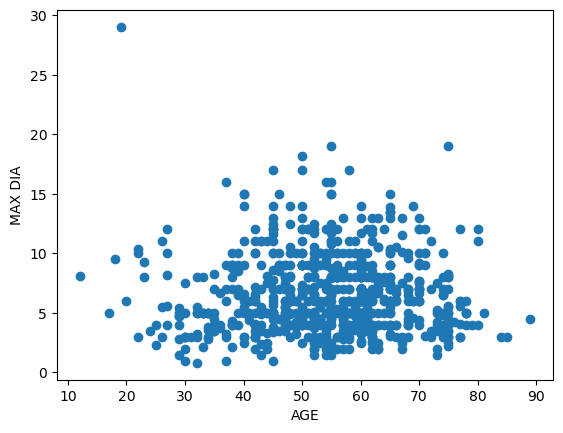

In [152]:
plt.scatter(data['AGE'], data['MAX DIA'])
plt.xlabel('AGE')
plt.ylabel('MAX DIA')
plt.show()

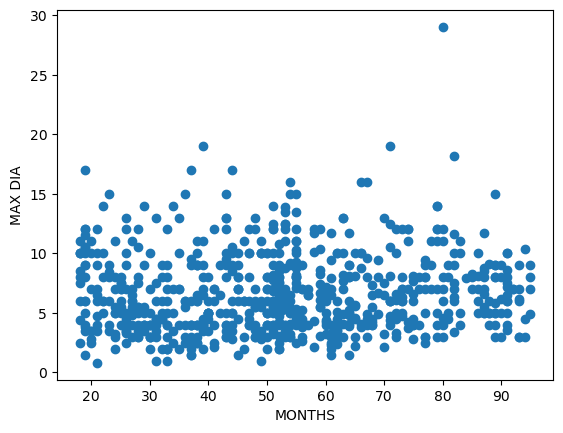

In [153]:
plt.scatter(data['MONTHS'], data['MAX DIA'])
plt.xlabel('MONTHS')
plt.ylabel('MAX DIA')
plt.show()

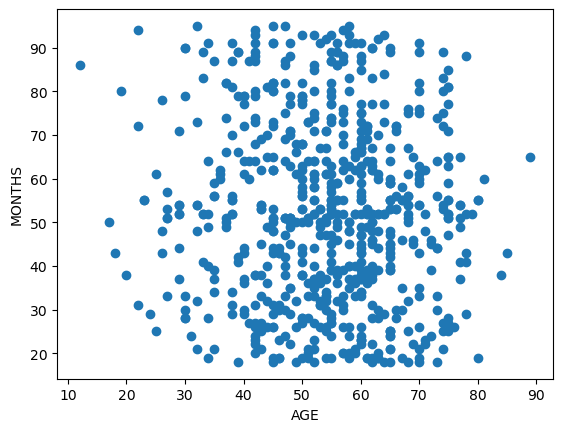

In [154]:
plt.scatter(data['AGE'], data['MONTHS'])
plt.xlabel('AGE')
plt.ylabel('MONTHS')
plt.show()

In [155]:
# even visually, there is little correlation among the variables.

In [156]:
def pearson_func(var1, var2):
    # Using scipy.stats.pearsonr
    r, p_value = stats.pearsonr(data[var1], data[var2])

    # Print the results
    print(f'Correlation Coefficient for {var1} and {var2}: {r}')
    print(f'P-Value: {p_value}')
    print()

pearson_func('AGE', 'MAX DIA')
pearson_func('AGE', 'MONTHS')
pearson_func('MAX DIA', 'MONTHS')

Correlation Coefficient for AGE and MAX DIA: 0.014160112903617737
P-Value: 0.709410672125959

Correlation Coefficient for AGE and MONTHS: -0.06546091289318853
P-Value: 0.08462123916922115

Correlation Coefficient for MAX DIA and MONTHS: 0.06889810517969906
P-Value: 0.06948726069377295



In [157]:
# looks like there is on real correlation between AGE and MAX DIA
# any pair of the 3 for that matter, not enough statistical significance

In [158]:
# trying num/cat and cat/cat variables

C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


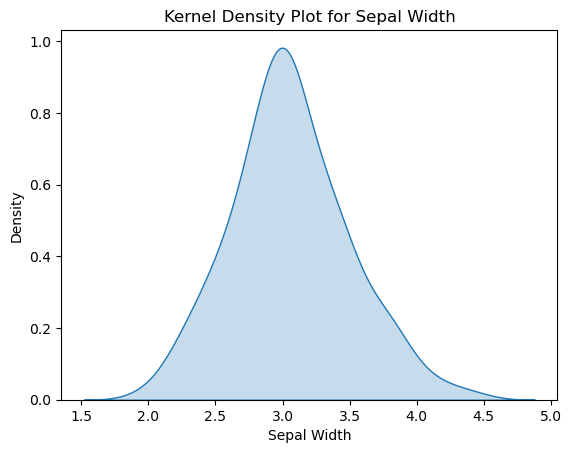

In [159]:
# Generate example data
iris_data = sns.load_dataset("iris")

# Create a kernel density plot for the 'sepal_width' column
sns.kdeplot(data=iris_data['sepal_width'], fill=True)

# Display the plot
plt.title('Kernel Density Plot for Sepal Width')
plt.xlabel('Sepal Width')
plt.ylabel('Density')
plt.show()

In [160]:
iris_data.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


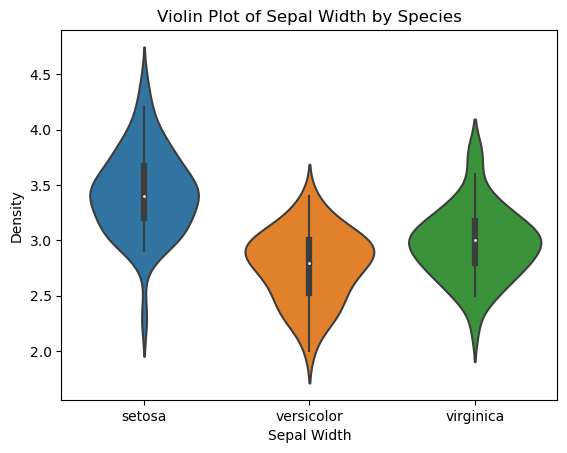

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt

# Generate example data
iris_data = sns.load_dataset("iris")

# Create a violin plot for the 'species' categories and 'sepal_width' variable
sns.violinplot(x='species', y='sepal_width', data=iris_data)

# Display the plot
plt.title('Violin Plot of Sepal Width by Species')
plt.xlabel('Sepal Width')
plt.ylabel('Density')
plt.show()

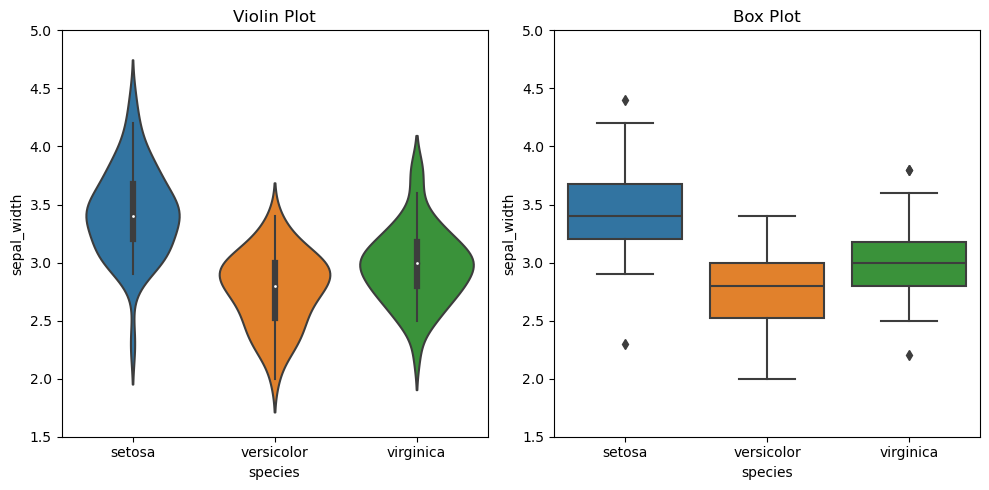

In [162]:
# Load example data
iris_data = sns.load_dataset("iris")

# Set up the figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Violin plot
sns.violinplot(x='species', y='sepal_width', data=iris_data, ax=axes[0])
axes[0].set_title('Violin Plot')
axes[0].set_ylim(1.5, 5)
# xlim_violin, ylim_violin = axes[0].get_xlim(), axes[0].get_ylim()
# print(f'Violin Plot - X-axis limits: {xlim_violin}, Y-axis limits: {ylim_violin}')

# Box plot
sns.boxplot(x='species', y='sepal_width', data=iris_data, ax=axes[1])
axes[1].set_title('Box Plot')
axes[1].set_ylim(1.5, 5)
# xlim_box, ylim_box = axes[1].get_xlim(), axes[1].get_ylim()
# print(f'Box Plot - X-axis limits: {xlim_box}, Y-axis limits: {ylim_box}')

# Adjust layout
plt.tight_layout()
plt.show()

In [163]:
obj_cols

['SEX', 'SITE', 'T', 'HISTOPATHOLOGY']

In [164]:
for col in obj_cols:
    print(sorted(data[col].unique()))

['F', 'M']
['b/l', 'left', 'right']
['1a', '1b', '2', '2a', '2b', '3a', '3b', '3c', '4']
['clear cell', 'papillary']


In [165]:
def box_violin_plotter(num, cat):
    # Set up the figure with two subplots
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # Violin plot
    sns.violinplot(x=cat, y=num, data=data, ax=axes[0], order = sorted(data[col].unique()))
    axes[0].set_title(f'Violin Plot of {num} by {cat}')
    # axes[0].set_ylim(1.5, 5)
    # xlim_violin, ylim_violin = axes[0].get_xlim(), axes[0].get_ylim()
    # print(f'Violin Plot - X-axis limits: {xlim_violin}, Y-axis limits: {ylim_violin}')

    # Box plot
    sns.boxplot(x=cat, y=num, data=data, ax=axes[1], order = sorted(data[col].unique()))
    axes[1].set_title(f'Box Plot of {num} by {cat}')
    
    bottom_value, top_value = axes[0].get_ylim()  # Get ylim from the first subplot
    axes[1].set_ylim(bottom_value, top_value)  # Set ylim for the second subplot

    # xlim_box, ylim_box = axes[1].get_xlim(), axes[1].get_ylim()
    # print(f'Box Plot - X-axis limits: {xlim_box}, Y-axis limits: {ylim_box}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

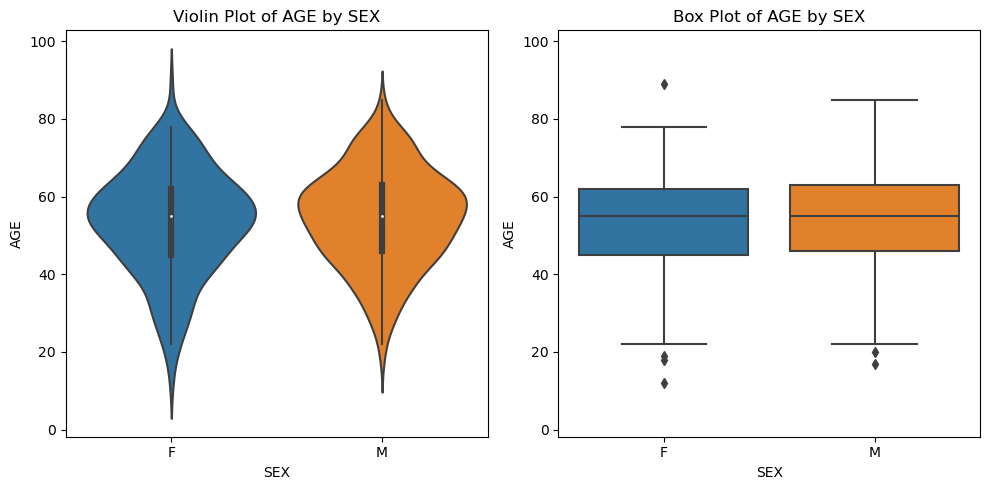

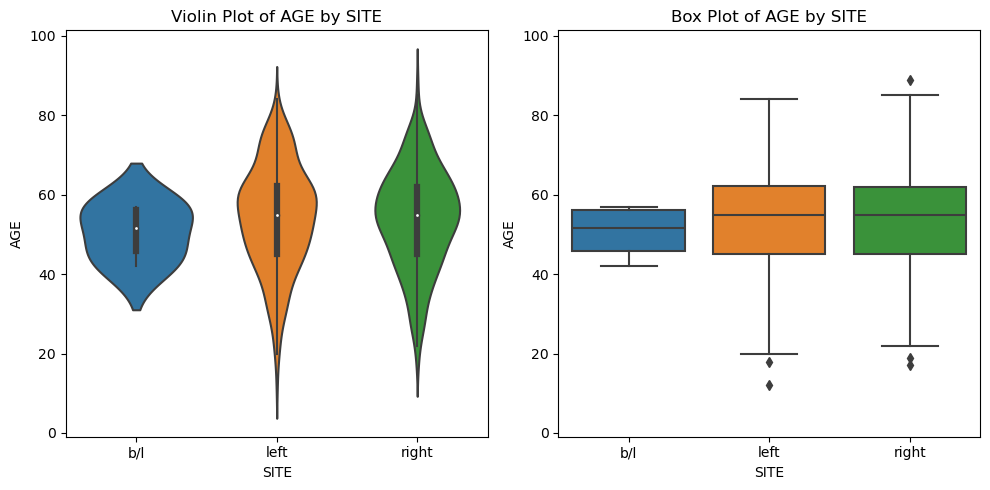

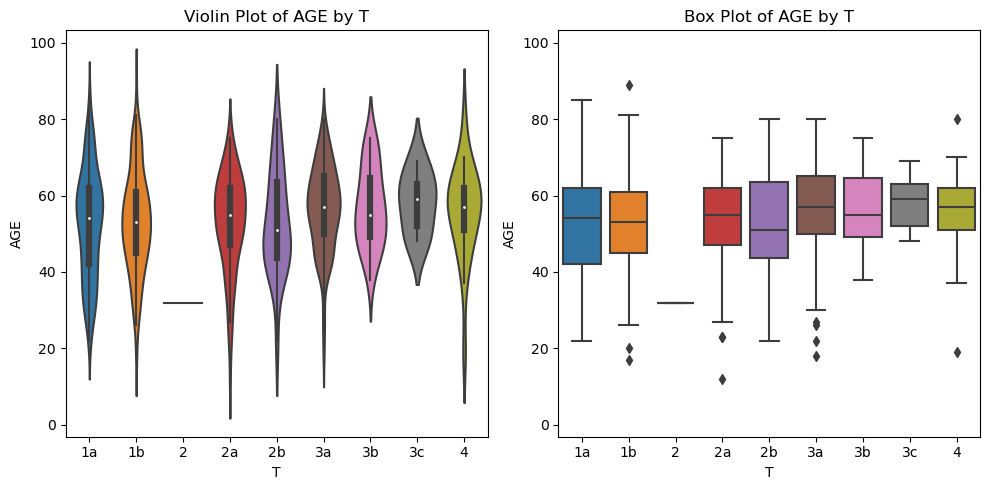

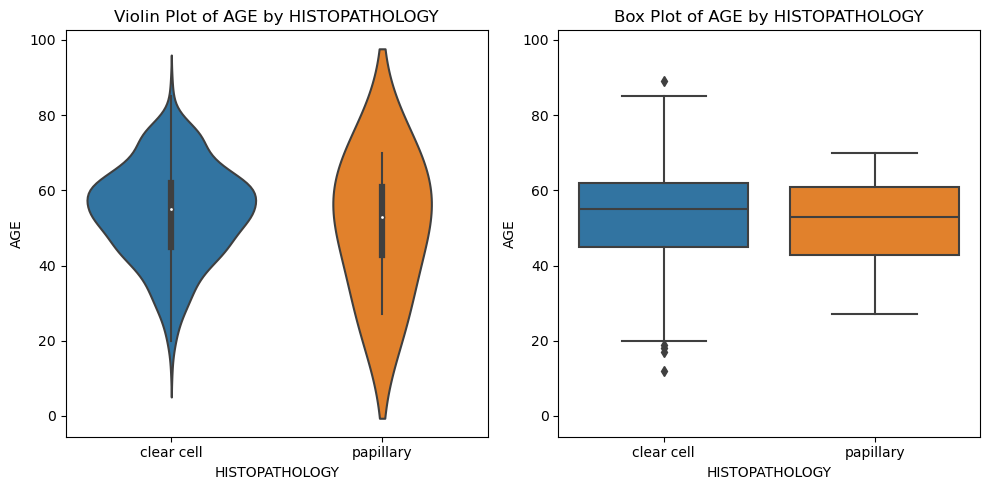

In [166]:
for col in obj_cols:
    box_violin_plotter('AGE', col)

In [167]:
# roughly even distribution in AGE and SEX
# same for AGE and left/right SITE; b/l is much rarer (4 out of 693) and hence has a truncated distribution
# reserve judgement for T later
# papillary is an outlier, but has a decent age distribution ig?

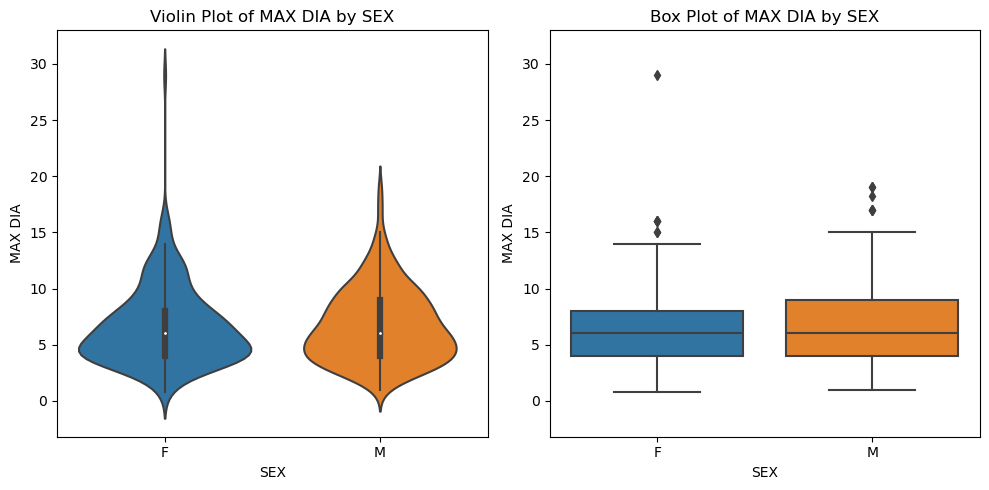

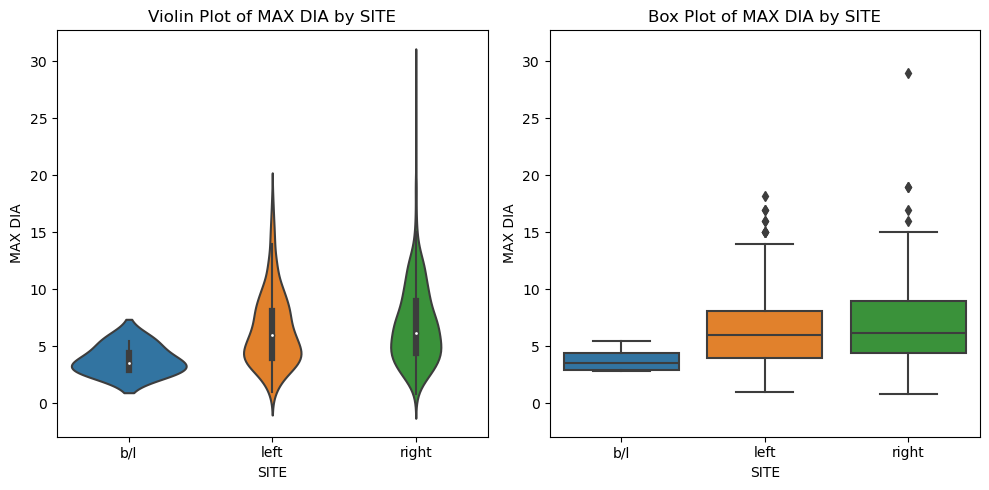

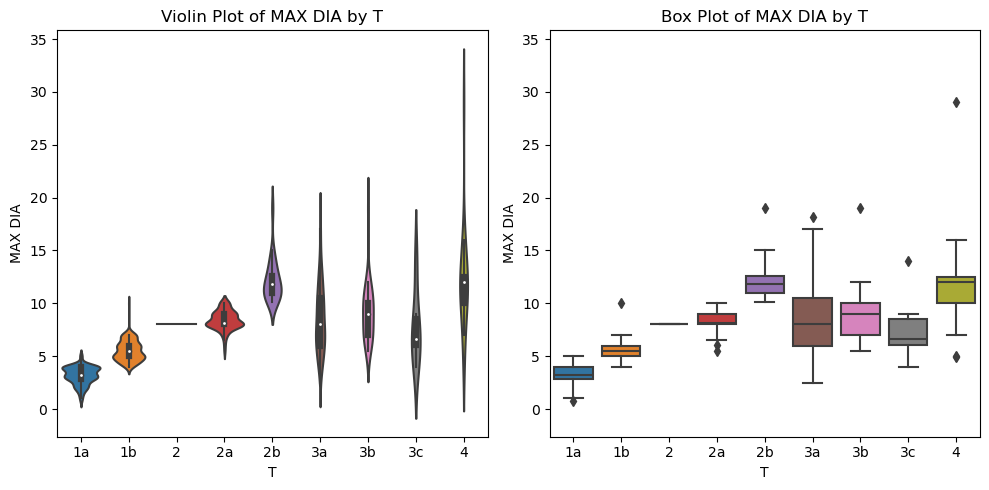

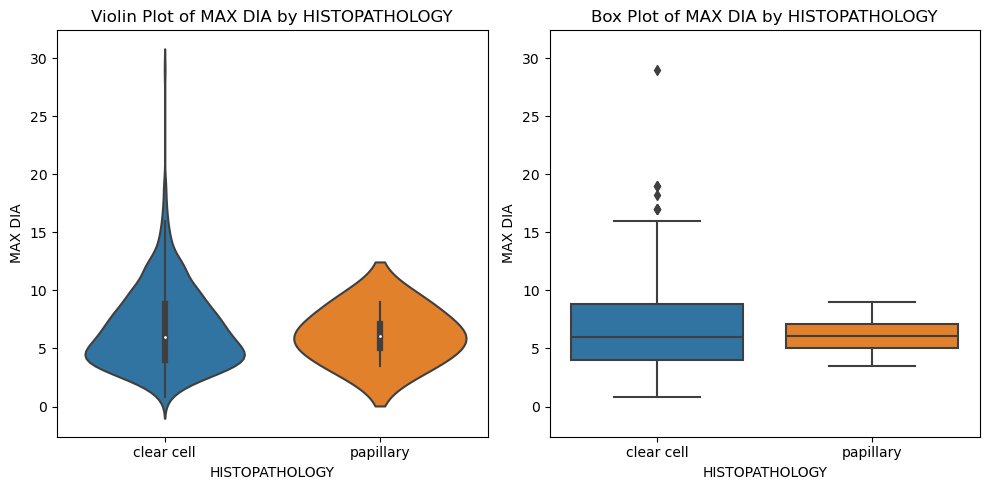

In [168]:
for col in obj_cols:
    box_violin_plotter('MAX DIA', col)

In [169]:
# one annoying mfker: that ~30 (i think mm) MAX DIA one
# roughly even distribution between MAX DIA and SEX (excluding THE outlier)
# same for left and right; b/l is an outlier in itself
# 
# clear cell too hogs all the points, including the outlier

In [170]:
data.loc[data['SEX'] == 'M', 'MONTHS']

0      95
2      95
3      95
4      94
5      94
       ..
689    18
690    18
691    18
692    18
694    18
Name: MONTHS, Length: 468, dtype: int64

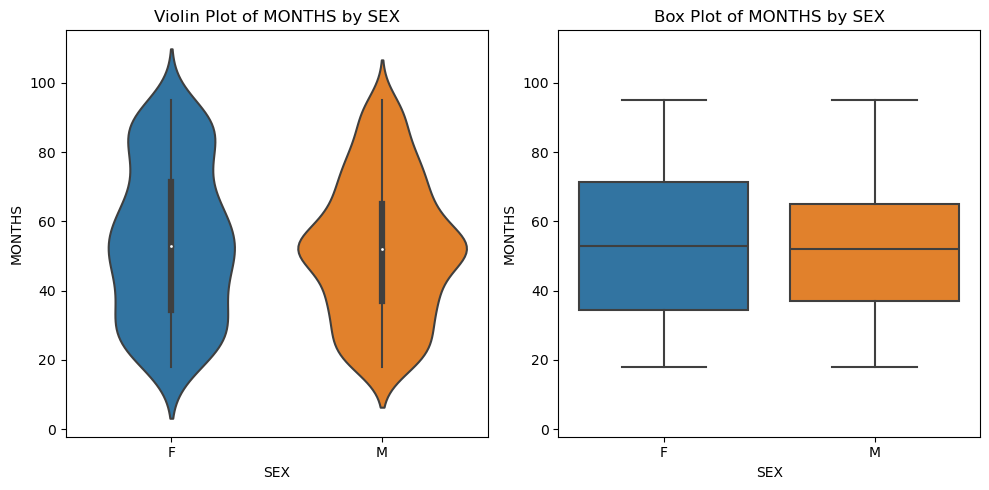

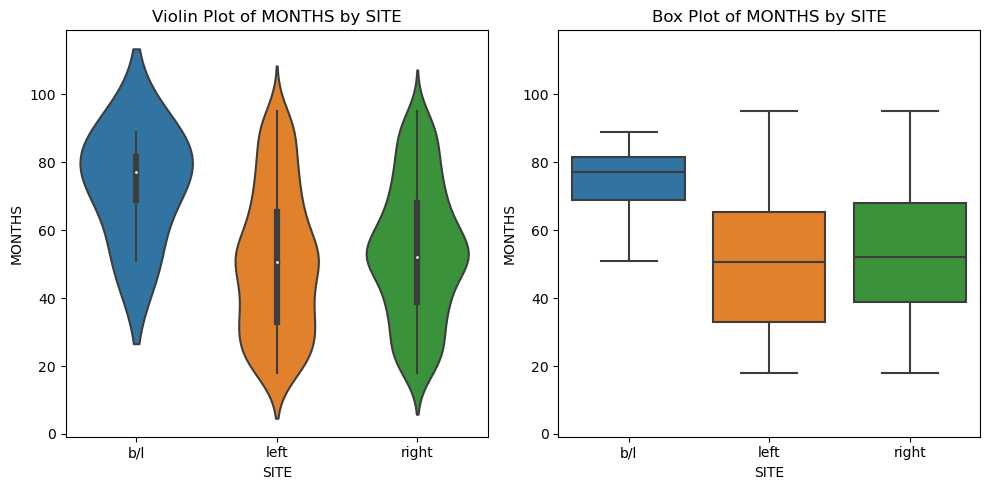

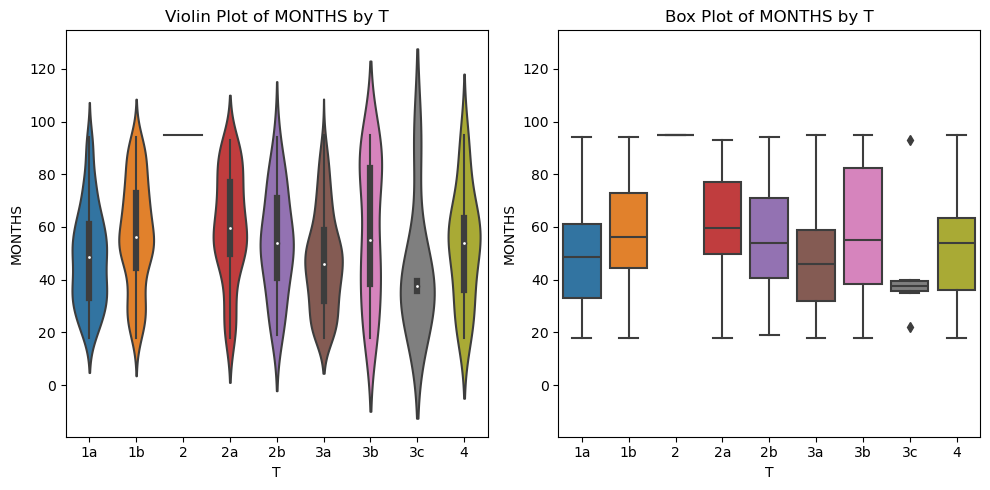

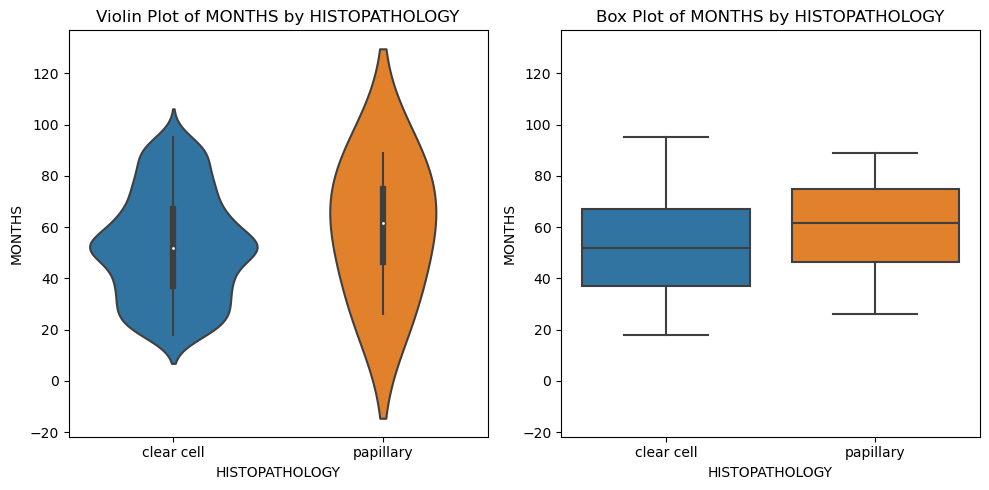

In [171]:
for col in obj_cols:
    box_violin_plotter('MONTHS', col)

In [172]:
data['MONTHS'].value_counts()

MONTHS
52    30
55    22
51    20
19    17
53    17
      ..
78     3
76     3
94     3
92     2
84     1
Name: count, Length: 78, dtype: int64

In [173]:
# of the top 5 in MONTHS value_counts, 4 are in the 50-55 range, hence the noticeable peak in the kdes of some violins
# roughly even for SEX and MONTHS

C:\Users\aniru\anaconda3\lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


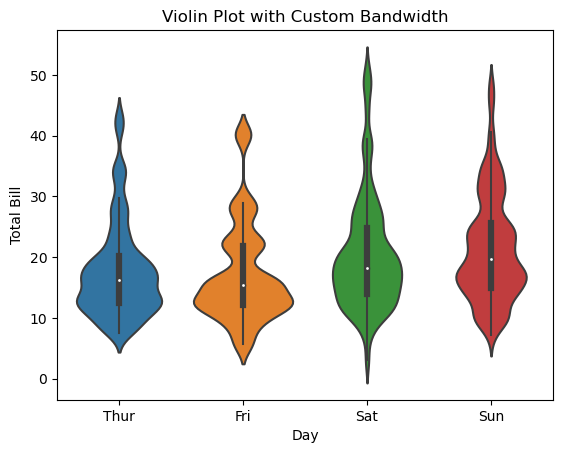

In [174]:
# Example data
toy_data = sns.load_dataset("tips")

# Create a violin plot with a specific bandwidth
sns.violinplot(x="day", y="total_bill", data=toy_data, bw=0.2)

# Add labels and title
plt.xlabel("Day")
plt.ylabel("Total Bill")
plt.title("Violin Plot with Custom Bandwidth")

# Show the plot
plt.show()

In [175]:
import scipy.stats as stats
import pandas as pd

# Create a sample dataset
np.random.seed(42)  # For reproducibility

# Generate random numerical data for two categories
category_a_data = np.random.normal(loc=10, scale=2, size=50)
category_b_data = np.random.normal(loc=12, scale=2, size=50)

# Combine data into a DataFrame
toy_data = pd.DataFrame({
    'Category': ['A'] * 50 + ['B'] * 50,
    'NumericData': np.concatenate([category_a_data, category_b_data])
})

# Separate data into two groups based on the categories
group_a = toy_data[toy_data['Category'] == 'A']['NumericData']
group_b = toy_data[toy_data['Category'] == 'B']['NumericData']

# Perform t-test
t_statistic, p_value = stats.ttest_ind(group_a, group_b)

# Print results
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("The difference in means is statistically significant.")
else:
    print("There is not enough evidence to reject the null hypothesis.")

T-statistic: -6.872731683285841
P-value: 5.877565294167719e-10
The difference in means is statistically significant.


In [240]:
def t_test(num, cat):
    print(f't-test with {num} and {cat}')
    # Separate data into two groups based on the categories
    a, b = data[cat].unique()
    group_a = data[data[cat] == a][num]
    group_b = data[data[cat] == b][num]

    # Perform t-test
    t_statistic, p_value = stats.ttest_ind(group_a, group_b)

    # Print results
    print("T-statistic:", t_statistic)
    print("P-value:", p_value)

    # Interpret the results
    alpha = 0.05  # Set your significance level
    if p_value < alpha:
        print("The difference in means is statistically significant.")
        return 1
    else:
        print("There is not enough evidence to reject the null hypothesis.")
        return 0

In [177]:
for num in num_cont_cols:
    for obj in obj_cols:
        if (data[obj].nunique() == 2):
            t_test(num, obj)
            print()
    print('-----------------------------------------------------------')

t-test with AGE and SEX
T-statistic: 1.1089584356657467
P-value: 0.2678328064520461
There is not enough evidence to reject the null hypothesis.

t-test with AGE and HISTOPATHOLOGY
T-statistic: 0.5199288533163513
P-value: 0.6032792018155052
There is not enough evidence to reject the null hypothesis.

-----------------------------------------------------------
t-test with MAX DIA and SEX
T-statistic: 0.327756103827544
P-value: 0.7431950714146998
There is not enough evidence to reject the null hypothesis.

t-test with MAX DIA and HISTOPATHOLOGY
T-statistic: 0.30955271173096244
P-value: 0.7569941743428403
There is not enough evidence to reject the null hypothesis.

-----------------------------------------------------------
t-test with MONTHS and SEX
T-statistic: -1.2145451795855993
P-value: 0.22495329342484036
There is not enough evidence to reject the null hypothesis.

t-test with MONTHS and HISTOPATHOLOGY
T-statistic: -0.6654341705322224
P-value: 0.5059942421189751
There is not enough e

In [178]:
cont_cat_sig = {}
for num in num_cont_cols:
    cont_cat_sig[num] = []
    for cat in num_cat_cols:
        if (data[cat].nunique() == 2 and data[cat].isna().sum() == 0):
            t = t_test(num, cat)
            print()
            if t == 1:
                cont_cat_sig[num].append(cat)
    print('-----------------------------------------------------------')

print(cont_cat_sig)

t-test with AGE and DM
T-statistic: -7.320085512467436
P-value: 6.887735724665636e-13
The difference in means is statistically significant.

t-test with AGE and HTN
T-statistic: -10.810031284124785
P-value: 2.810484785107514e-25
The difference in means is statistically significant.

t-test with AGE and CKD
T-statistic: -0.9051317203042956
P-value: 0.3657101723584689
There is not enough evidence to reject the null hypothesis.

t-test with AGE and INCIDENTAL
T-statistic: -2.5304579492749264
P-value: 0.011611646070903422
The difference in means is statistically significant.

t-test with AGE and PAIN
T-statistic: -4.7263803090159655
P-value: 2.768923875535605e-06
The difference in means is statistically significant.

t-test with AGE and HEMATURIA
T-statistic: -1.5514090267497231
P-value: 0.12126023234613198
There is not enough evidence to reject the null hypothesis.

t-test with AGE and MASS
T-statistic: 1.7009841651783022
P-value: 0.08939456615105662
There is not enough evidence to reject

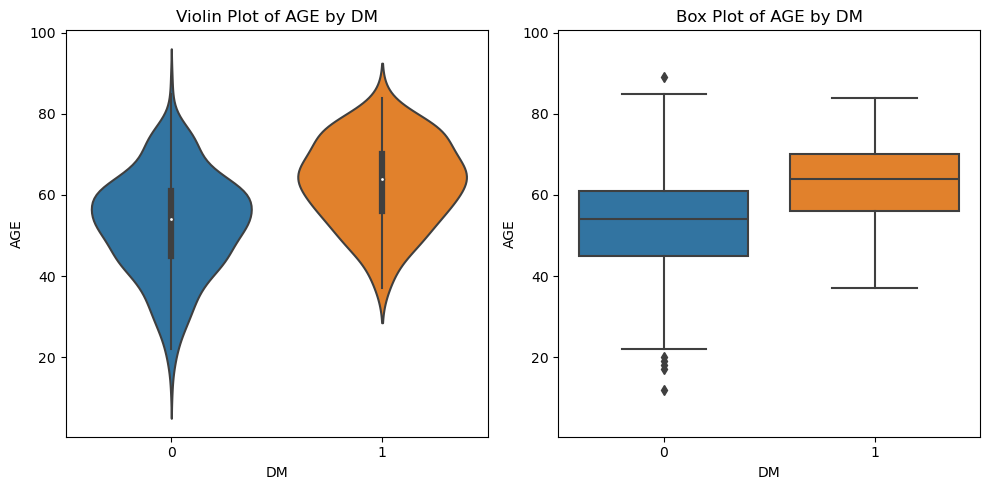

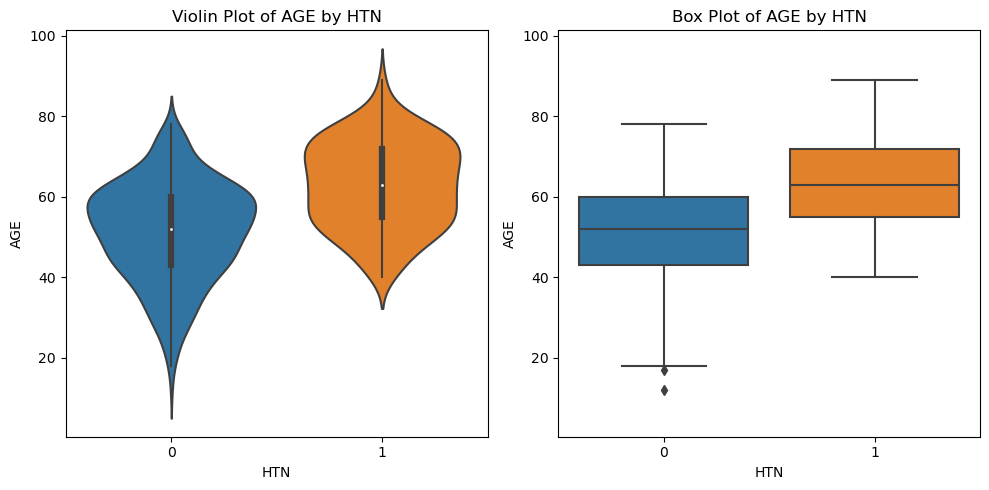

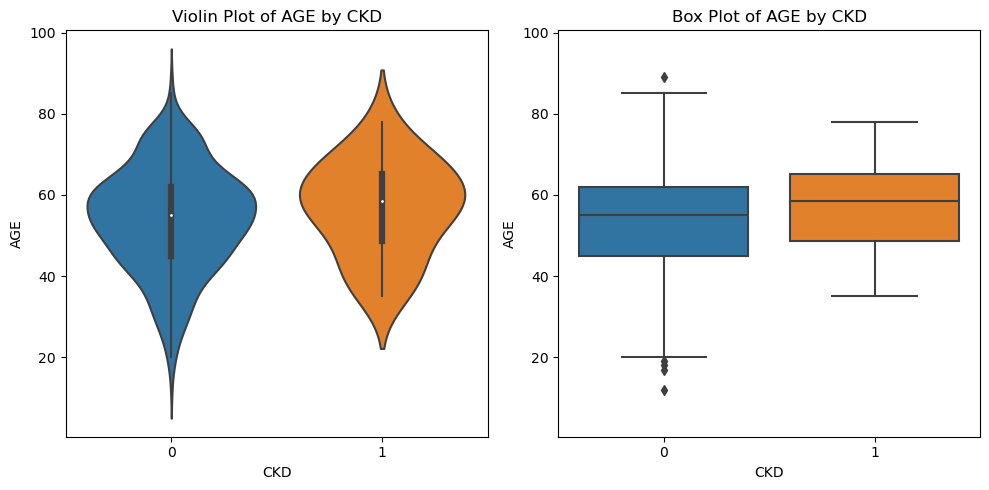

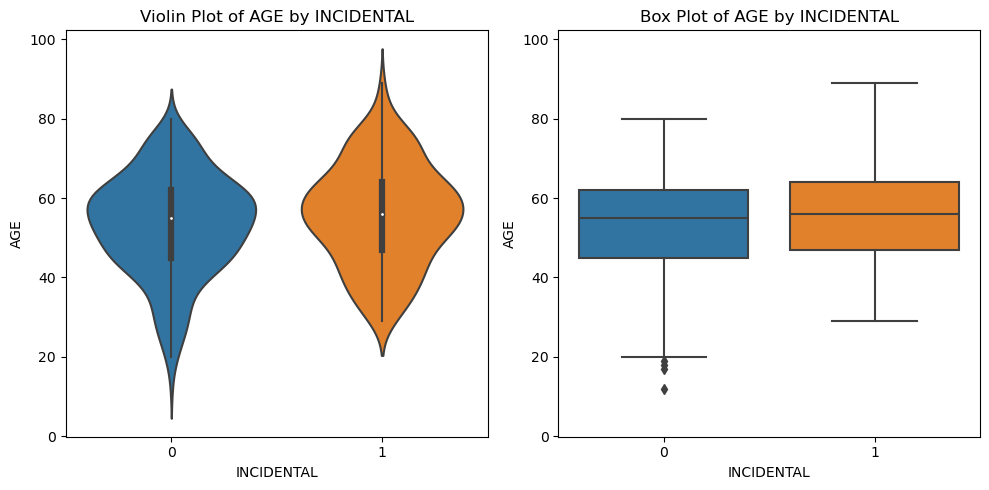

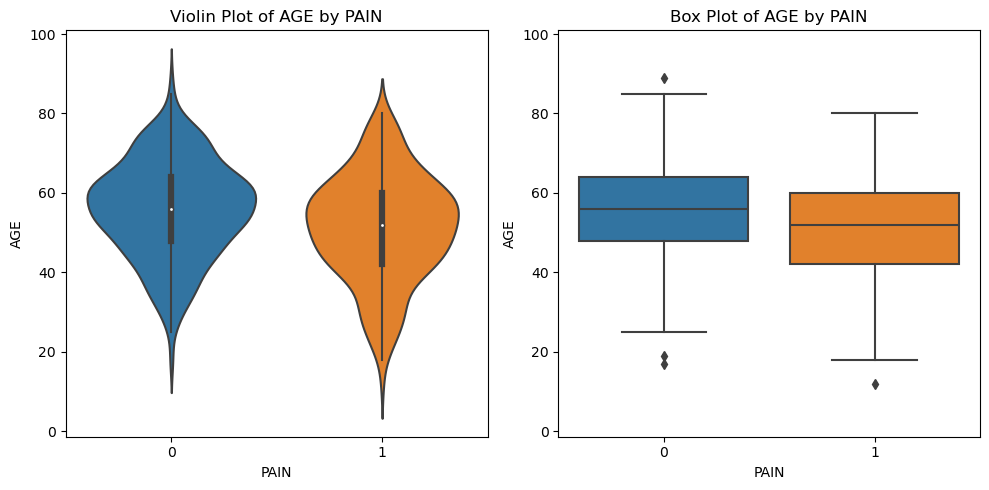

...

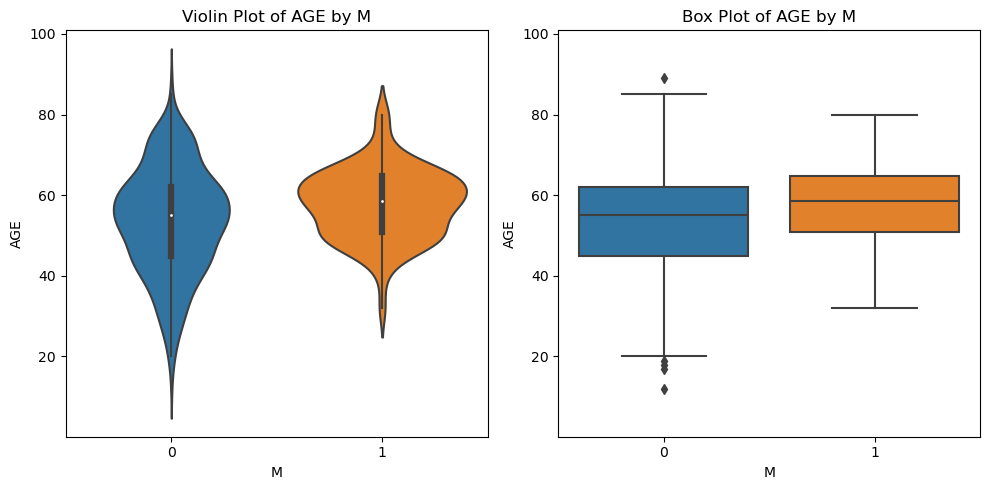

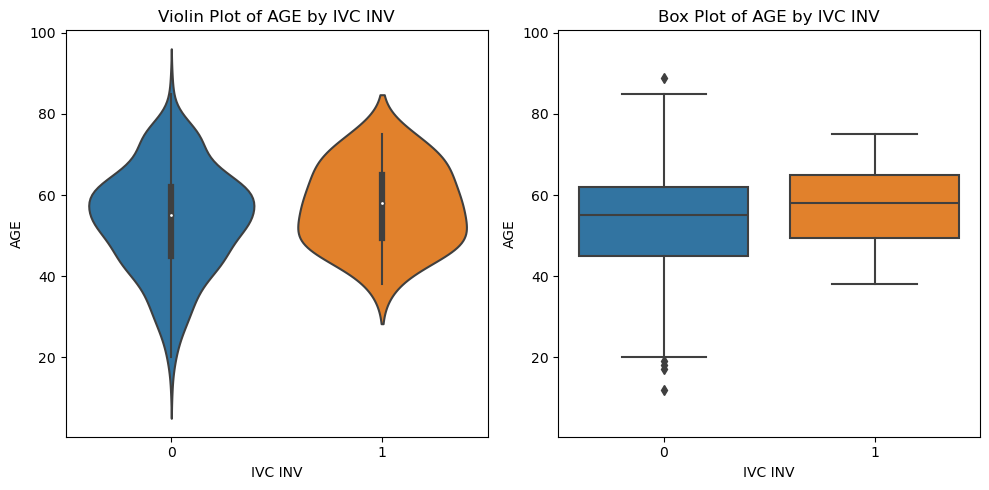

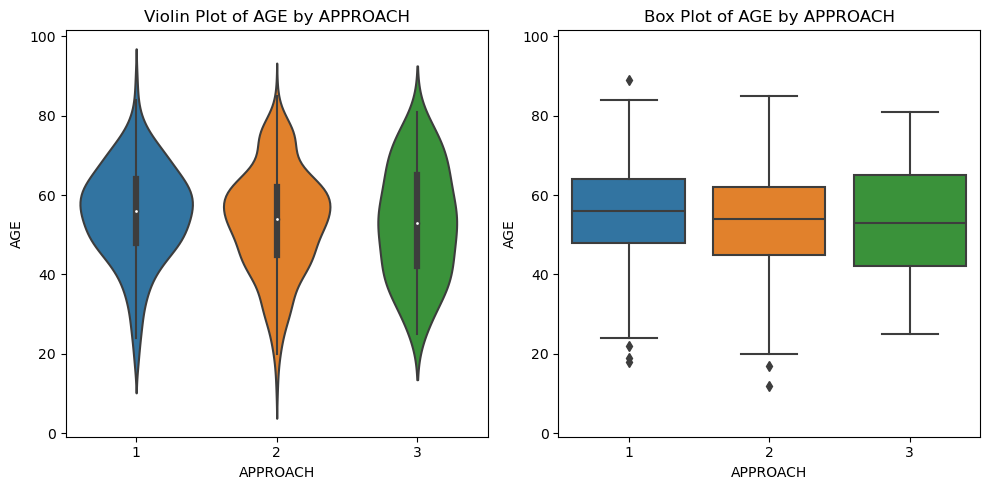

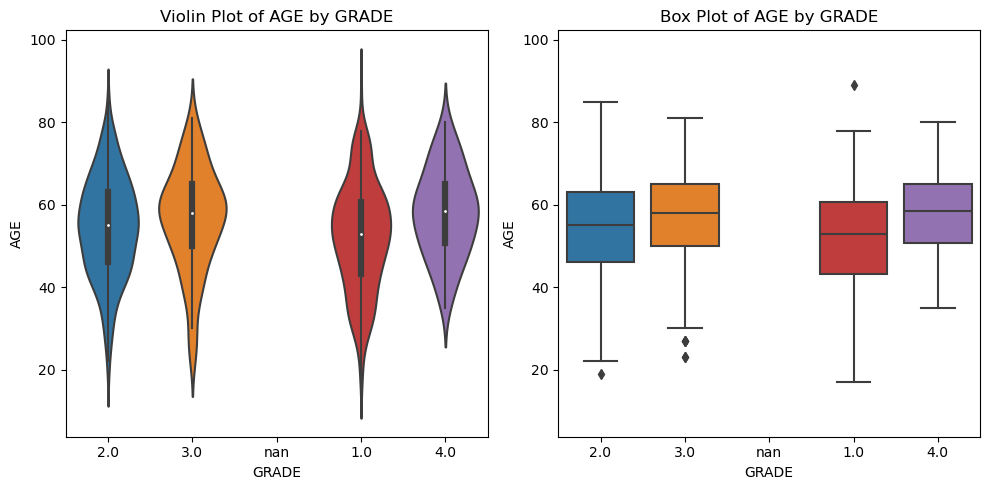

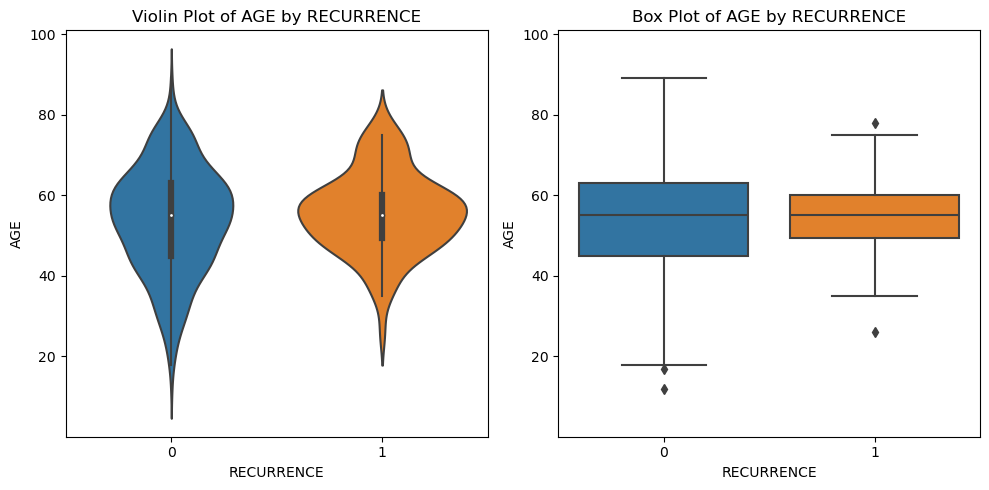

In [179]:
for col in num_cat_cols:
    box_violin_plotter('AGE', col)

In [180]:
temp1 = []
for col1 in obj_cols:
    for col2 in obj_cols:
        if col1 != col2:
            if sorted([col1, col2]) not in temp1:
                temp1.append([col1, col2])
                data_chi_square_test(col1, col2)
                print('-------------------------------------------------')

SITE  b/l  left  right
SEX                   
F       1   102    124
M       3   222    243

Chi-Square Statistic: 0.5234309151890577
P-value: 0.7697300133797447
-------------------------------------------------
T     1a   1b  2  2a  2b   3a  3b  3c   4
SEX                                      
F     54   66  0  31   6   52   5   2  11
M    122  112  1  57  18  121  21   4  12

Chi-Square Statistic: 8.35337772392193
P-value: 0.39973412472505176
-------------------------------------------------
HISTOPATHOLOGY  clear cell  papillary
SEX                                  
F                      225          2
M                      466          2

Chi-Square Statistic: 0.04281733416042452
P-value: 0.8360696046429997
-------------------------------------------------
T      1a  1b  2  2a  2b  3a  3b  3c   4
SITE                                    
b/l     3   1  0   0   0   0   0   0   0
left   88  83  1  42   8  89   2   1  10
right  85  94  0  46  16  84  24   5  13

Chi-Square Statistic: 

In [181]:
for col1 in num_cat_cols:
    for col2 in obj_cols:
        data_chi_square_test(col1, col2)
        print()
    print('-------------------------------------------------')

SEX    F    M
DM           
0    197  409
1     30   59

Chi-Square Statistic: 0.010880381340125256
P-value: 0.9169240831914441

SITE  b/l  left  right
DM                    
0       3   288    315
1       1    36     52

Chi-Square Statistic: 1.976781731612832
P-value: 0.3721750891033951

T    1a   1b  2  2a  2b   3a  3b  3c   4
DM                                      
0   155  154  1  74  23  154  20   4  21
1    21   24  0  14   1   19   6   2   2

Chi-Square Statistic: 8.287337171162996
P-value: 0.4059174325877162

HISTOPATHOLOGY  clear cell  papillary
DM                                   
0                      602          4
1                       89          0

Chi-Square Statistic: 0.00033683870305760785
P-value: 0.985357114241674

-------------------------------------------------
SEX    F    M
HTN          
0    178  355
1     49  113

Chi-Square Statistic: 0.4261054890040204
P-value: 0.5139061393125774

SITE  b/l  left  right
HTN                   
0       3   252    278
1  

In [182]:
# T has some really nice figures

In [183]:
# KEEP MUTUAL INFORMATION FOR LATER!

C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\aniru\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


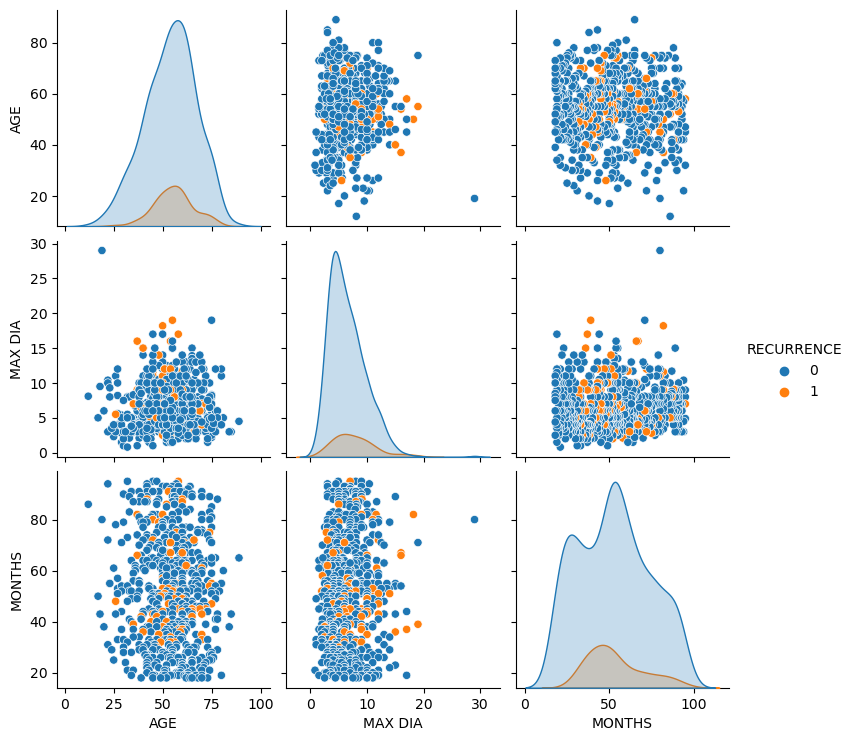

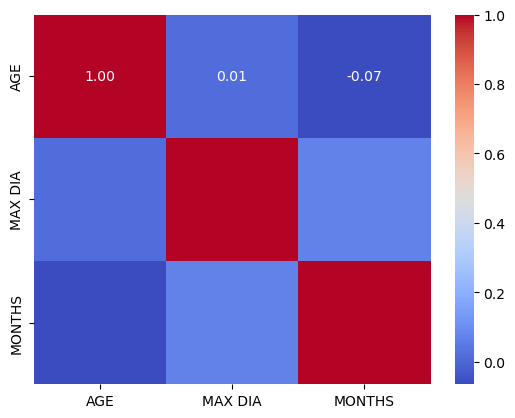

In [184]:
sns.pairplot(data[num_cont_cols + ['RECURRENCE']], hue = 'RECURRENCE')
plt.show()

correlation_matrix = data[num_cont_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [185]:
# Generate a toy dataset
X, y = make_classification(n_samples=300, n_features=10, n_classes=2, random_state=42)

# Create a DataFrame
df = pd.DataFrame(X, columns=[f'feature_{i}' for i in range(1, 11)])
df['target_variable'] = y

# Display the first few rows of the DataFrame
display(df.head())

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,target_variable
0,-0.025435,1.452468,-1.203192,1.248099,-0.508140,0.923225,0.300474,-0.453248,-0.147780,0.326745,1
1,0.749972,0.097983,0.663984,-0.679773,0.253740,-0.338745,-0.391649,1.085786,0.467693,0.308051,0
2,-1.235592,-0.839210,-0.903206,0.922051,0.538296,0.410811,-1.966357,-0.364953,1.072507,-1.044809,1
3,-1.614818,-0.755745,-0.721757,0.729149,-0.668090,0.182711,-0.898468,-0.174960,0.992042,0.536510,1
4,-0.723893,0.632932,0.952203,-0.996834,-0.832356,-0.903253,-1.515744,-0.552223,0.471416,0.202923,0


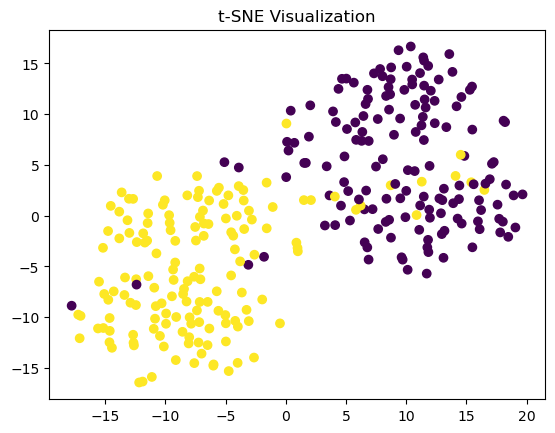

In [186]:
# Perform t-SNE on the feature matrix X
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X)

# Scatter plot the t-SNE visualization
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=df['target_variable'], cmap='viridis')
plt.title('t-SNE Visualization')
plt.show()

In [187]:
# Create a toy DataFrame with categorical variables
toy_data = {
    'Categorical_Variable1': np.random.choice(['A', 'B', 'C'], size=100),
    'Categorical_Variable2': np.random.choice(['X', 'Y', 'Z'], size=100),
}

df = pd.DataFrame(toy_data)

# Display the first few rows of the DataFrame
display(df.head())

,Categorical_Variable1,Categorical_Variable2
0,A,Y
1,B,X
2,A,Z
3,A,X
4,C,X


In [188]:
def mosaic_heatmap(cat1, cat2):
    fig, axes = plt.subplots(figsize=(10, 8))
    # Mosaic Plot
    props = {'color': 'gray', 'edgecolor': 'white'}
    mosaic(data, [cat1, cat2], title='Mosaic Plot', properties=props, ax=axes)
    plt.show()

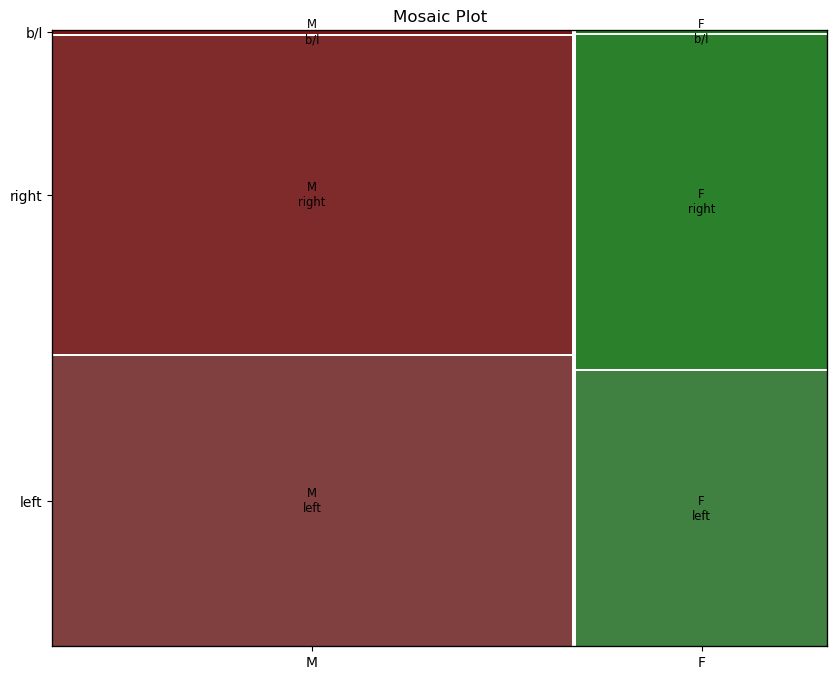

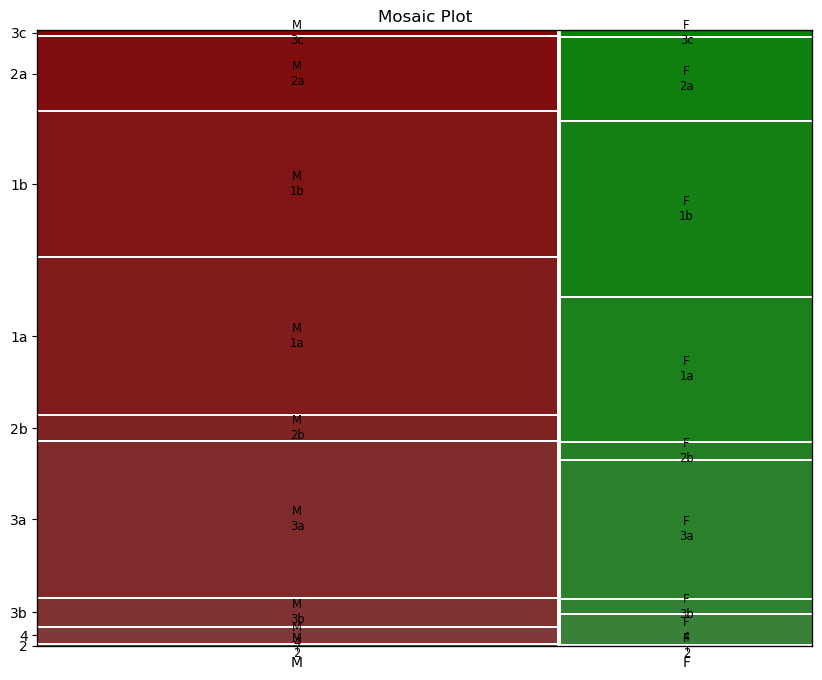

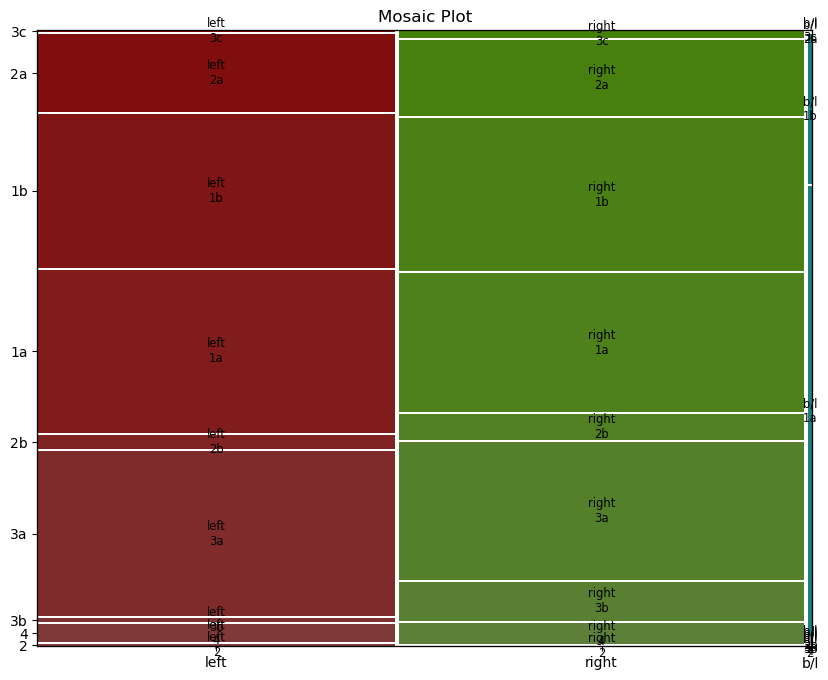

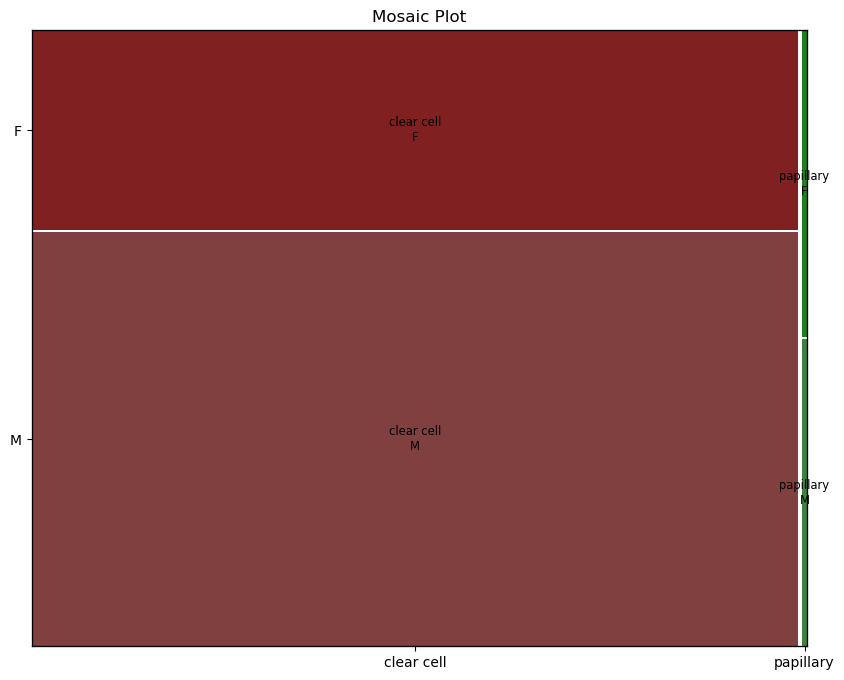

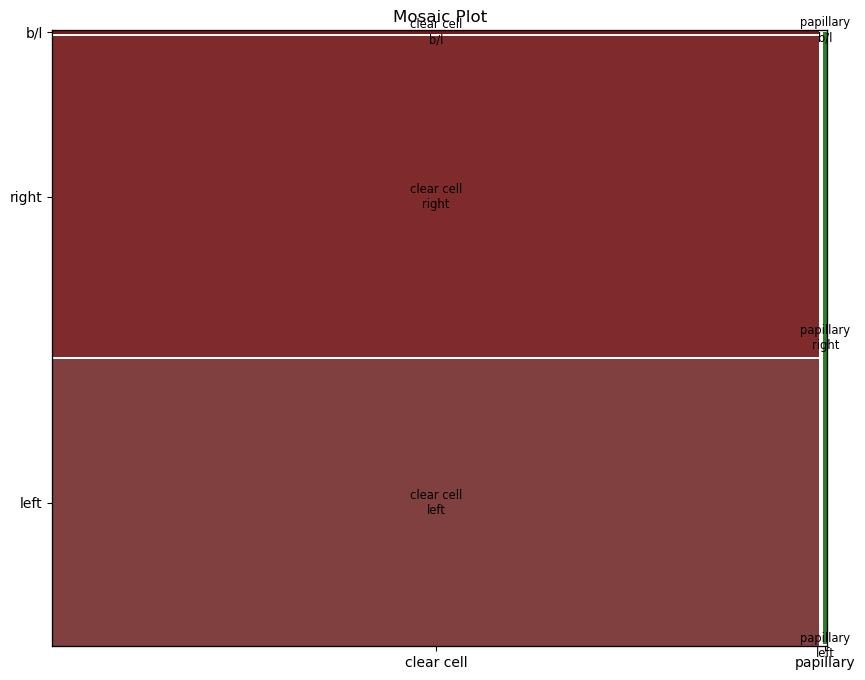

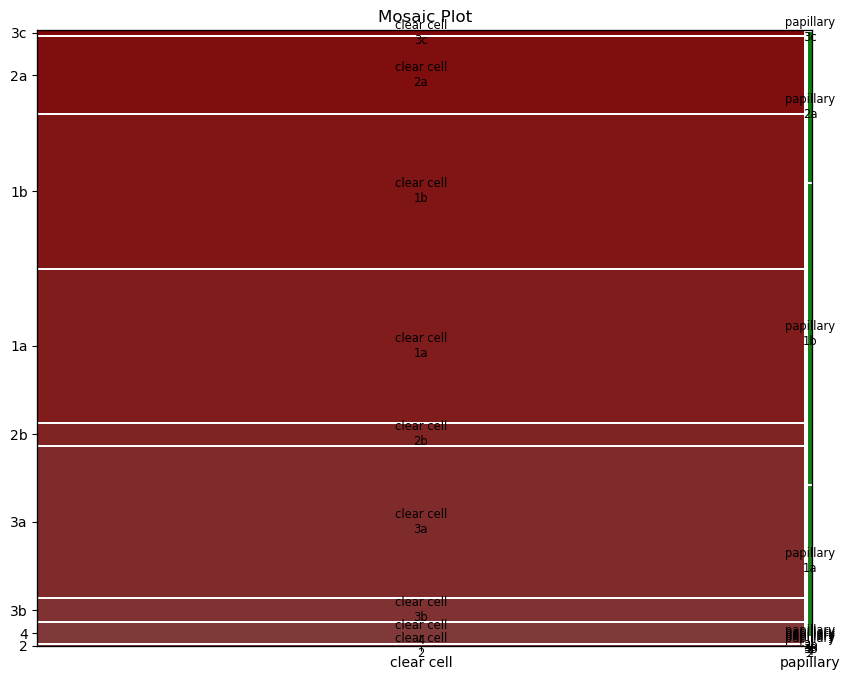

In [189]:
for col1 in obj_cols:
    for col2 in obj_cols:
        if col1 != col2:
            if [col1, col2] == sorted([col1, col2]):
                mosaic_heatmap(col1, col2)

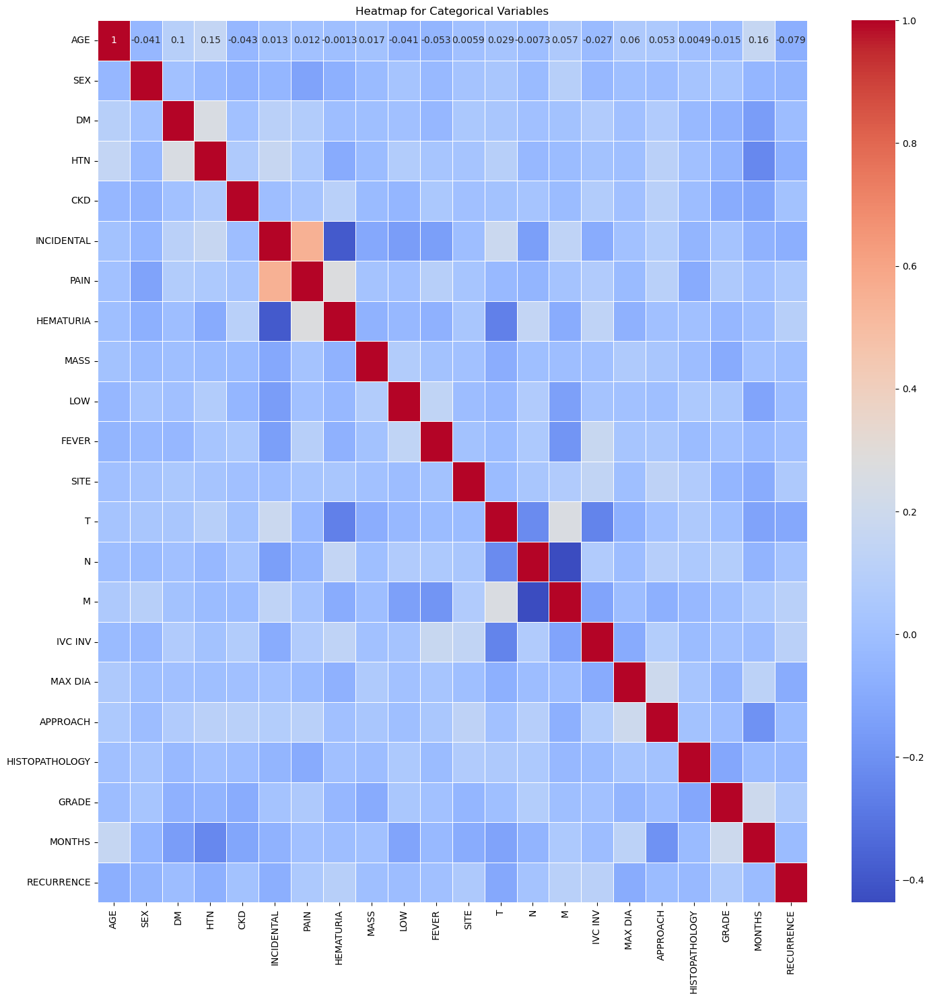

In [190]:
# Heatmap for Categorical Variables
plt.figure(figsize = (17, 17))
categorical_corr_matrix = data.apply(lambda x: pd.factorize(x)[0]).corr(method='pearson')
sns.heatmap(categorical_corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Heatmap for Categorical Variables')
plt.show()

In [241]:
X = data.copy()
X

,AGE,SEX,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,...,T,N,M,IVC INV,MAX DIA,APPROACH,HISTOPATHOLOGY,GRADE,MONTHS,RECURRENCE
0,32,M,0,0,0,0,1,0,0,0.0,...,2,0,1,0,8.0,2,clear cell,2.0,95,0
1,45,F,0,0,0,0,1,1,0,0.0,...,4,1,1,0,4.9,1,clear cell,2.0,95,0
2,47,M,0,0,0,1,0,0,0,0.0,...,3b,0,1,1,9.0,1,clear cell,3.0,95,0
3,58,M,0,0,0,0,0,1,0,0.0,...,3a,0,0,0,7.0,2,clear cell,2.0,95,1
4,22,M,0,0,0,0,1,0,0,0.0,...,2b,0,0,0,10.4,1,clear cell,2.0,94,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690,64,M,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,8.0,1,clear cell,4.0,18,0
691,49,M,0,0,0,0,0,1,0,0.0,...,2a,0,0,0,10.0,1,clear cell,3.0,18,0
692,73,M,0,1,0,0,0,1,0,0.0,...,3b,0,0,1,7.5,2,clear cell,1.0,18,0
693,65,F,0,0,0,0,1,0,0,0.0,...,3a,0,0,0,10.0,1,clear cell,1.0,18,0


In [192]:
y = X.pop('RECURRENCE')
y

0      0
1      0
2      0
3      1
4      0
      ..
690    0
691    0
692    0
693    0
694    0
Name: RECURRENCE, Length: 695, dtype: int64

In [242]:
X.loc[64, 'LOW'] = 0

In [243]:
X.loc[X.GRADE.isna(), 'GRADE'] = 2 # mean imputation

In [195]:
X.GRADE.value_counts()

GRADE
2.0    290
1.0    226
3.0    123
4.0     56
Name: count, dtype: int64

In [196]:
X.GRADE.mean()

2.01294964028777

In [197]:
X.loc[0, 'T'] = '2a'

In [198]:
X = pd.get_dummies(X, columns = ['SEX', 'SITE', 'HISTOPATHOLOGY'])

In [199]:
sorted(X['T'].unique())

['1a', '1b', '2a', '2b', '3a', '3b', '3c', '4']

In [200]:
ordinal_T_mapping = {'1a':1, '1b':2, '2a':3, '2b':4, '3a':5, '3b':6, '3c':7, '4':8}
X['T_ENCODED'] = X['T'].replace(ordinal_T_mapping)

In [201]:
X['T_ENCODED']

0      3
1      8
2      6
3      5
4      4
      ..
690    5
691    3
692    6
693    5
694    5
Name: T_ENCODED, Length: 695, dtype: int64

In [202]:
X.pop('T')

0      2a
1       4
2      3b
3      3a
4      2b
       ..
690    3a
691    2a
692    3b
693    3a
694    3a
Name: T, Length: 695, dtype: object

In [203]:
X

,AGE,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,FEVER,...,GRADE,MONTHS,SEX_F,SEX_M,SITE_b/l,SITE_left,SITE_right,HISTOPATHOLOGY_clear cell,HISTOPATHOLOGY_papillary,T_ENCODED
0,32,0,0,0,0,1,0,0,0.0,0,...,2.0,95,False,True,False,True,False,True,False,3
1,45,0,0,0,0,1,1,0,0.0,1,...,2.0,95,True,False,False,False,True,True,False,8
2,47,0,0,0,1,0,0,0,0.0,0,...,3.0,95,False,True,False,False,True,True,False,6
3,58,0,0,0,0,0,1,0,0.0,0,...,2.0,95,False,True,False,False,True,True,False,5
4,22,0,0,0,0,1,0,0,0.0,0,...,2.0,94,False,True,False,True,False,True,False,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690,64,0,0,0,0,1,0,0,0.0,0,...,4.0,18,False,True,False,False,True,True,False,5
691,49,0,0,0,0,0,1,0,0.0,0,...,3.0,18,False,True,False,False,True,True,False,3
692,73,0,1,0,0,0,1,0,0.0,0,...,1.0,18,False,True,False,False,True,True,False,6
693,65,0,0,0,0,1,0,0,0.0,0,...,1.0,18,True,False,False,True,False,True,False,5


In [204]:
X.rename(columns = {'SITE_b/l':'SITE_B_L', 'SITE_left':'SITE_LEFT', 'SITE_right':'SITE_RIGHT', 
                    'HISTOPATHOLOGY_clear cell':'HISTOPATHOLOGY_CLEAR_CELL',
                    'HISTOPATHOLOGY_papillary':'HISTOPATHOLOGY_PAPILLARY'}, inplace = True)

In [205]:
X

,AGE,DM,HTN,CKD,INCIDENTAL,PAIN,HEMATURIA,MASS,LOW,FEVER,...,GRADE,MONTHS,SEX_F,SEX_M,SITE_B_L,SITE_LEFT,SITE_RIGHT,HISTOPATHOLOGY_CLEAR_CELL,HISTOPATHOLOGY_PAPILLARY,T_ENCODED
0,32,0,0,0,0,1,0,0,0.0,0,...,2.0,95,False,True,False,True,False,True,False,3
1,45,0,0,0,0,1,1,0,0.0,1,...,2.0,95,True,False,False,False,True,True,False,8
2,47,0,0,0,1,0,0,0,0.0,0,...,3.0,95,False,True,False,False,True,True,False,6
3,58,0,0,0,0,0,1,0,0.0,0,...,2.0,95,False,True,False,False,True,True,False,5
4,22,0,0,0,0,1,0,0,0.0,0,...,2.0,94,False,True,False,True,False,True,False,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
690,64,0,0,0,0,1,0,0,0.0,0,...,4.0,18,False,True,False,False,True,True,False,5
691,49,0,0,0,0,0,1,0,0.0,0,...,3.0,18,False,True,False,False,True,True,False,3
692,73,0,1,0,0,0,1,0,0.0,0,...,1.0,18,False,True,False,False,True,True,False,6
693,65,0,0,0,0,1,0,0,0.0,0,...,1.0,18,True,False,False,True,False,True,False,5


In [206]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [208]:
X[num_cont_cols]

,AGE,MAX DIA,MONTHS
0,32,8.0,95
1,45,4.9,95
2,47,9.0,95
3,58,7.0,95
4,22,10.4,94
...,...,...,...
690,64,8.0,18
691,49,10.0,18
692,73,7.5,18
693,65,10.0,18


In [209]:
pca_cont = PCA(n_components = 3)
X_pca_cont = pca_cont.fit_transform(X[num_cont_cols])

In [210]:
explained_variance_ratios = pca_cont.explained_variance_ratio_
explained_variance_ratios

array([0.70848289, 0.27302664, 0.01849047])

In [211]:
test_X_cont = X[['MAX DIA', 'MONTHS', 'AGE']].copy()
test_X_cont

,MAX DIA,MONTHS,AGE
0,8.0,95,32
1,4.9,95,45
2,9.0,95,47
3,7.0,95,58
4,10.4,94,22
...,...,...,...
690,8.0,18,64
691,10.0,18,49
692,7.5,18,73
693,10.0,18,65


In [ ]:
loadings = pca_cont.components_
loadings # AGE, MAX DIA, MONTHS

In [213]:
toy_pca_cont = PCA(n_components = 3)
toy_X_pca = toy_pca_cont.fit_transform(test_X_cont)
toy_explained_variance_ratios = toy_pca_cont.explained_variance_ratio_
toy_explained_variance_ratios

array([0.70848289, 0.27302664, 0.01849047])

In [214]:
toy_loadings = toy_pca_cont.components_
toy_loadings

array([[ 0.01132099,  0.99773104, -0.06636718],
       [-0.00602707, -0.06630214, -0.99778139],
       [ 0.99991775, -0.01169587, -0.00526279]])

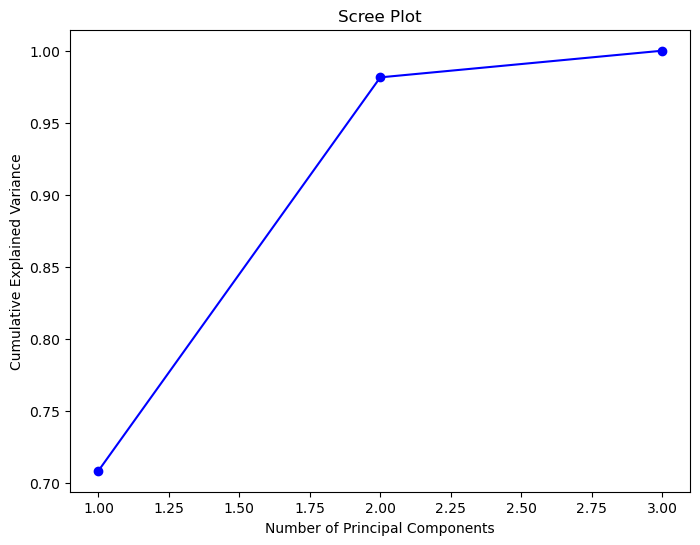

In [215]:
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(explained_variance_ratios)

# Plot the scree plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratios) + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [216]:
# Create a toy DataFrame with 20 features and 100 samples
np.random.seed(42)
toy_X, _ = make_classification(n_samples=100, n_features=20, n_informative=10, n_redundant=5)

columns = [f"Feature_{i+1}" for i in range(toy_X.shape[1])]
toy_df = pd.DataFrame(toy_X, columns=columns)

# Display the original DataFrame
print("Original DataFrame:")
display(toy_df.head())

# a) PCA with n_components = 10
pca_10 = PCA(n_components=10)
toy_X_pca_10 = pca_10.fit_transform(toy_df)
toy_exp_10 = pca_10.explained_variance_ratio_

# b) PCA with n_components = 0.95
pca_95 = PCA(n_components=0.95)
toy_X_pca_95 = pca_95.fit_transform(toy_df)
toy_exp_95 = pca_10.explained_variance_ratio_

# Display the results
print("\nResults for PCA with n_components = 10:")
display(pd.DataFrame(toy_X_pca_10, columns=[f"PC_{i+1}" for i in range(toy_X_pca_10.shape[1])]).head())

print("\nResults for PCA with n_components = 0.95:")
display(pd.DataFrame(toy_X_pca_95, columns=[f"PC_{i+1}" for i in range(toy_X_pca_95.shape[1])]).head())

Original DataFrame:


,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Feature_13,Feature_14,Feature_15,Feature_16,Feature_17,Feature_18,Feature_19,Feature_20
0,6.304906,0.034349,-3.387938,2.056207,2.941466,1.382517,4.616747,-0.947949,1.162520,-1.966357,-3.012262,-1.044809,-1.363915,-0.955303,0.660895,-1.103208,-0.839210,-1.741938,-1.592160,-1.089363
1,-0.063685,-3.294023,-0.571786,0.742127,-1.621519,0.272906,1.255334,0.338912,3.003377,1.639965,-0.977231,1.314914,0.842028,-0.267202,3.003704,0.075434,1.612278,0.017512,-2.549438,0.826585
2,0.579031,0.938669,-0.899203,-0.447322,2.826579,0.459925,0.707251,0.647983,1.876378,1.080048,-3.332660,1.873298,1.993781,-1.189857,0.094436,1.281016,-0.668144,2.265312,5.638523,-0.921926
3,-0.985726,-0.820114,-1.206066,1.392465,-0.904089,-3.658349,1.125556,3.684038,8.138848,-0.670620,-0.098847,1.000582,0.085260,-3.174892,0.363610,-0.250047,0.919154,-0.404722,0.417512,4.576543
4,8.666308,-1.916369,-1.514110,0.556230,2.885892,1.639189,3.084616,1.192908,-0.786709,1.328194,-2.574346,-0.250833,-2.697134,0.782610,1.598312,0.455888,-0.322680,-1.052825,-0.146292,-1.420012



Results for PCA with n_components = 10:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408,-1.482670
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746,1.953459
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804,-0.355403
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261,2.273382
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619,0.476069



Results for PCA with n_components = 0.95:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619


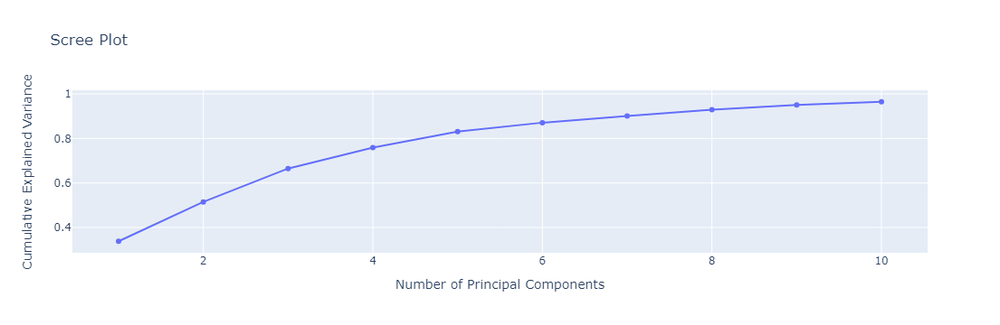

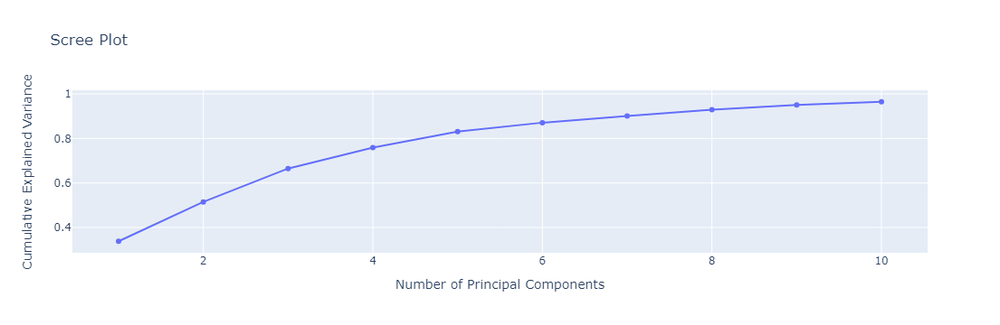

In [217]:
# Create a scree plot using Plotly Express
cum_var_10 = np.cumsum(toy_exp_10)
cum_var_95 = np.cumsum(toy_exp_95)

fig = px.line(x=range(1, len(toy_exp_10) + 1), y=cum_var_10, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

fig = px.line(x=range(1, len(toy_exp_95) + 1), y=cum_var_95, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

In [218]:
# b) PCA with n_components = 0.95
pca_all = PCA(n_components=20)
toy_X_pca_all = pca_all.fit_transform(toy_df)
toy_exp_all = pca_all.explained_variance_ratio_

# Display the results
print("\nResults for PCA with n_components = 20:")
display(pd.DataFrame(toy_X_pca_all, columns=[f"PC_{i+1}" for i in range(toy_X_pca_all.shape[1])]).head())


Results for PCA with n_components = 20:


,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11,PC_12,PC_13,PC_14,PC_15,PC_16,PC_17,PC_18,PC_19,PC_20
0,5.276307,-0.051209,-5.627402,2.587639,-2.952051,0.279158,-0.119904,2.292314,0.055408,-1.482670,2.941364,-1.225590,0.022428,-1.983973,0.385136,1.479760e-15,1.697053e-15,2.711103e-15,-2.969679e-16,-3.819789e-16
1,-1.206841,-0.169124,-3.239301,-1.288964,2.945922,1.459114,-1.668593,0.653996,-0.012746,1.953459,-0.482215,1.420854,1.377877,1.362346,-0.456055,7.766020e-15,1.092996e-15,-1.009401e-15,-3.318793e-16,-2.834199e-16
2,1.984030,0.261523,4.017954,-2.367850,-4.429521,-0.228269,-3.183571,2.696102,-0.300804,-0.355403,-0.940049,1.781885,-0.123572,-0.315227,0.651963,-2.340107e-15,4.805611e-15,-1.301327e-15,3.304160e-16,2.201361e-17
3,-1.462640,4.498810,-1.855227,-7.068096,0.915908,-1.911004,3.492289,0.065307,-0.975261,2.273382,0.382612,0.989215,-0.313183,0.541886,0.977918,-6.783654e-16,7.173596e-16,1.513309e-16,-4.519397e-16,-7.874677e-16
4,6.790582,-4.610049,-4.655456,2.427974,-3.675592,0.965748,0.233993,1.377269,1.404619,0.476069,-0.074131,0.412133,0.108797,0.138641,-0.462180,2.053477e-15,4.435890e-16,1.969640e-15,-2.307714e-16,9.959290e-16


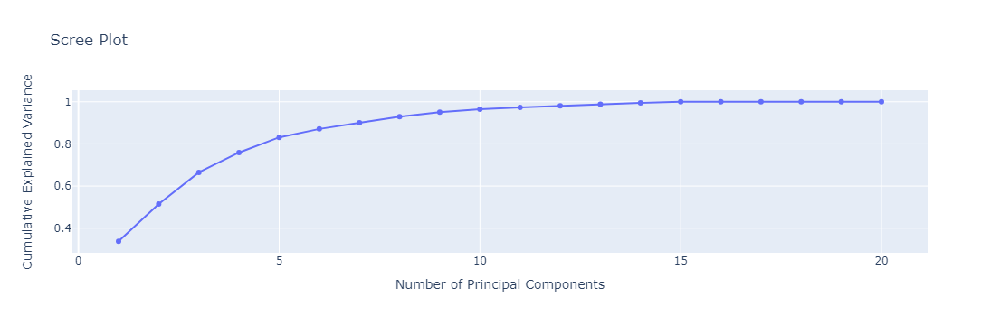

In [219]:
# Create a scree plot using Plotly Express
cum_var_all = np.cumsum(toy_exp_all)

fig = px.line(x=range(1, len(toy_exp_all) + 1), y=cum_var_all, 
              markers=True, title='Scree Plot',
              labels={'x': 'Number of Principal Components', 'y': 'Cumulative Explained Variance'})

fig.show()

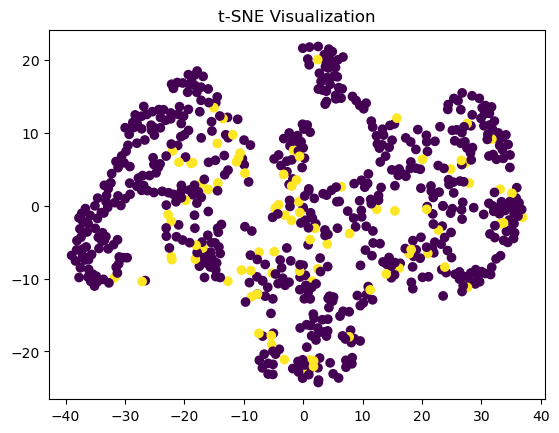

In [244]:
# Perform t-SNE on the feature matrix X
X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X[num_cont_cols])

# Scatter plot the t-SNE visualization
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=data['RECURRENCE'], cmap='viridis')
plt.title('t-SNE Visualization')
plt.show()

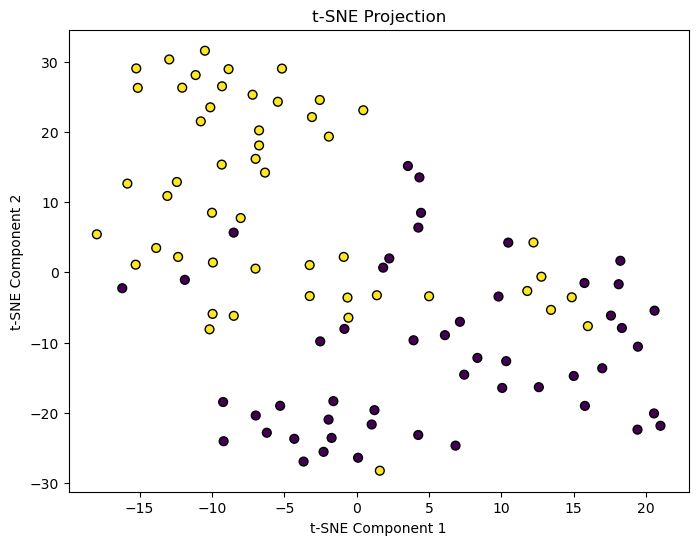

In [221]:
# Create a toy dataset
toy_X, toy_y = make_classification(n_samples=100, n_features=20, n_informative=10, n_redundant=5, random_state=42)

# t-SNE dimensionality reduction
tsne_model = TSNE(random_state=42, perplexity = 10)
toy_X_tsne = tsne_model.fit_transform(toy_X)

# Plot the t-SNE result
plt.figure(figsize=(8, 6))
plt.scatter(toy_X_tsne[:, 0], toy_X_tsne[:, 1], c=toy_y, cmap='viridis', edgecolor='k', s=40)
plt.title('t-SNE Projection')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



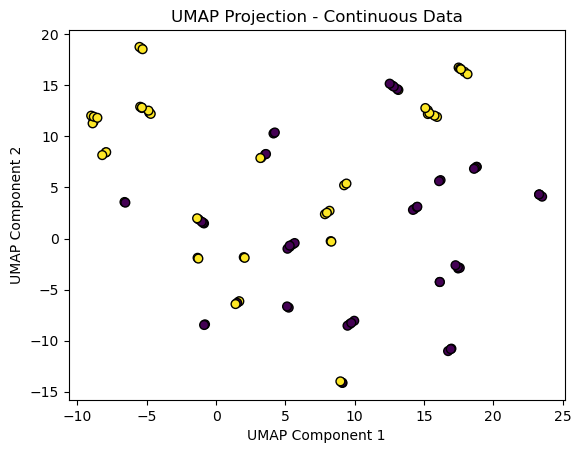

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



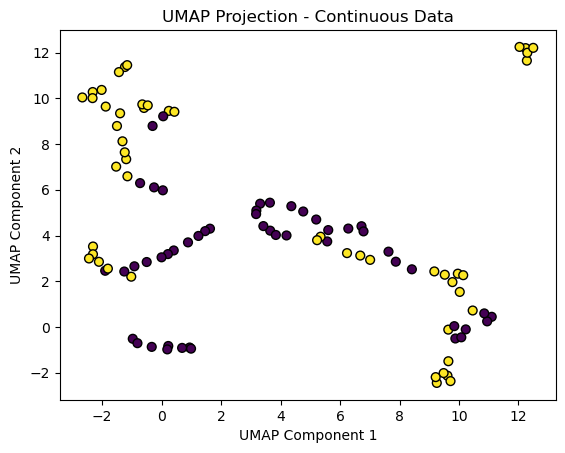

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



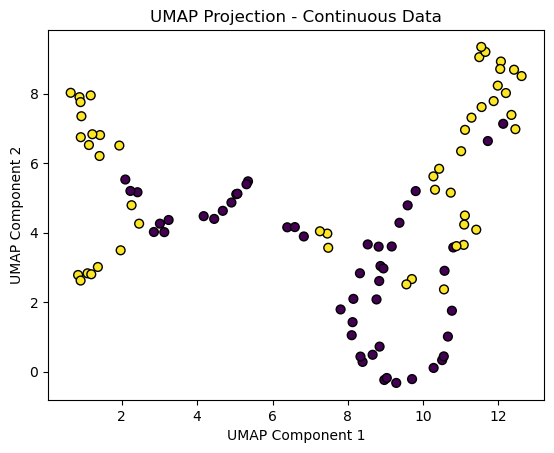

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



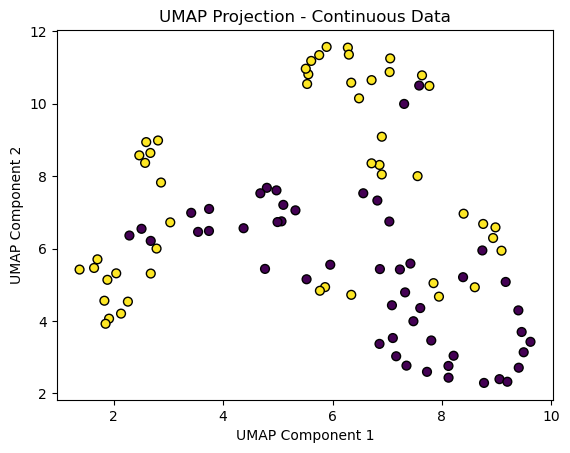

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



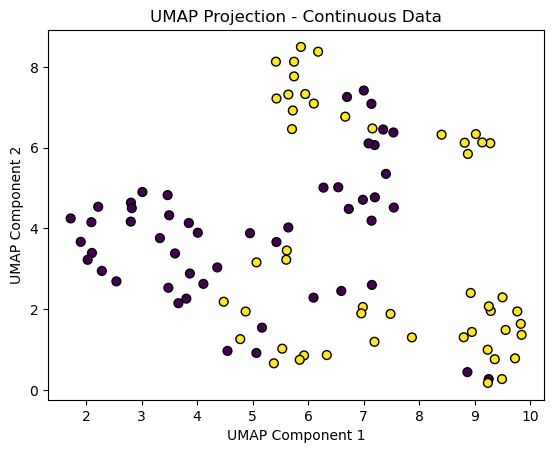

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



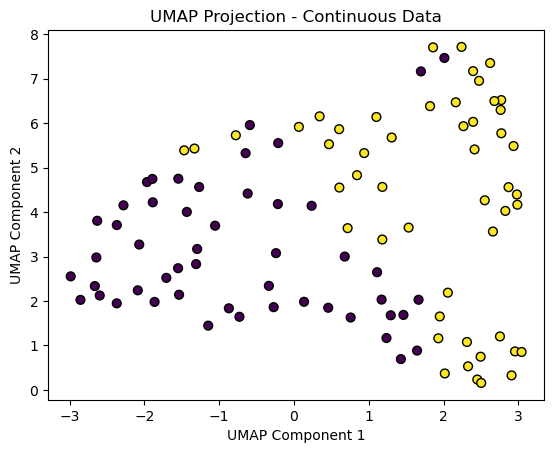

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



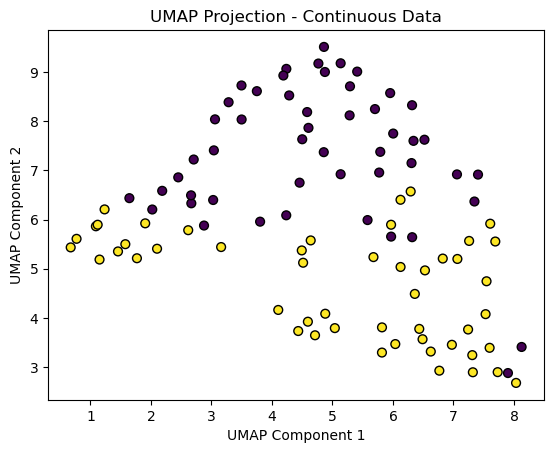

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



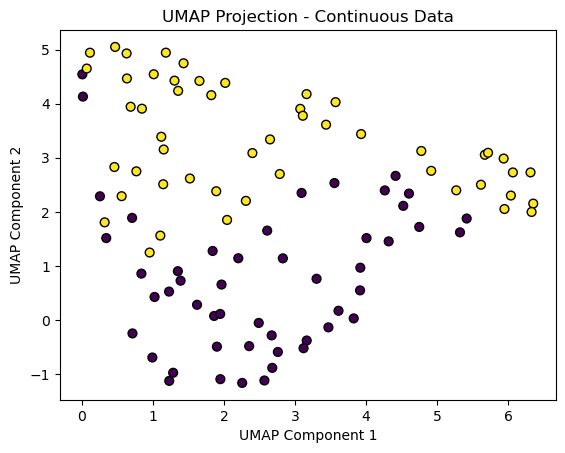

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



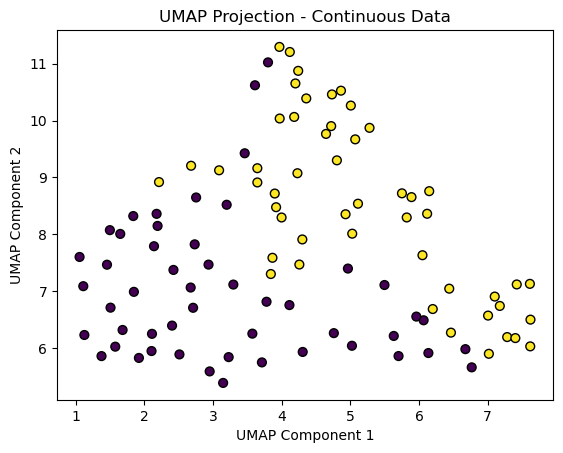

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



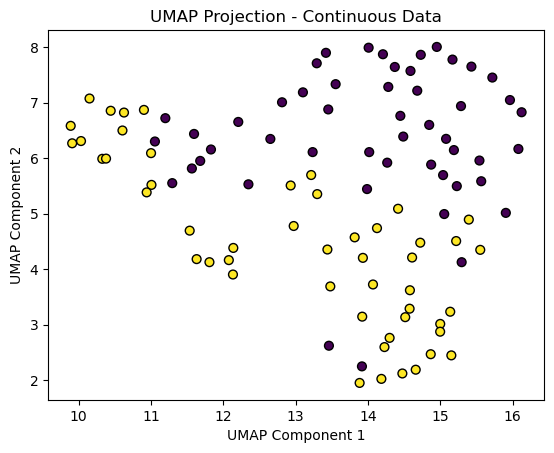

In [232]:
# Create a synthetic dataset with continuous features
for i in [2, 3, 4, 5, 7, 10, 12, 15, 18, 20]:
    # Create a synthetic dataset with continuous features and target labels
    X_continuous, y_continuous = make_classification(n_samples=100, n_features=5, n_informative=3, n_redundant=1, random_state=42)
    
    # Apply UMAP
    umap_model = UMAP(n_neighbors=i, min_dist=0.3, random_state=42)
    X_umap_continuous = umap_model.fit_transform(X_continuous)
    
    # Visualize the UMAP result
    plt.scatter(X_umap_continuous[:, 0], X_umap_continuous[:, 1], edgecolor='k', s=40, c = y_continuous)
    plt.title('UMAP Projection - Continuous Data')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

C:\Users\aniru\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:392: UserWarning:

Exited at iteration 2000 with accuracies 
[1.93520871e-15 7.63475696e-07 6.82533768e-07 7.86390432e-06]
not reaching the requested tolerance 3.0249357223510742e-06.
Use iteration 1596 instead with accuracy 
1.3672977715755298e-06.


C:\Users\aniru\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:392: UserWarning:

Exited postprocessing with accuracies 
[5.46816813e-15 5.87723420e-07 8.17714711e-07 4.06375420e-06]
not reaching the requested tolerance 3.0249357223510742e-06.



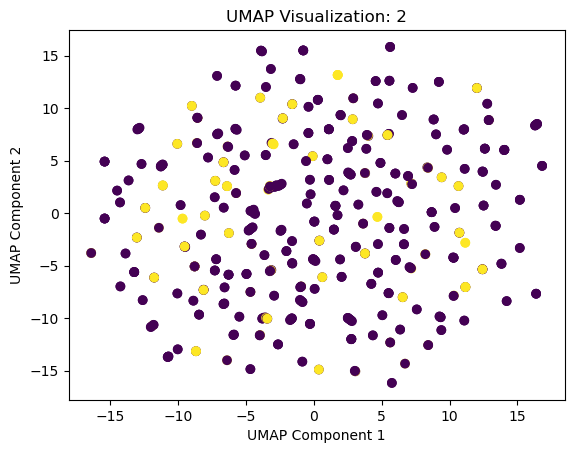

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



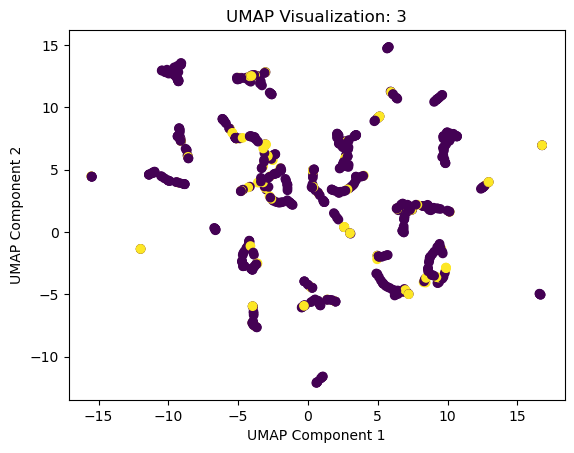

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



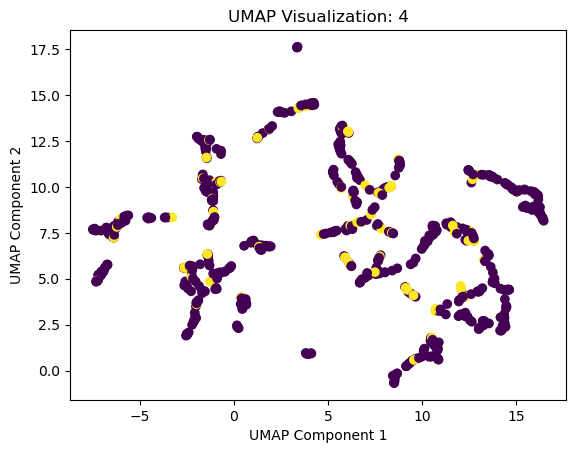

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



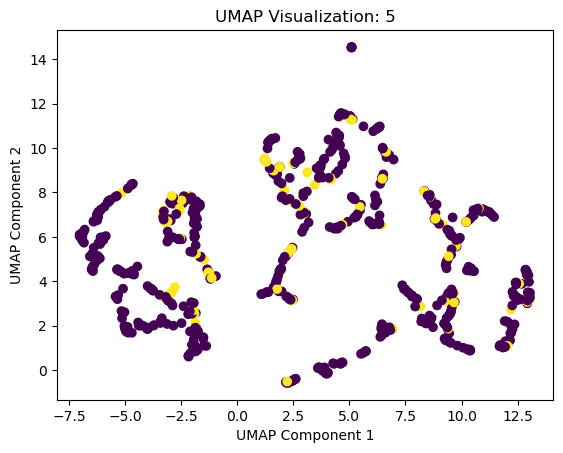

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



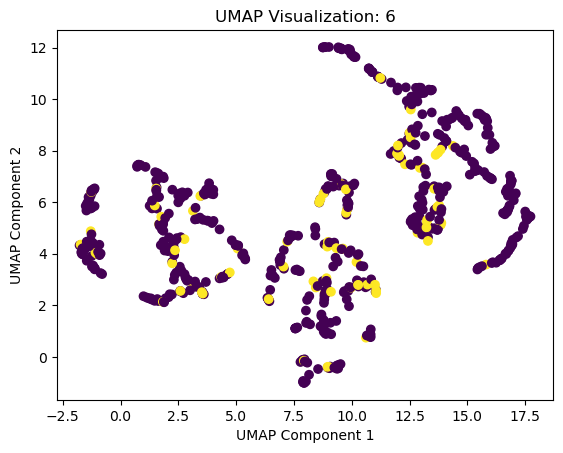

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



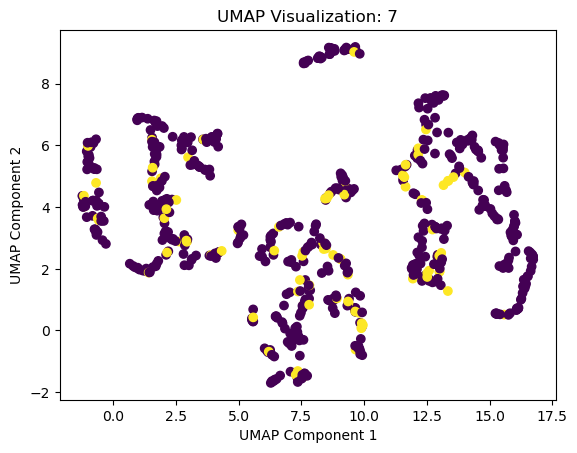

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



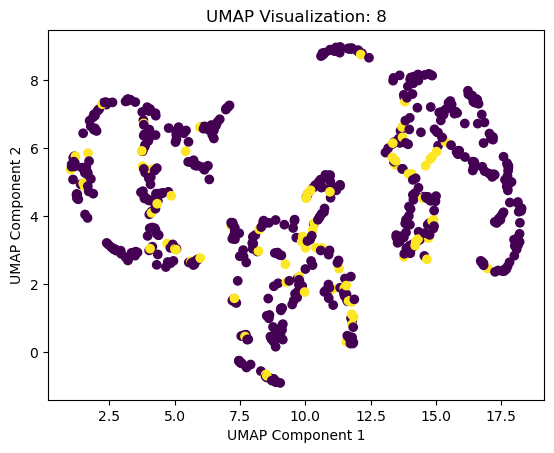

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



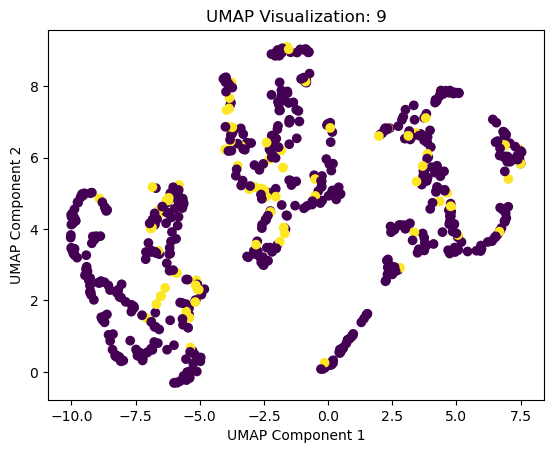

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



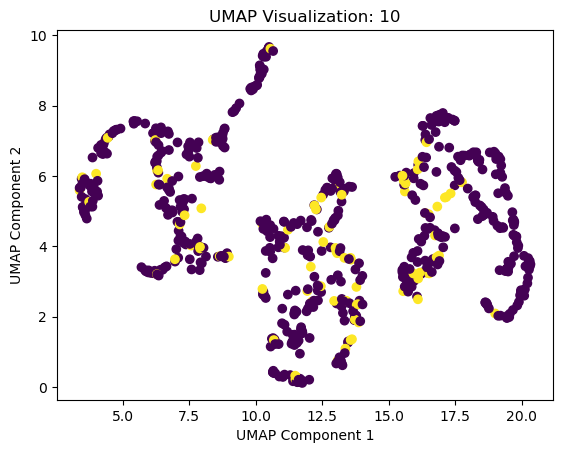

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



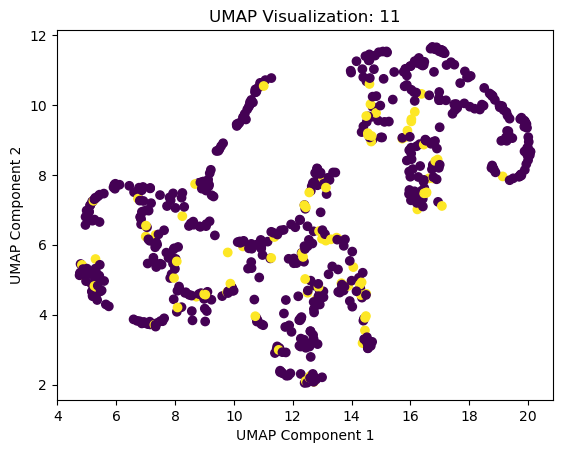

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



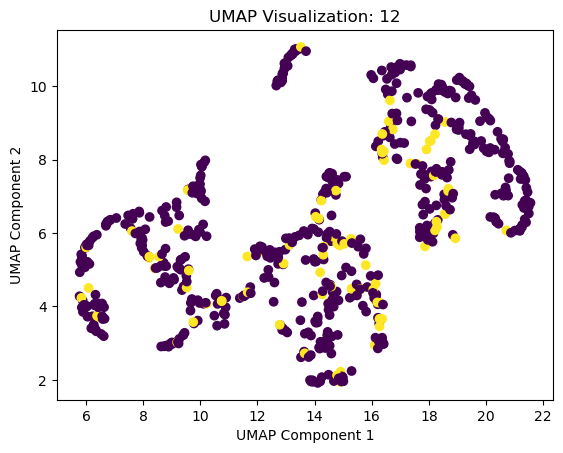

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



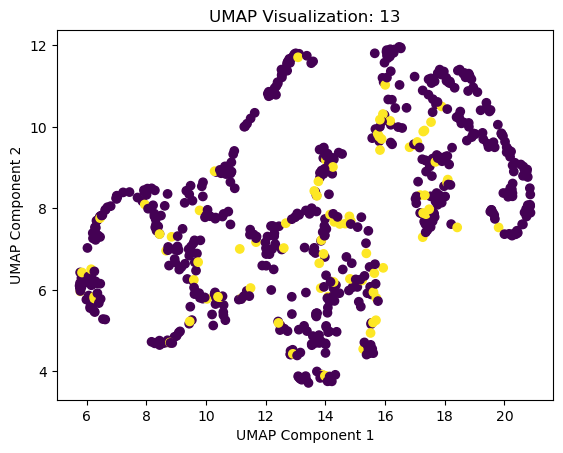

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



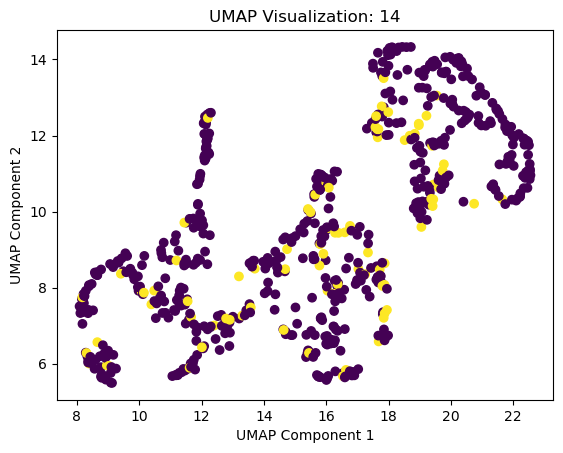

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



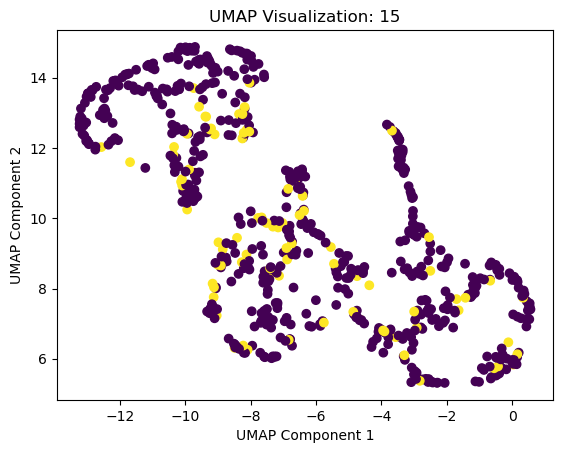

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



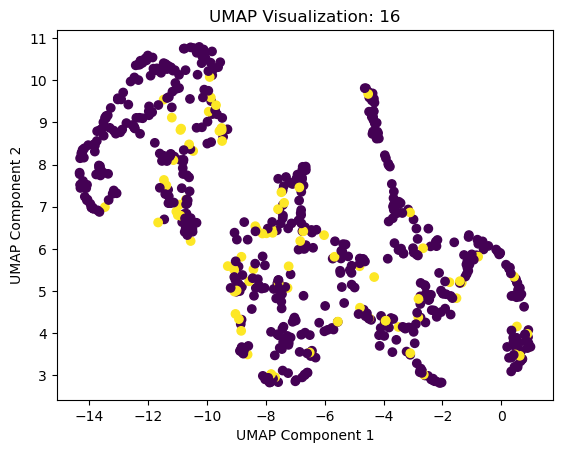

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



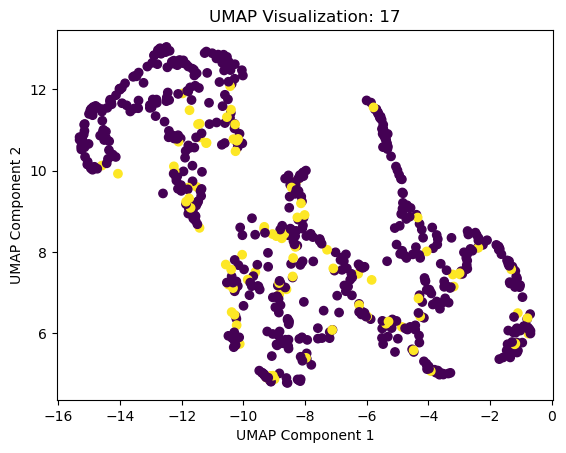

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



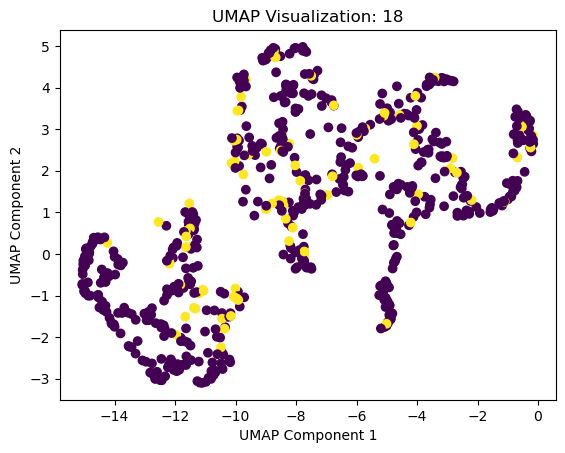

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



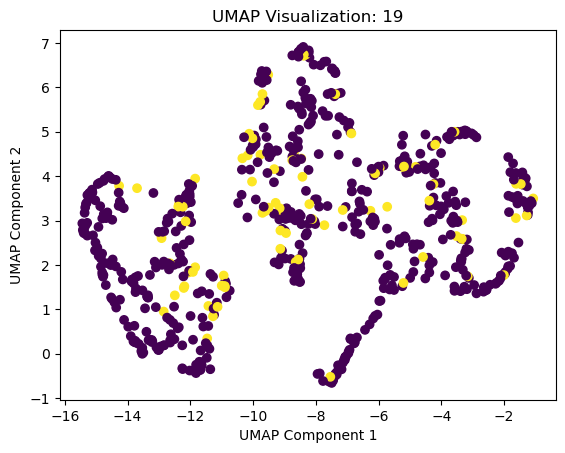

C:\Users\aniru\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



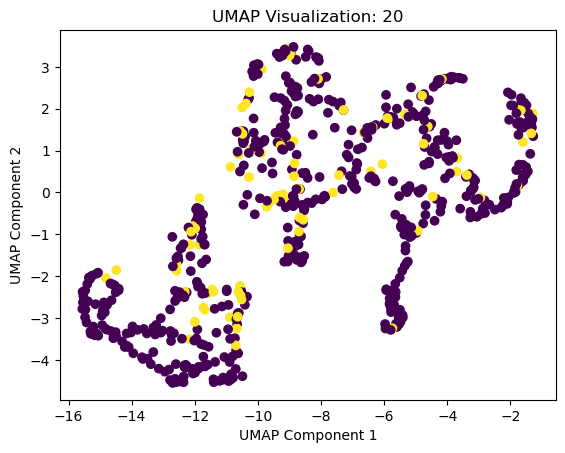

In [236]:
for i in range(2, 21):
    umap_model = UMAP(n_neighbors = i, n_components = 2, random_state = 42)
    umap_result = umap_model.fit_transform(X)
    plt.scatter(umap_result[:, 0], umap_result[:, 1], c=y, cmap='viridis')
    plt.title(f'UMAP Visualization: {i}')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()

In [238]:
data.RECURRENCE.value_counts()

RECURRENCE
0    608
1     87
Name: count, dtype: int64